# Init results

In [1]:
#%%capture
%load_ext autoreload
%autoreload 2
%matplotlib notebook

import os
import cortex
import numpy as np
import matplotlib.pyplot as pl
from matplotlib import cm
import sys
import yaml
import time
from collections import defaultdict as dd
from scipy.stats import sem, ks_2samp
import seaborn as sns
import pandas as pds
import dill
from skimage import filters

opj = os.path.join

sys.path.append("..")

from prfpy.stimulus import PRFStimulus2D
from prfpy.model import Iso2DGaussianModel, CSS_Iso2DGaussianModel, Norm_Iso2DGaussianModel, DoG_Iso2DGaussianModel
from prfpy.fit import Iso2DGaussianFitter, Norm_Iso2DGaussianFitter, DoG_Iso2DGaussianFitter, CSS_Iso2DGaussianFitter

from utils.preproc_utils import *
from utils.postproc_utils import *
from utils.visualize_results import visualize_results

from IPython.core.display import display, HTML

sound_file = '/Users/marcoaqil/Downloads/filling-your-inbox.mp3'

/Users/marcoaqil/anaconda3/envs/prfpy_2021/lib/python3.9/site-packages/nilearn/glm/__init__.py:55: FutureWarning: The nilearn.glm module is experimental. It may change in any future release of Nilearn.
  warn('The nilearn.glm module is experimental. '
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_94415/2656474303.py:33: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
#results object
current_results = results()
                        

## Combine & Process results

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/separate_conds_noCV/ZSC', 
                    timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses/',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC', 
                    timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/999999_tc', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/crossvalidated_tc', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=True,
                               screenshot_paths = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'])

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/TC_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [ ]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/allconds_nocv', 
                            timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

In [16]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/hrf_fit', 
                                timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 516/516 [00:32<00:00, 15.99it/s]


In [79]:
current_results.combine_results(results_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/prfpy/999999_allconds_hrffit_lisa', 
                                timecourse_folder='/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',
                               calculate_CCrsq=False,
                               calculate_noise_ceiling=False)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00, 13.24it/s]


In [80]:
##seemingly x and y were fixed in 999 all conds fit?
x = np.copy(current_results.main_dict['HCP']['fit-task-all_fit-runs-all']['999999']['Results']['Norm_abcd'][:,0])
y = np.copy(current_results.main_dict['HCP']['fit-task-all_fit-runs-all']['999999']['Results']['Norm_abcd'][:,1])
current_results.main_dict['HCP']['fit-task-all_fit-runs-all']['999999']['Results']['Norm_abcd'][:,0] = np.copy(y)
current_results.main_dict['HCP']['fit-task-all_fit-runs-all']['999999']['Results']['Norm_abcd'][:,1] = np.copy(x)

In [81]:
current_results.process_results(current_results.main_dict,
                                compute_suppression_index = False,
                                return_norm_profiles = False)

  0%|                                                                                                                                                    | 0/1 [00:00<?, ?it/s]

  0%|                                                                                                                                                    | 0/1 [00:00<?, ?it/s]../utils/postproc_utils.py:508: RuntimeWarning: divide by zero encountered in true_divide
  prf = params[...,3] * np.exp(-0.5*x[...,np.newaxis]**2 / params[...,2]**2)
../utils/postproc_utils.py:379: RuntimeWarning: invalid value encountered in true_divide
  processed_results['Size ratio (sigma_2/sigma_1)'][k2][mask] = v2[:,6]/v2[:,2]
../utils/postproc_utils.py:382: RuntimeWarning: invalid value encountered in true_divide
  processed_results['Ratio (B/D)'][k2][mask] = v2[:,7]/v2[:,8]
../utils/postproc_utils.py:383: RuntimeWarning: divide by zero encountered in true_divide
  processed_results['Suppression Index (full)'][k2][mask] = (v2[:,5] *

# Init visualize results

In [3]:
vis_res = visualize_results(current_results)

## Fix HCP MSMall ordering (run once on HCP data)

In [83]:
#fix HCP ordering
if 'HCP' in vis_res.main_dict:
    hcp_atlas_mask_path = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/L.atlasroi.59k_fs_LR.shape.gii',
                          '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/R.atlasroi.59k_fs_LR.shape.gii']
    vis_res.fix_hcp_ordering(vis_res.main_dict['HCP'], hcp_atlas_mask_path)

## Load previous visualize_result.main_dict

In [4]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, 
#HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20 (these 99 are bar-only), HCP_cv (tcfit), HCP_tc_nocv, HCP_allruns_allconds_78sj 
#HCP_hrffit #HCP_99hrffit (this99  is all conditions) #hrffit_onlyfsavcvrsq
with open('/Volumes/Crucial X8/maindict_HCP_allruns_allconds_78sj.pickle', 'rb') as handle:
    vis_res.main_dict=dill.load(handle)

In [8]:
pla = vis_res.main_dict['fsaverage']['fit-task-all_fit-runs-all']['fsaverage']['Processed Results']['Polar Angle']['Norm_abcd']

In [11]:
vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['Polar Angle']['Norm_abcd'] = pla

## Save current visualize_result.main_dict

In [13]:
with open('/Volumes/Crucial X8/maindict_HCP_**.pickle', 'wb') as handle:
     dill.dump(vis_res.main_dict, handle)

## Load/Save rois (run always)

In [5]:
#this function parses or imports labaled ROIs for all subjects (run always)
#set to list of ROI names to output indices of rois for roi-only fitting. empty list for no output
output_rois = []#['custom.OccPole', 'custom.V1','custom.V2','custom.V3','custom.hV4','custom.VO',
                      #'custom.V3AB','custom.LO','custom.TO','custom.IPS','custom.FO']
    
#import flatmaps from freesurfer, if created, and import freesurfer custom rois to pycortex overlays.svg (need pre-imported flatmaps for this)
import_flatmaps = False

output_rois_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP' #/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires
#freesurfer directory
fs_dir = '/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/freesurfer'

#HCP atlas path (without .{hemi}.gii)
hcp_atlas_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel' 

vis_res.define_rois_and_flatmaps(fs_dir, output_rois_path, import_flatmaps, output_rois, hcp_atlas_path)
    

Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HCP atlas to define ROIs
Using HC

## Project to fsaverage

In [ ]:
#projecting results to fsaverage surface
vis_res.project_to_fsaverage(models = ['Norm_abcd'], #'Noise Ceiling (RSq)'],
                             parameters = ['hrf_1','hrf_2','x_pos', 'y_pos','Norm Param. B','Norm Param. D','Size (sigma_1)','Size (sigma_2)','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)'],# 'Noise Ceiling'],#[
                             space_names = 'HCP',
                             analysis_names = ['fit-task-BAR_fit-runs-all','fit-task-BAR_fit-runs-CVmedian'],#'all', 
                             subject_ids = 'all',#['HCP_cvrsq'],#['725751','100610','765864','109123','158136']
                             hcp_atlas_mask_path = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/L.atlasroi.59k_fs_LR.shape.gii',
                                                    '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/R.atlasroi.59k_fs_LR.shape.gii'],
                             hcp_cii_file_path = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/100610/MNINonLinear/Results/tfMRI_RETBAR1_7T_AP/tfMRI_RETBAR1_7T_AP_Atlas_1.6mm_MSMAll_hp2000_clean.dtseries.nii',
                             hcp_old_sphere = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fs_LR-deformed_to-fsaverage.?.sphere.59k_fs_LR.surf.gii',
                             hcp_new_sphere = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fsaverage_std_sphere.?.164k_fsavg_?.surf.gii',
                             hcp_old_area = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fs_LR.?.midthickness_va_avg.59k_fs_LR.shape.gii',
                             hcp_new_area = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/atlas/resample_fsaverage/fsaverage.?.midthickness_va_avg.164k_fsavg_?.shape.gii',
                             hcp_temp_folder = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/temp_files')

In [68]:
vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian']['126426'].keys()

dict_keys(['Results', 'mask', 'analysis_info', 'Processed Results'])

In [10]:
for space, space_res in vis_res.main_dict.items(): 
    if space == 'fsaverage':
        for analysis, analysis_res in space_res.items():
#            if analysis == 'fit-task-BAR_fit-runs-CVmedian':
            for subj, subj_res in analysis_res.items():
                if subj == 'fsaverage_cvrsq': 
                    for receptor in ['GABA_A', '5-HTT', '5-HT2A', '5-HT1A', '5-HT1B', '5-HT4']: #['GABA_A']:#
                        if receptor != 'GABA_A':
                            rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/5-HT_atlas/{receptor}/{receptor}.mean.bmax.mrtm2.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
                                                 nb.load(f"/Users/marcoaqil/Downloads/5-HT_atlas/{receptor}/{receptor}.mean.bmax.mrtm2.nopvc.fsaverage.rh.sm10.nii.gz").get_data()[:,0,0,0]))
                        else:
                            rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
                                                 nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.rh.sm10.nii.gz").get_data()[:,0,0,0]))


                        subj_res['Processed Results']['Receptor Maps'][receptor] = np.copy(rec_map)    
                        
                        if receptor in ['5-HT2A', '5-HT1A']:
                            subj_res['Processed Results']['Receptor Maps'][f"inv {receptor}"] = 1/np.copy(rec_map)  
                        
os.system(f"open {sound_file}")

/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_97145/3334685043.py:12: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  rec_map = np.concatenate((nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.lh.sm10.nii.gz").get_data()[:,0,0,0],
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_97145/3334685043.py:13: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  nb.load(f"/Users/marcoaqil/Downloads/bzr_atlas/Bmax.nopvc.fsaverage.rh.sm10.nii.

0

In [ ]:
space='HCP'
an='fit-task-all_fit-runs-all'
for sj in vis_res.main_dict[space][an]:
    print(sj)
    print(len(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']))
    print((vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']==0).sum())
    print(np.isnan(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd']).sum())
    print((~np.isfinite(vis_res.main_dict[space][an][sj]['Processed Results']['RSq']['Norm_abcd'])).sum())
    print('\n')

In [ ]:
#alpha = vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Alpha']['all']
#np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10]>-0.86)
#np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['RSq']['Norm_abcd']>0.03)
np.nanquantile(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10],0.9)

In [ ]:
np.sum(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'][alpha>-10]>-0.4)

In [ ]:
pl.figure()
alpha = vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['Alpha']['Norm_abcd']
pl.hist(vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-CVmedian']['fsaverage']['Processed Results']['RSq']['Norm_abcd'][alpha>rsq_thresh],bins=200)

# Surface plots

HCP fit-task-all_fit-runs-all 100610
HCP fit-task-all_fit-runs-all 102311
HCP fit-task-all_fit-runs-all 102816
HCP fit-task-all_fit-runs-all 104416
HCP fit-task-all_fit-runs-all 105923
HCP fit-task-all_fit-runs-all 108323
HCP fit-task-all_fit-runs-all 109123
HCP fit-task-all_fit-runs-all 111312
HCP fit-task-all_fit-runs-all 111514
HCP fit-task-all_fit-runs-all 114823
HCP fit-task-all_fit-runs-all 115825
HCP fit-task-all_fit-runs-all 116726
HCP fit-task-all_fit-runs-all 118225
HCP fit-task-all_fit-runs-all 125525
HCP fit-task-all_fit-runs-all 126426
HCP fit-task-all_fit-runs-all 128935
HCP fit-task-all_fit-runs-all 130114
HCP fit-task-all_fit-runs-all 130518
HCP fit-task-all_fit-runs-all 131217
HCP fit-task-all_fit-runs-all 131722
HCP fit-task-all_fit-runs-all 132118
HCP fit-task-all_fit-runs-all 134627
HCP fit-task-all_fit-runs-all 134829
HCP fit-task-all_fit-runs-all 135124
HCP fit-task-all_fit-runs-all 137128
HCP fit-task-all_fit-runs-all 140117
HCP fit-task-all_fit-runs-all 144226
H

/Users/marcoaqil/pycortex/cortex/dataset/views.py:207: UserWarning: Trying to register the cmap 'hsvx2' which already exists.
  cm.register_cmap(self.cmap,cmap)


<IPython.core.display.Javascript object>


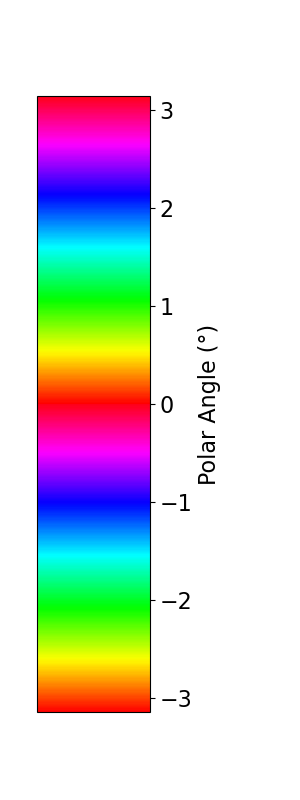

<IPython.core.display.Javascript object>


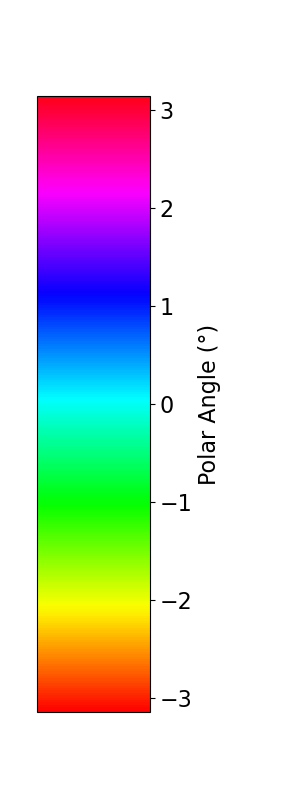

Started server on port 46573
-----


In [6]:
%matplotlib notebook
#visualize subject-specific ROIs and timeseries stats
#output FS-format polar angle and eccentricity maps for freeview ROI plotting
vis_res.output_freesurfer_maps = False
#compare t1w and surface fitting rsq and polar angle maps
vis_res.compare_volume_surface = False

vis_res.plot_rois_cortex = False
vis_res.plot_stats_cortex = False
vis_res.plot_rsq_cortex = False
vis_res.plot_ecc_cortex = False
vis_res.plot_polar_cortex = True
vis_res.plot_size_cortex = False
vis_res.plot_amp_cortex = False
vis_res.plot_css_exp_cortex = False
vis_res.plot_surround_size_cortex = False
vis_res.plot_suppression_index_cortex = False
vis_res.plot_norm_baselines_cortex = False
vis_res.plot_size_ratio_cortex = False
vis_res.plot_receptors_cortex = False
#set these to None if not wanted. 
vis_res.plot_correlations_per_roi = None#{'x_params_topl':['Norm Param. B'], 'y_params_topl':['Receptor Maps'],
                                    # 'x_params_lowl':['Norm_abcd'], 'y_params_lowl':['GABA'],
                                    # 'atlas':'glasser'} #glasser, HCPQ1Q6, custom
#note there is no quantile exclusion here, so the means may suffer from extreme values. just a visualization tool; use the quant_plots if want to be sure
vis_res.plot_means_per_roi = None# {'y_params_topl':['Norm Param. B','Norm Param. D','Size ratio (sigma_2/sigma_1)'], 
                                 #   'y_params_lowl':['Norm_abcd'], 
                                 #    'atlas':'glasser'} #glasser, HCPQ1Q6, custom

rsq_thresh = 0.0
rsq_max_opacity = 0.151#rsq_thresh+1e-6
#change to 'all' to plot whole brain. string single ROI for single ROI
rois = 'Brain'#['custom.hV4']#'all'#['custom.hV4']#'['custom.hV4']#'all'#['custom.hV4']#'all'#['custom.V1', 'custom.V2', 'custom.V3']
space_names ='fsaverage'# 'fsnative'#'fsaverage'#'HCP'#
analysis_names = 'fit-task-all_fit-runs-all'#'Mean analysis''fit-task-BAR_fit-runs-CVmedian'#'fit-task-2R_fit-runs-all'#'fit-task-4R_fit-runs-all'# #'Mean analysis'#
subject_ids = ['fsaverage']#['fsaverage_cvrsq']#['fsaverage_hcp1sthalf','fsaverage_hcp2ndhalf']#['sub-006']##'all'#['sub-001']

threshold_li = 0#filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.pycortex_plots(rois, rsq_thresh, space_names, analysis_names, subject_ids, rsq_max_opacity = rsq_max_opacity, pycortex_cmap = 'jet_r',#'Jet_2D_alpha', #'nipy_spectral_2D_alpha' #Jet_2D_alpha                    
                       #specify this path to save colormap pDFs
                       pycortex_image_path = '/Volumes/Crucial X8/PRFMapping/Figures/pyc_surface_maps',
                       timecourse_folder = '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',#'/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses',#'/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses',##'
                       screenshot_paths = ['/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR1_small.hdf5',
                                           '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR2_small.hdf5',
                                           '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETCW_small.hdf5',
                                           '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETCCW_small.hdf5',
                                           '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETEXP_small.hdf5',
                                          '/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETCON_small.hdf5'])
                                            #'/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/HCP_data/7T_RETBAR_small.hdf5'
                                            #'/Volumes/Crucial X8/PRFMapping/PRFMapping-Deriv-hires/prfpy/FS7_results/timecourses/task-2R_screenshots'

In [13]:
vis_res.js_handle_dict[space_names][analysis_names][subject_ids[0]].keys()

dict_keys(['polar'])

In [14]:
save_views=True
subj = subject_ids[0]
if save_views:
    #capture pycortex views
    #sub-006 camera coords 179 109 259 /// sub-007 183 126 250

    param_to_save = 'polar'
    rec = '99fitall'#'5-HT1B'
    js_handle_to_save = vis_res.js_handle_dict[space_names][analysis_names][subj][param_to_save]
    #js_handle_to_save._capture_view()
        
    base_str = f"{subj}_{param_to_save}_{rec}"#'_Norm-Neural baseline (B)'
    
    # views = dict(dorsal=dict(radius=191, altitude=73, azimuth=178, pivot=0),
    #              medial=dict(radius=10, altitude=101, azimuth=359, pivot=167),
    #              lateral=dict(radius=277, altitude=90, azimuth=177, pivot=123),
    #              ventral=dict(radius=221, altitude=131, azimuth=175, pivot=0)
    #   
    
    #pnas
#     if subj == 'sub-007':
#         views = dict(occipital=dict(azimuth=183, altitude=126, radius=250, pivot=0))
#     elif subj == 'sub-006':
#         views = dict(occipital=dict(azimuth=179, altitude=109, radius=259, pivot=0))
#     #flatmaps in presentation    
#     unfold = 1
#     views = dict(flat=dict(pivot=180, radius=150, azimuth=180, altitude=0.1, target=[0,-100,0], 
#                                    specularity=0))

    #unfold = 0 is folded; 0.5 is unfolded; 1 is flatmap (if present; otherwise)
    unfold=0.5
    views = dict(occipital=dict(azimuth=191, altitude=103, radius=261, pivot=0, target=[-10,20,25], specularity=0))

    
    
    vis_res.save_pycortex_views(js_handle_to_save, base_str, unfold, views, image_path = vis_res.pycortex_image_path)
        

{'camera.azimuth': [191], 'camera.altitude': [103], 'camera.radius': [261], 'surface.{subject}.pivot': [0], 'camera.target': [-10, 20, 25], 'surface.{subject}.specularity': [0], 'surface.{subject}.unfold': [0.5]}


<IPython.core.display.Javascript object>


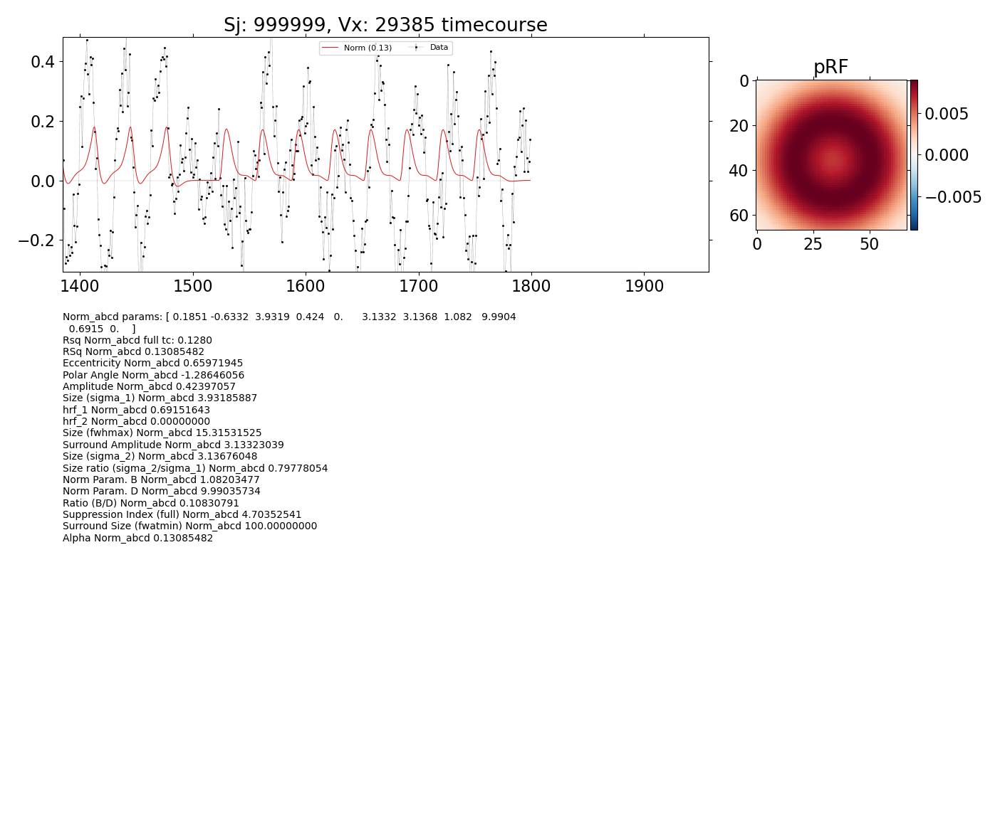

In [94]:
 vis_res.f #45227

<IPython.core.display.Javascript object>


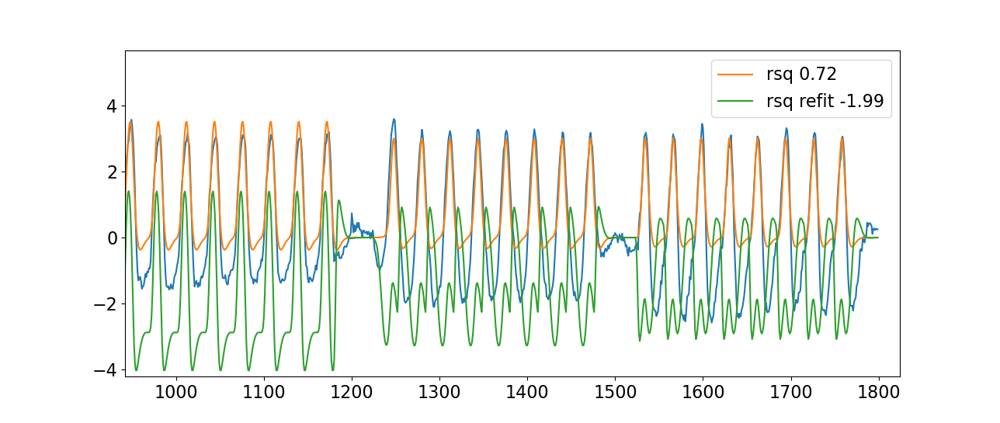

[  0.4764  -3.6918   1.3554   1.8175   0.       0.       2.9871   0.0002
 100.0016   1.0807   0.    ]
0.7164560524731959
-1.9868089016835815


In [61]:
vertex_plot_index = 45022
pl.figure()
idx = np.sum(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']['999999']['mask'][:vertex_plot_index])
tc_bar_0 = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/999999_timecourse_space-HCP_task-BAR1_run-0.npy')[idx]
tc_bar_1 = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/999999_timecourse_space-HCP_task-BAR2_run-0.npy')[idx]
tc_cw = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/999999_timecourse_space-HCP_task-CW_run-0.npy')[idx]
tc_ccw = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/999999_timecourse_space-HCP_task-CCW_run-0.npy')[idx]
tc_exp = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/999999_timecourse_space-HCP_task-EXP_run-0.npy')[idx]
tc_con = np.load('/Volumes/Crucial X8/PRFMapping/PRFMapping-HCP/timecourses/999999_timecourse_space-HCP_task-CON_run-0.npy')[idx]
tc_conc = np.concatenate((tc_bar_0,tc_bar_1,tc_cw,tc_ccw,tc_exp,tc_con))
pl.plot(tc_conc)
par_1 = np.copy(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']['999999']['Results']['Norm_abcd'][vertex_plot_index,:-1])
par_1[0],par_1[1] = par_1[1],par_1[0]
print(par_1)

pr = vis_res.prf_models['Norm_abcd'].return_prediction(*list(par_1))[0]
rsq = 1- ((tc_conc-pr)**2).sum()/(np.var(tc_conc)*tc_conc.shape[-1])
pl.plot(pr, label=f'rsq {rsq:.2f}')
print(rsq)

pr = vis_res.prf_models['Norm_abcd'].return_prediction(*list(np.array([0.47,-5,1.3,15,0,1,10,60,20,4,0])))[0]
rsq = 1- ((tc_conc-pr)**2).sum()/(np.var(tc_conc)*tc_conc.shape[-1])
pl.plot(pr, label=f'rsq refit {rsq:.2f}')

print(rsq)

pl.legend()

In [49]:
gf_norm = Norm_Iso2DGaussianFitter(data=np.reshape(tc_conc,(1,-1)), model=vis_res.prf_models['Norm_abcd'], n_jobs=1, fit_hrf=True)
max_ecc_size=8
ss=16
eps=0.1
norm_bounds = [(-1.5*max_ecc_size, 1.5*max_ecc_size),  # x
                    (-1.5*max_ecc_size, 1.5*max_ecc_size),  # y
                    (eps, 1.5*ss),  # prf size
                    (0, 1000),  # prf amplitude
                    (0, 1e-6),  # bold baseline
                    (0, 1000),  # surround amplitude
                    (eps, 3*ss),  # surround size
                    (0, 1000),  # neural baseline
                    (1e-6, 1000),# surround baseline
                    (0,10),
                    (0,1e-6)]  

st_par = np.array([0.4,-3,1.3,15,0,0.5,6,60,30,1,0,0.1])
gf_norm.iterative_fit(
                      rsq_threshold=0,
                      verbose=True,
                      starting_params=np.reshape(st_par,(1,-1)),
                      bounds=norm_bounds,
                      args={},
                      constraints=None,
                      xtol=1e-5,
                      ftol=1e-5)
print(gf_norm.iterative_search_params)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Performing bounded, unconstrained minimization (L-BFGS-B).
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =           11     M =           10

At X0         2 variables are exactly at the bounds

At iterate    0    f=  3.05373D+03    |proj g|=  9.99500D+02

At iterate    1    f=  2.93551D+03    |proj g|=  1.18747D+02

At iterate    2    f=  2.86341D+03    |proj g|=  1.09636D+02

At iterate    3    f=  2.71644D+03    |proj g|=  9.99556D+02

At iterate    4    f=  2.55310D+03    |proj g|=  9.99528D+02

At iterate    5    f=  2.24287D+03    |proj g|=  9.76986D+01

At iterate    6    f=  2.01250D+03    |proj g|=  9.65491D+01

At iterate    7    f=  1.90904D+03    |proj g|=  9.99699D+02

At iterate    8    f=  1.87817D+03    |proj g|=  8.25801D+02

At iterate    9    f=  1.84969D+03    |proj g|=  4.24745D+02

At iterate   10    f=  1.79505D+03    |proj g|=  9.99831D+02

At iterate   11    f=  1.79477D+03    |proj g|=  9.99832D+02
  Positive dir derivative in p

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.4min finished


At iterate   24    f=  1.07209D+03    |proj g|=  1.15394D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
   11     24     45     44     0     2   1.154D+01   1.072D+03
  F =   1072.0933254872366     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             


# 1D quantitative plots

In [6]:
%%capture capt
pl.close('all')
display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'#'A/C'
#D/B#D*sigma_2/sigma_1#(D*sigma_2)/(B*sigma_1)#'(AD-BC)/D**2 (deriv at 0)'#(Cs_2**2+D)/(As_1**2+B)
#(B*sigma_1)/(D*sigma_2)##B/D**2#'B/sqrt(D)'#'B(1/(Cpis_2**2+D)-1/D)'
####DoG
#'Surround volume (full)'#'Surround/Centre Amplitude' #'Surround-Centre Amplitude'#'Surround-Centre Volume'
#'Timecourse Neg/Pos Area Ratio'
#['GABA_A','5-HTT', '5-HT2A', '5-HT1A', '5-HT1B', '5-HT4']
#fsnative vox vol for correction: 4.8270. HCP 4.096

#'custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.VO','custom.IPS'
#combined all_custom Brain
#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]#[-20:]#['V1','V2', 'V3','V3AB','hV4','LO','TO','VO','IPS'] #fsaverage
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'LO1', 'LO2', 'TO1', 'TO2', 'V3A', 'V3B', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'FEF']
# rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
# 'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
# 'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC','combined']
#rois = ['V1','V2', 'V3','V3AB','hV4','LO','TO','VO','IPS','combined']
#rois = ['all_custom']
#rois = ['HCPQ1Q6.V1', 'HCPQ1Q6.V2', 'HCPQ1Q6.V3', 'HCPQ1Q6.V3AB',
#        'HCPQ1Q6.LO', 'HCPQ1Q6.V7','HCPQ1Q6.TO',
#        'HCPQ1Q6.IPS1']
#rois.append('combined')

rsq_thresh = 0.0 #0.3
save_figures = True
figure_path = f"/Volumes/Crucial X8/PRFMapping/Figures/spinoza_res"

#set to 'all' to plot all analyses
space_names = 'fsaverage'
analysis_names = 'fit-task-BAR_fit-runs-all'#'Mean analysis'#'fit-task-BAR_fit-runs-all'#'all'#, -CVmedian
subject_ids = ['fsaverage_cvrsq']#['fsaverage']#['sub-001','sub-002','sub-006']#

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

ylim={}
xlim={}

#set model/roi specific x-y limitd

#ylim = {'Mean':(1.5,14), 'Norm_abcd':(1.5,14), 'Gauss':(1.5,14), 'CSS':(1.5,14), 'DoG':(1.5,14)}
#xlim = {'Gauss':(0,4.5), 'DoG':(0,4.5), 'CSS':(0,4.5), 'Norm_abcd':(0,4.5)}
#dog rsq
#ylim = {'Norm_abcd':(-5,310)}
#xlim = {'Norm_abcd':(-0.005,0.155)}
#dog tcsi
#xlim = {'Norm_abcd':(-0.02,1.33)}
#for r in rois:
    #xlim[r] = xlim['Norm_abcd']
    #ylim[r] = ylim['Norm_abcd']
    #size ratio
#xlim = {'Norm_abcd':(-0.02,0.8)}
#ylim = {'Norm_abcd':(2,11)}

#         if r in ['custom.V1', 'custom.V2', 'custom.V3']:
#             ylim[r] = (1.5,14)
#         elif r in ['custom.V3AB', 'custom.hV4', 'custom.LO']:
#             ylim[r] = (1.5,14)
#         else:
#             ylim[r] = (1.5,14)

for x_parameter in ['5-HT1A', 'GABA_A']: #'5-HT1B', '5-HT2A']:#
    for y_parameter in ['Norm Param. B']:#'Norm Param. D']:#@
        
#         ylim = {'Norm_abcd':(10,150)}#{'Norm_abcd':(-2,92)}
#         if x_parameter == 'GABA_A':
#             xlim = {'Norm_abcd':(760,1080)}
#         else:
#             xlim = {'Norm_abcd':(9,43)}
               
        #bin_by: 'size' (x-param bins have the same number of vertices) or 'space' (x-param bins are approx equally spaced) space is useful for clustered parameters)
        vis_res.quant_plots(x_parameter, y_parameter, rois, rsq_thresh, save_figures, figure_path,
                                        space_names, analysis_names, subject_ids,
                                        x_parameter_toplevel='Receptor Maps',  #y_parameter_toplevel='Receptor Maps',                                      
                                        diff_gauss=False, diff_gauss_x=False, 
                                        log_yaxis=False, log_xaxis = False, nr_bins = 1, bin_by='size', rsq_weights=True,
                                        scatter=False, violin=False, stats_on_plot=False, zconfint_err_alpha=None,
                                        xlim=xlim, ylim=ylim, zscore_xdata=False, zscore_ydata=False, 
                                         means_only=False, 
                                        rois_on_plot = True, rsq_alpha_plot = True,
                                        fit = False, exp_fit = False, show_legend = False, 
                                        each_subj_on_group=True, bold_voxel_volume=4.8270,
                                        quantile_exclusion=0.999)#, x_param_model='DoG')

for x_parameter in ['5-HT2A', '5-HT1B']:#
    for y_parameter in ['Norm Param. D']:#
        
        #ylim = {'Norm_abcd':(20,80)}#{'Norm_abcd':(5,44)}
#         if x_parameter == '5-HT1B':
#             xlim = {'Norm_abcd':(12,31)}
#         else:
#             xlim = {'Norm_abcd':(40,64)}    
            
        #bin_by: 'size' (x-param bins have the same number of vertices) or 'space' (x-param bins are approx equally spaced) space is useful for clustered parameters)
        vis_res.quant_plots(x_parameter, y_parameter, rois, rsq_thresh, save_figures, figure_path,
                                        space_names, analysis_names, subject_ids,
                                        x_parameter_toplevel='Receptor Maps',  #y_parameter_toplevel='Receptor Maps',                                      
                                        diff_gauss=False, diff_gauss_x=False, 
                                        log_yaxis=False, log_xaxis = False, nr_bins = 1, bin_by='size', rsq_weights=True,
                                        scatter=False, violin=False, stats_on_plot=False, zconfint_err_alpha=None,
                                        xlim=xlim, ylim=ylim, zscore_xdata=False, zscore_ydata=False, 
                                         means_only=False, 
                                        rois_on_plot = True, rsq_alpha_plot = True,
                                        fit = False, exp_fit = False, show_legend = False, 
                                        each_subj_on_group=True, bold_voxel_volume=4.8270,
                                        quantile_exclusion=0.999)#, x_param_model='DoG')

os.system(f"open {sound_file}")


# Multidimensional analyses

## OLS

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 162935
fsaverage fit-task-BAR_fit-runs-all 164131
fsaverage fit-task-BAR_fit-runs-all 164636
fsaverage fit-task-BAR_fit-runs-all 165436
fsaverage fit-task-BAR_fit-runs-all 167036
fsaverage fit-task-BAR_fit-runs-all 167440
fsaverage fit-task-BAR_fit-runs-all 169040
fsaverage fit-task-BAR_fit-runs-all 169343
fsaverage fit-task-BAR_fit-runs-all 169444
fsaverage fit-task-BAR_fit-runs-all 169747
fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage fit-task-BAR_fit-runs-all 177746
fsaverage fit-task-BAR_fit-runs-all 178142
fsaverage fit-task-BAR_fit-runs-all 178243
fsaverage fit-task-BAR_fit-runs-all 178647
fsaverage fit-task-BAR_fit-runs-all 180533
fsaverage fit-task-BAR_fit-runs-all 181232
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Ordered dimen

<IPython.core.display.Javascript object>


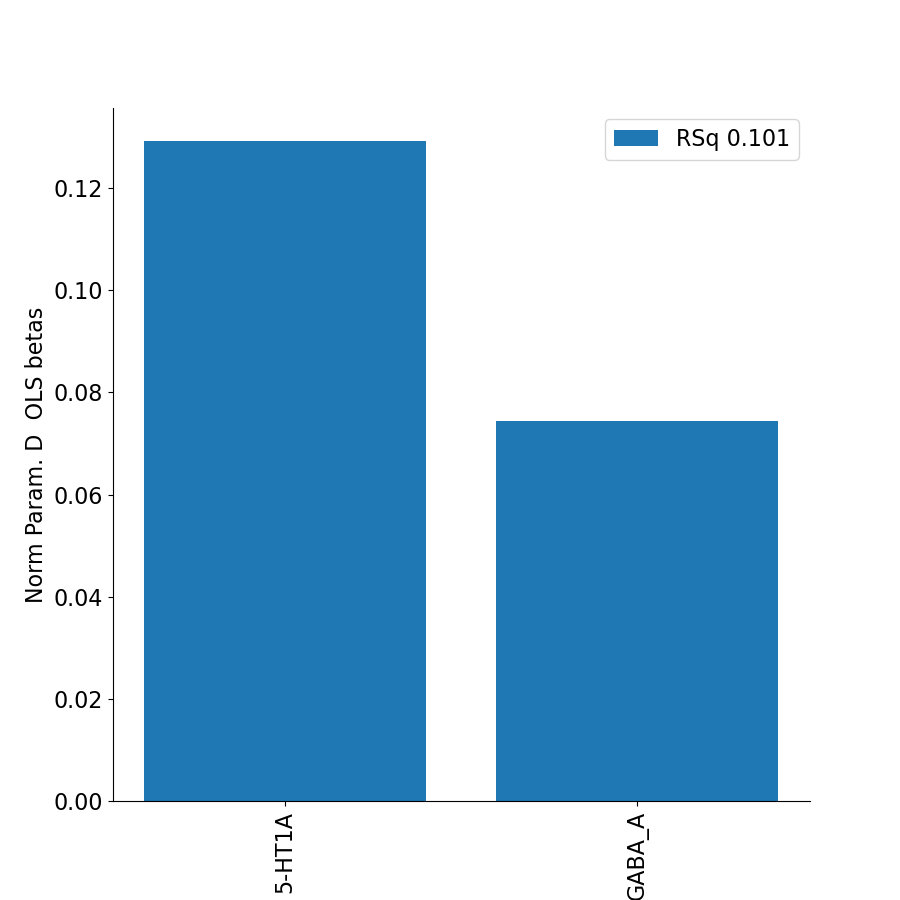

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23c
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 264
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 1.0805 -0.0553]
wRSq 0.07453778675717782
wCC prediction 0.2730160924875636


<IPython.core.display.Javascript object>


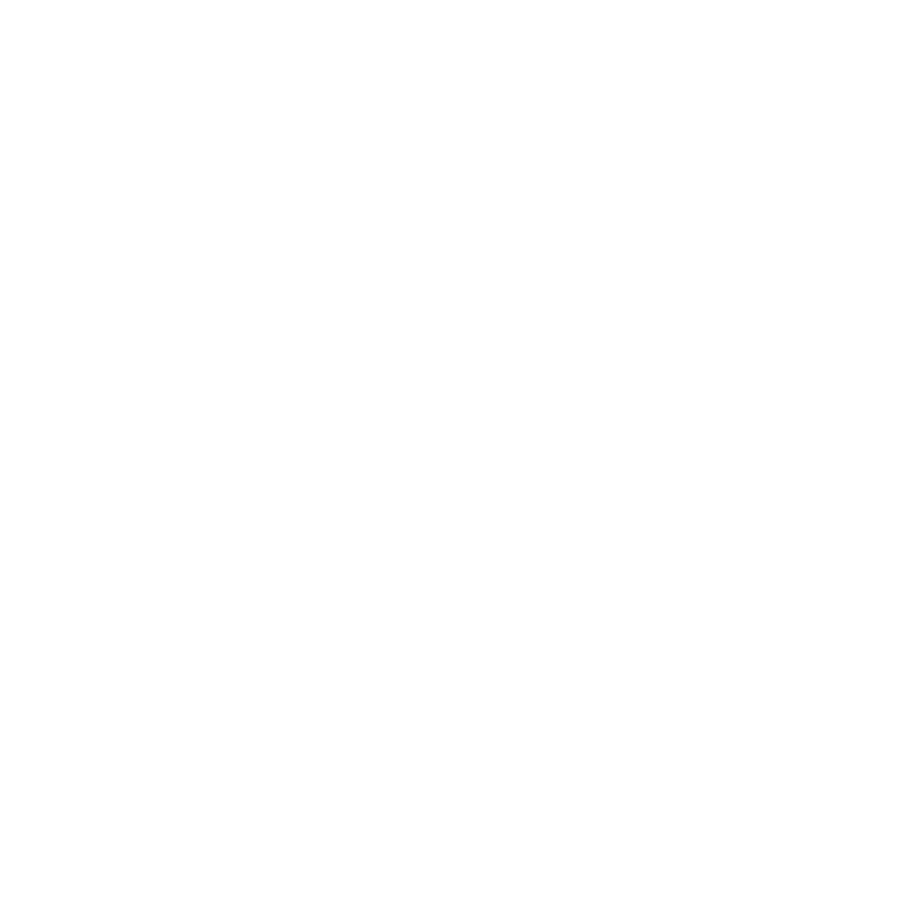

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_23d
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dd
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_24dv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


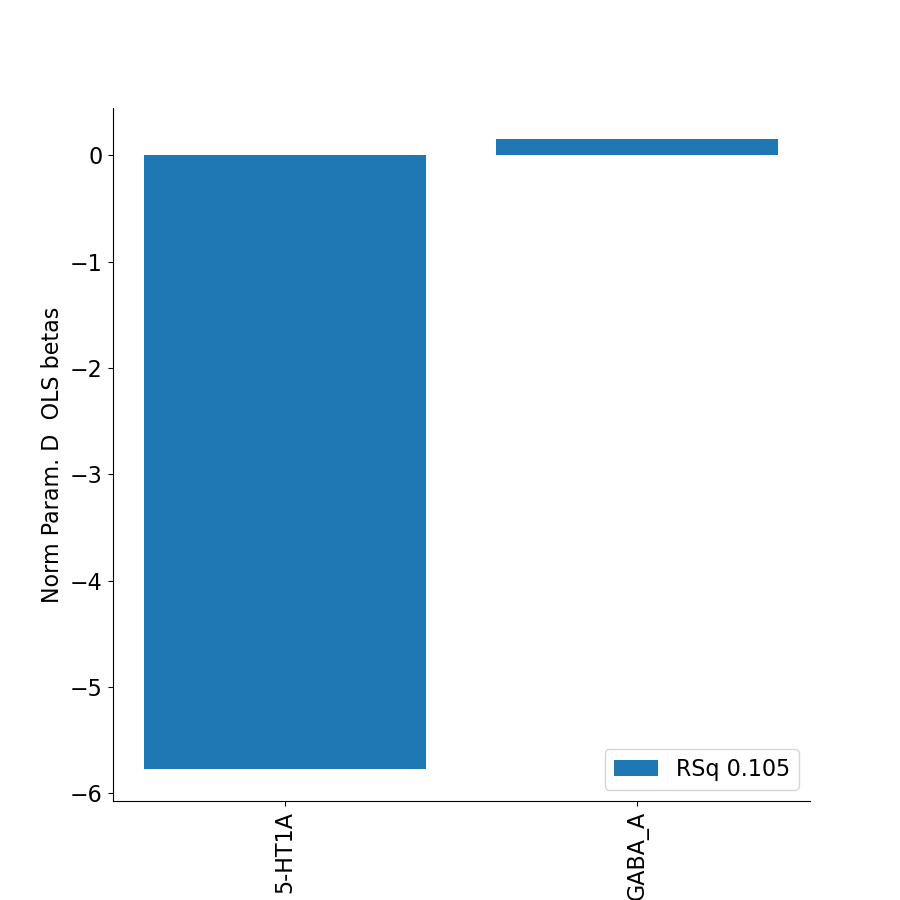

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47l
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_47s
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrs

<IPython.core.display.Javascript object>


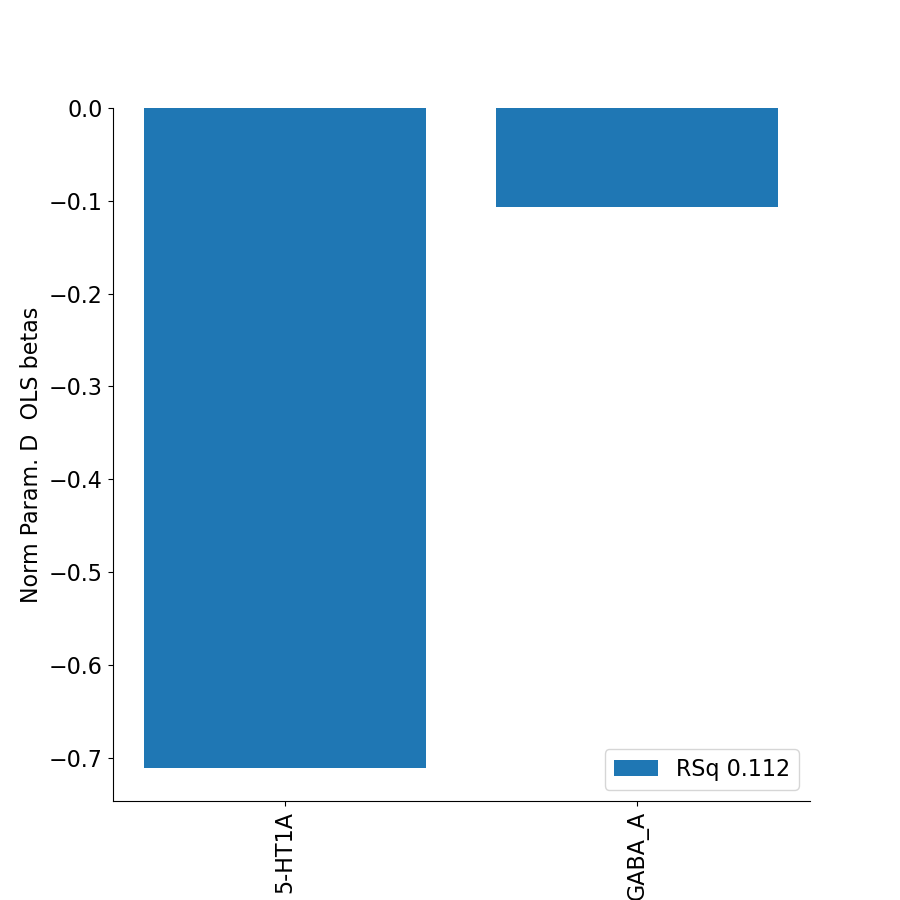

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_5mv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 370
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 2.3197 -0.0985]
wRSq 0.14786559716928416
wCC prediction 0.38453295979575525


<IPython.core.display.Javascript object>


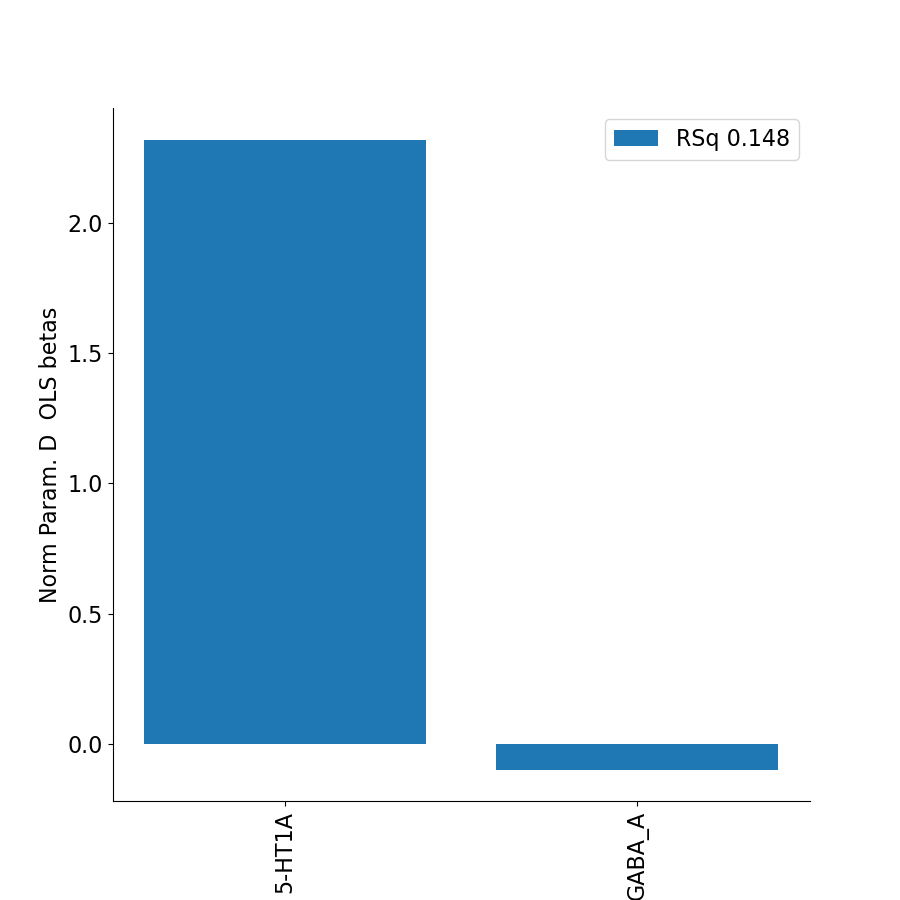

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6a
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2974
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.1098 0.0224]
wRSq 0.020425838895254733
wCC prediction 0.14291899417241521


<IPython.core.display.Javascript object>


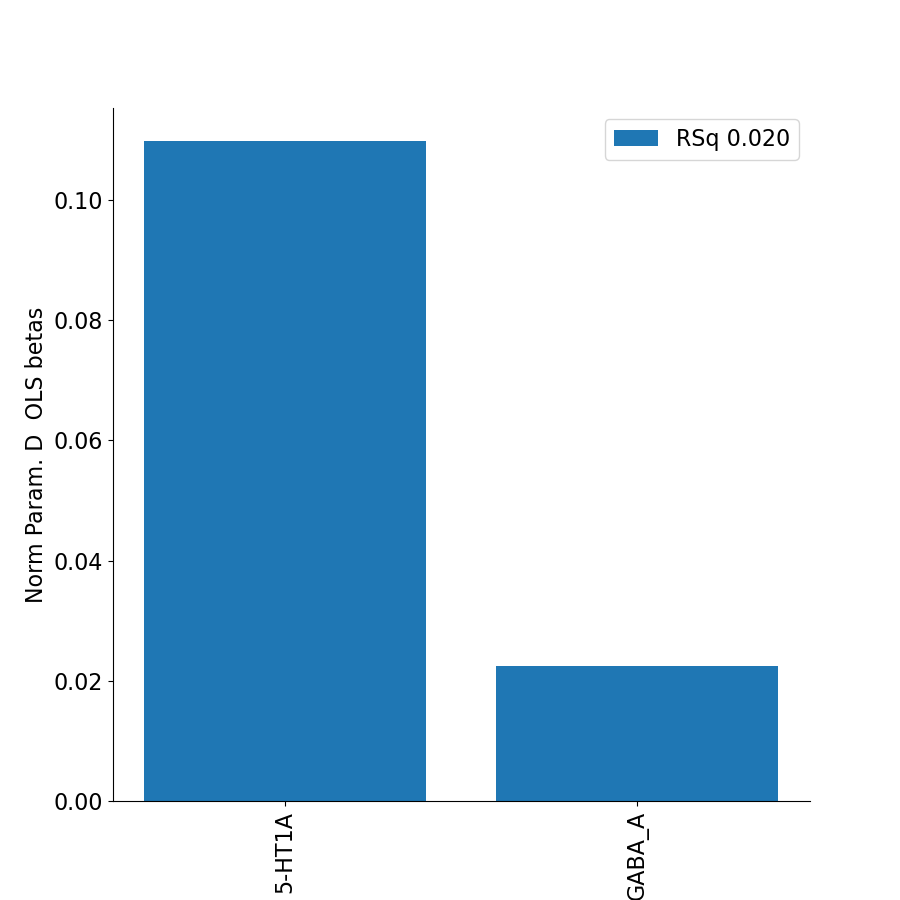

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6d
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 153
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 2.0549 -0.2041]
wRSq 0.2697299662627989
wCC prediction 0.5193553371852441


<IPython.core.display.Javascript object>


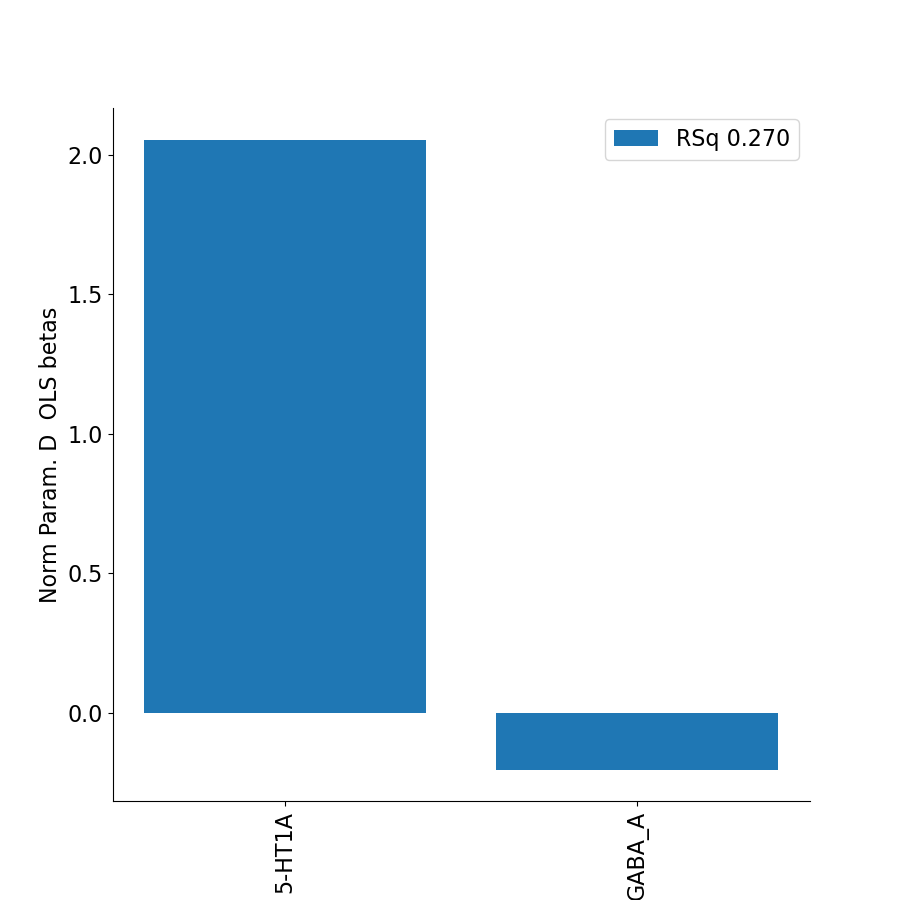

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6ma
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 490
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.2749  0.091 ]
wRSq 0.060316020452437
wCC prediction 0.24559320115271324


<IPython.core.display.Javascript object>


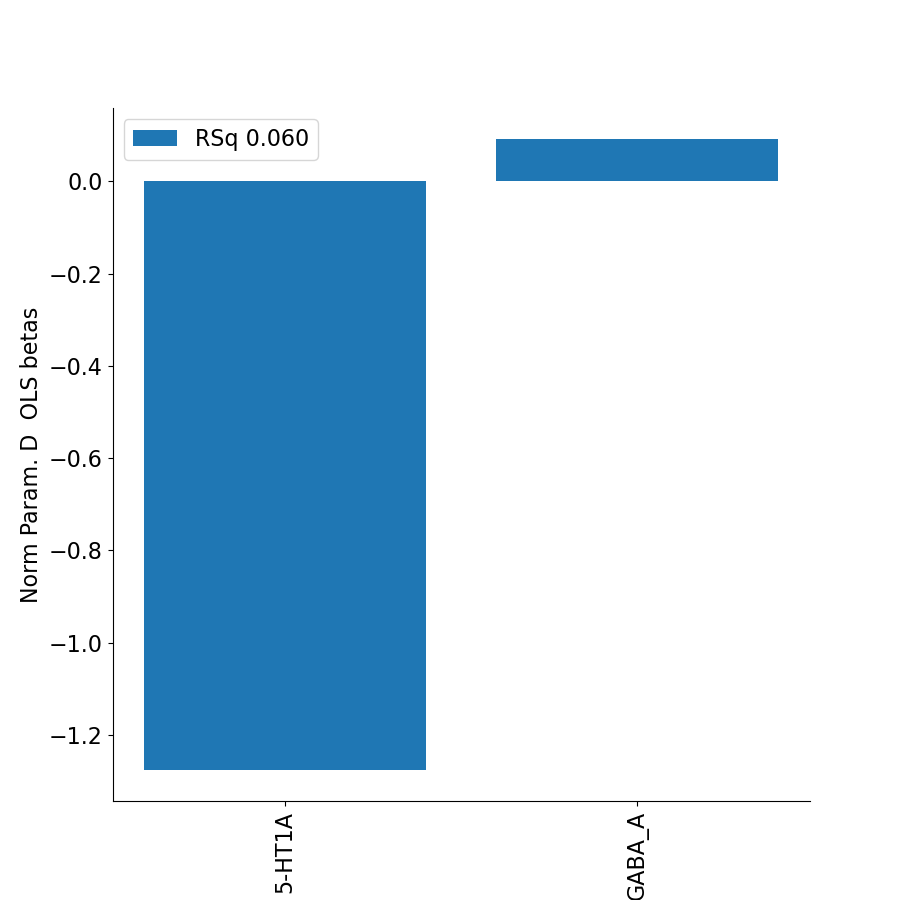

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6mp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 96
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.3802 -0.07  ]
wRSq 0.00733355030926075
wCC prediction 0.08563615071487286


<IPython.core.display.Javascript object>


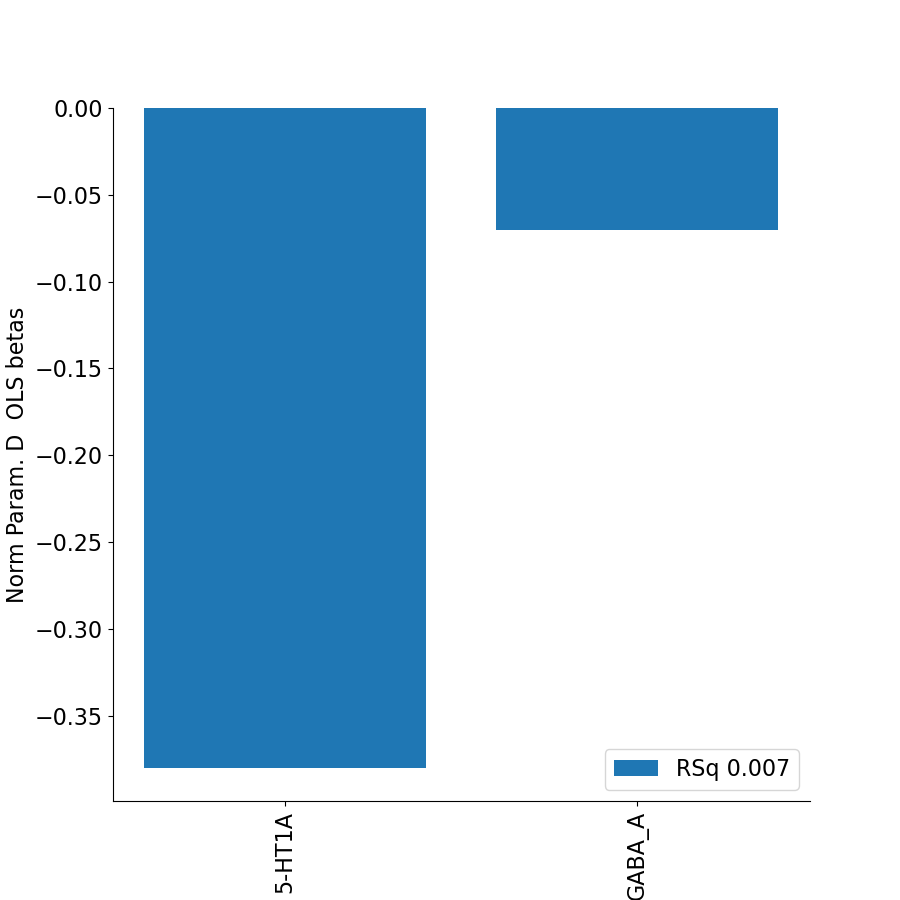

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6r
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 612
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.127  -0.0774]
wRSq 0.08453735941551455
wCC prediction 0.2907530901220391


<IPython.core.display.Javascript object>


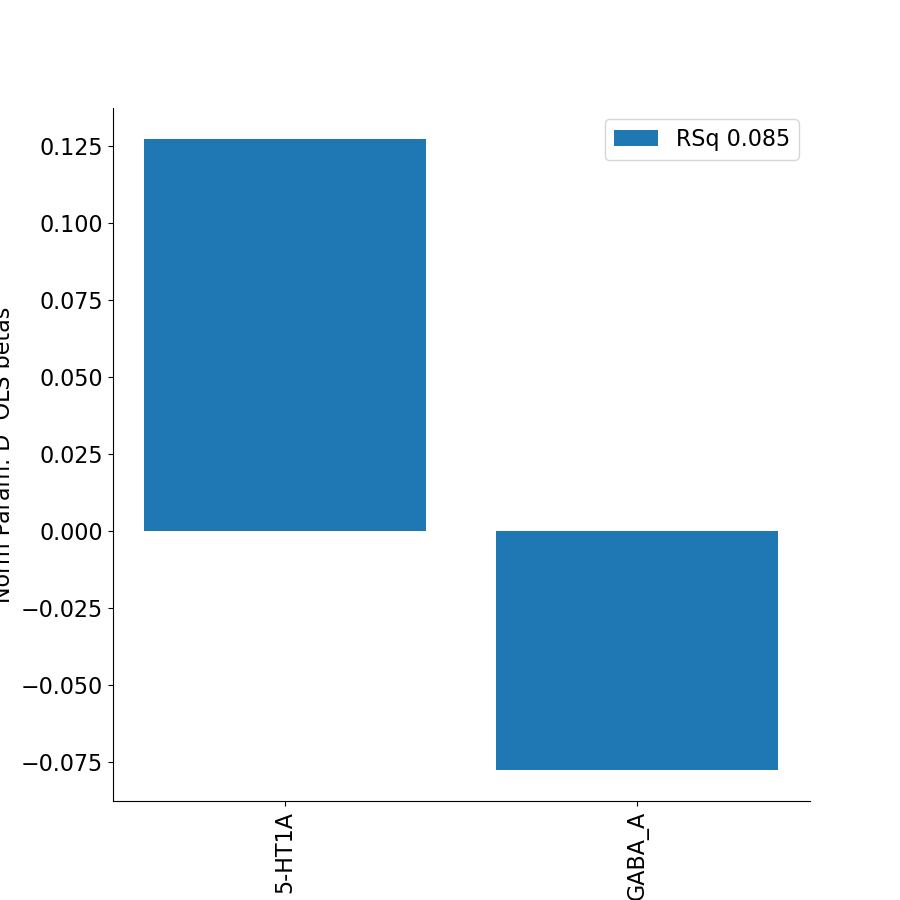

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_6v
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 459
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.5333 -0.0986]
wRSq 0.09616935892660983
wCC prediction 0.3101118490587062


<IPython.core.display.Javascript object>


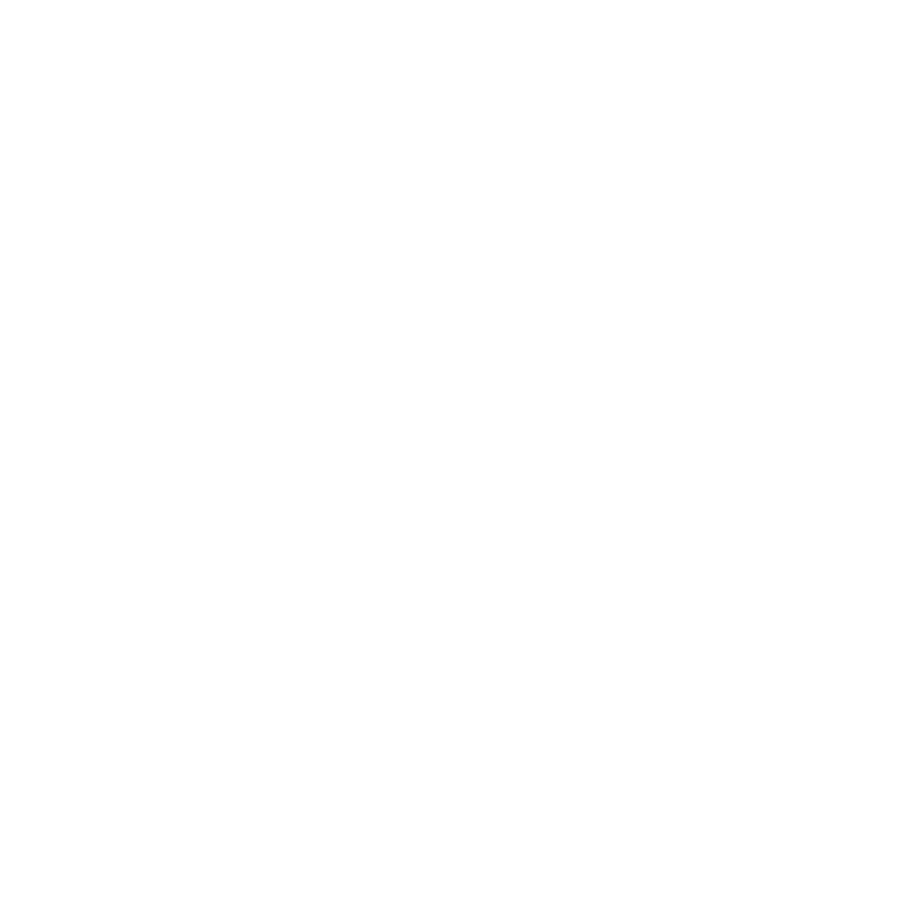

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7AL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1214
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.9419 -0.0058]
wRSq 0.03965218097579504
wCC prediction 0.19912855389369744


<IPython.core.display.Javascript object>


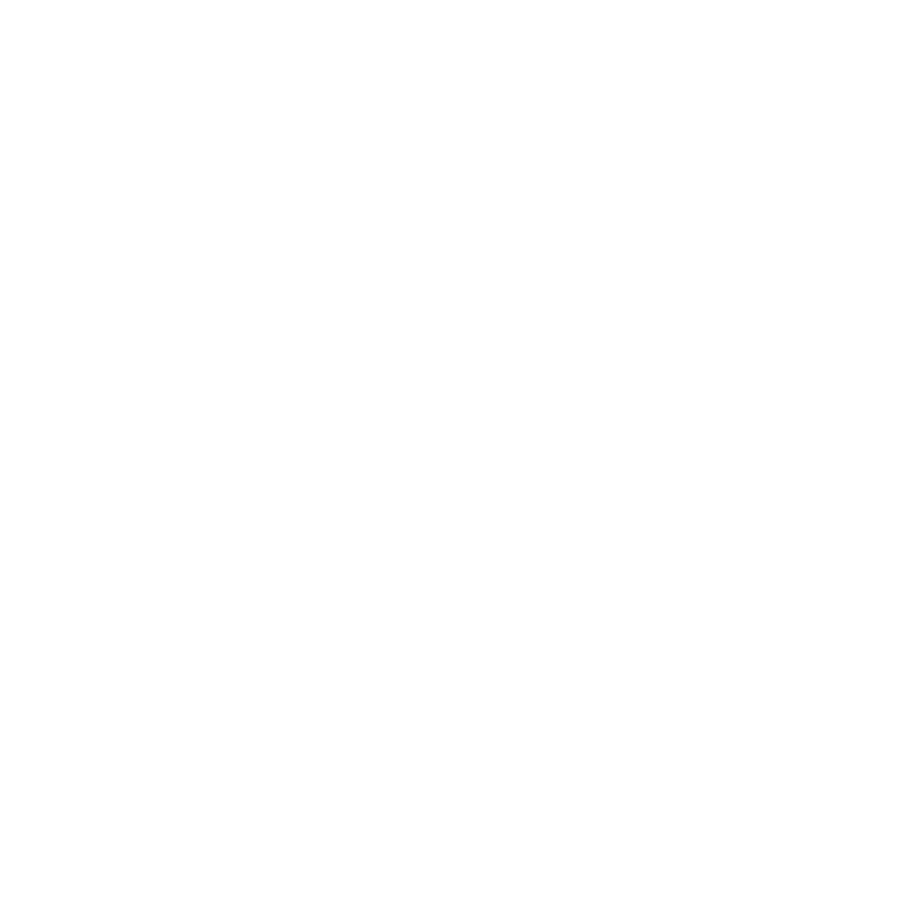

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7Am
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1679
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.0089 0.0315]
wRSq 0.012042128274434627
wCC prediction 0.10973663141556136


<IPython.core.display.Javascript object>


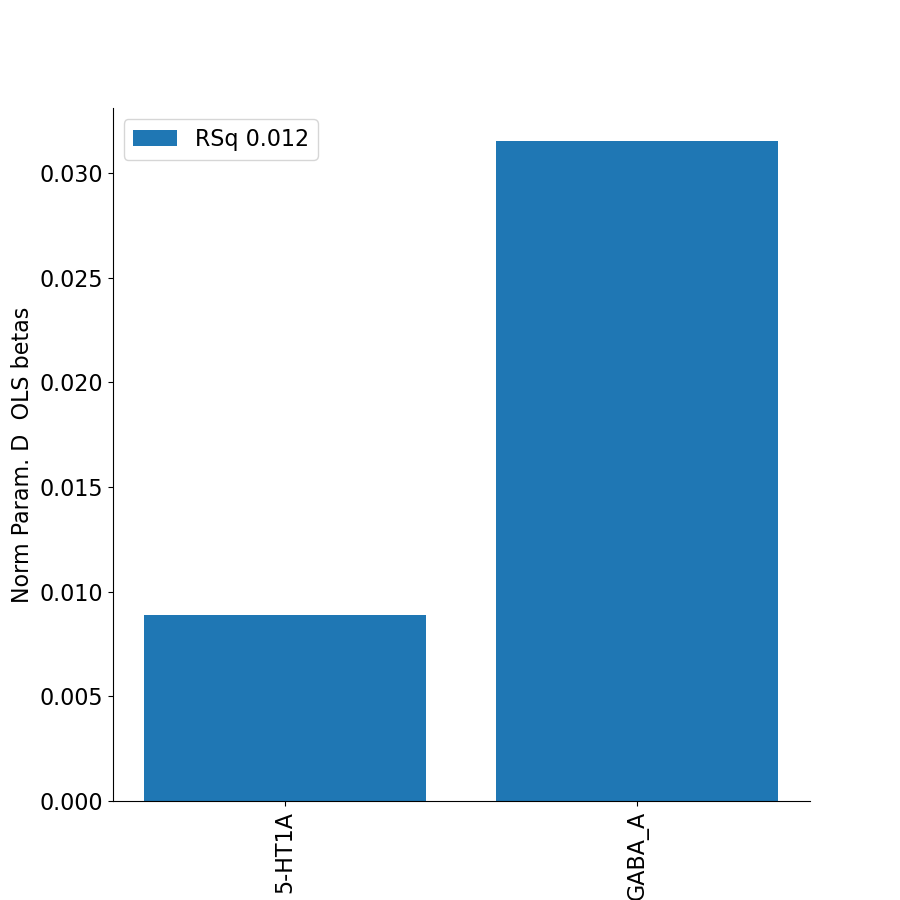

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7PC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1502
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.4773 0.0078]
wRSq 0.04324993350407125
wCC prediction 0.20796618355894153


<IPython.core.display.Javascript object>


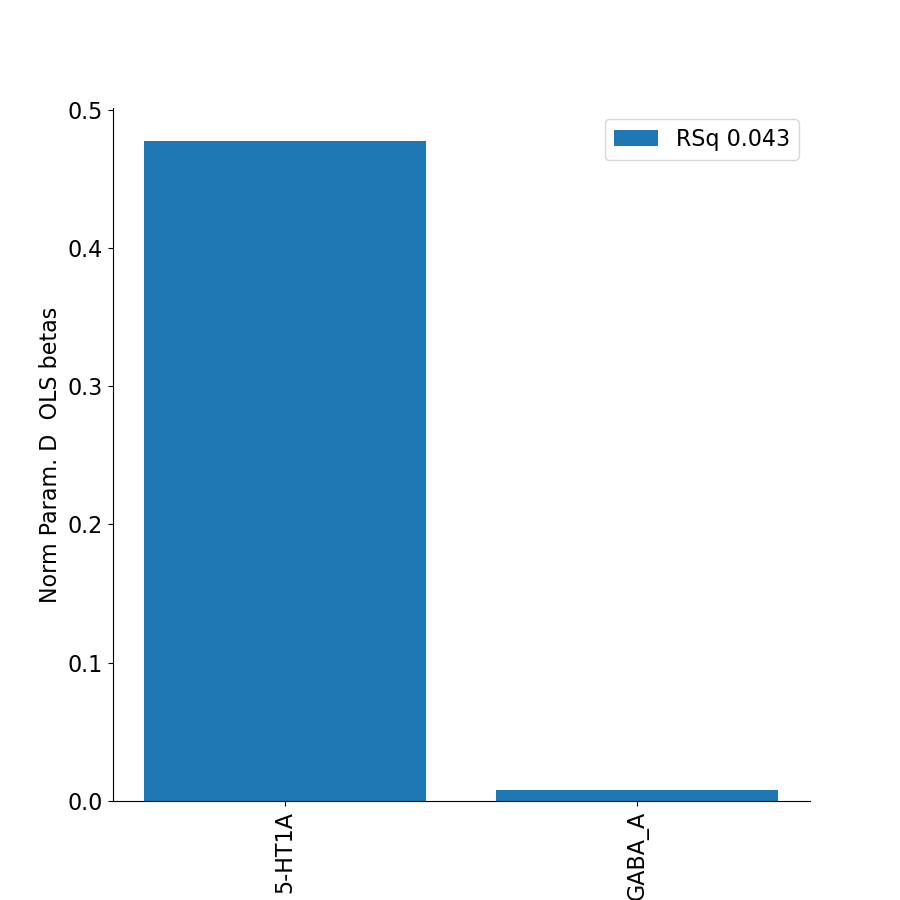

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7PL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 905
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.5022 -0.0128]
wRSq 0.036598085337486874
wCC prediction 0.19130626058100383


<IPython.core.display.Javascript object>


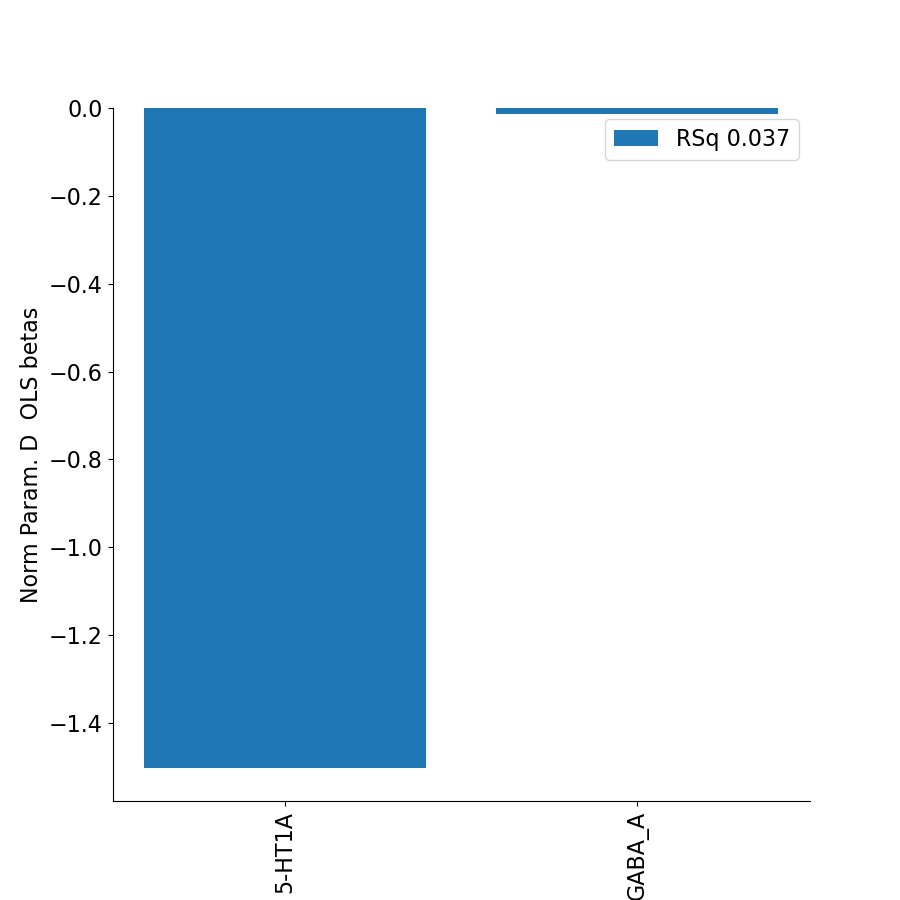

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_7Pm
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 200
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.4725 0.1451]
wRSq 0.07680639907030706
wCC prediction 0.27713967429855113


<IPython.core.display.Javascript object>


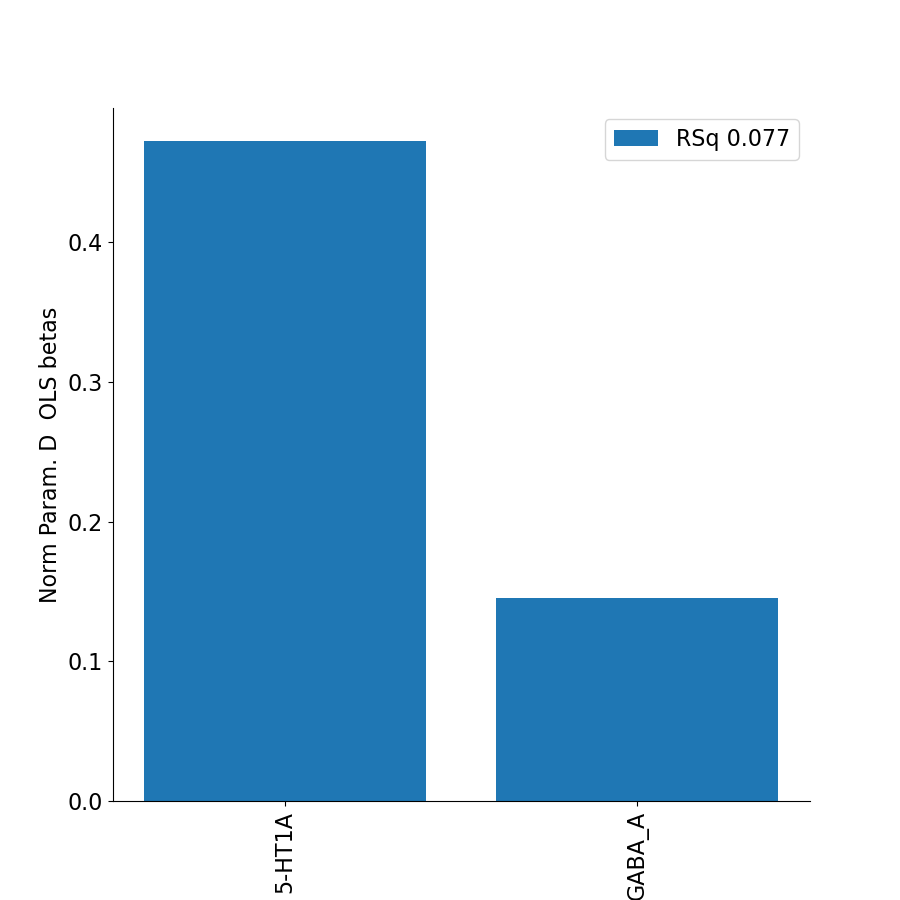

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8Ad
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8Av
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8BL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrs

<IPython.core.display.Javascript object>


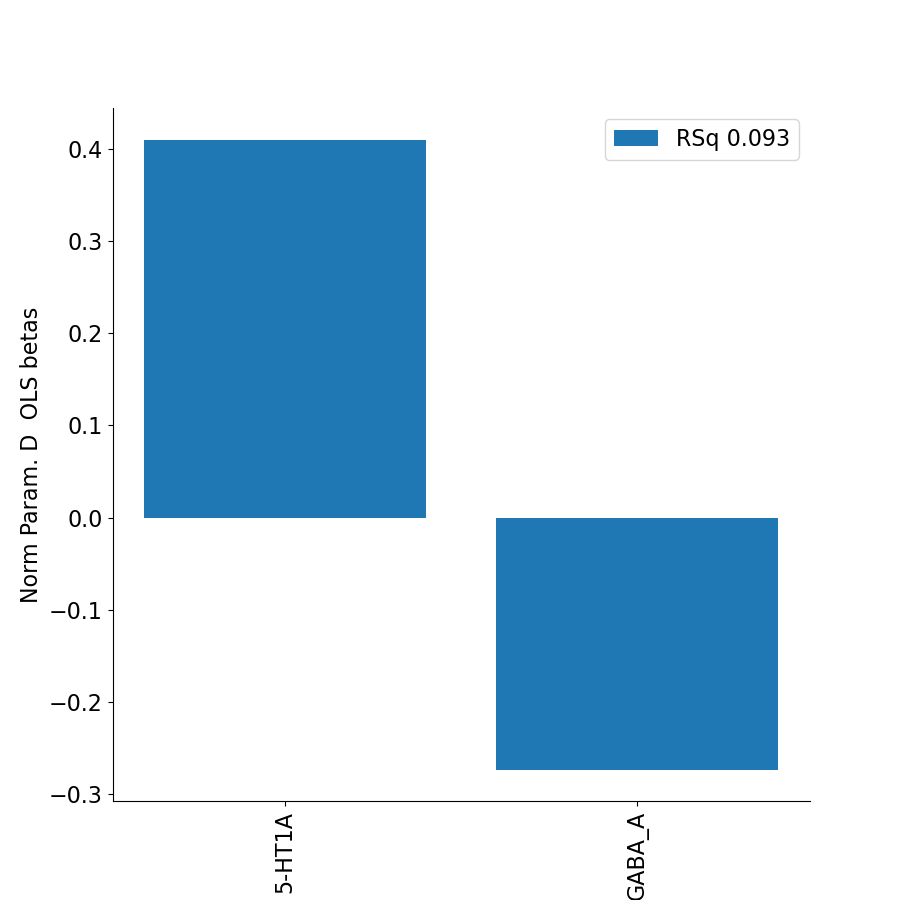

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_8C
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 8
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9-46d
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 32
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-8.9127 -0.0147]
wRSq 0.12460103083919882
wCC prediction 0.3529887120563477


<IPython.core.display.Javascript object>


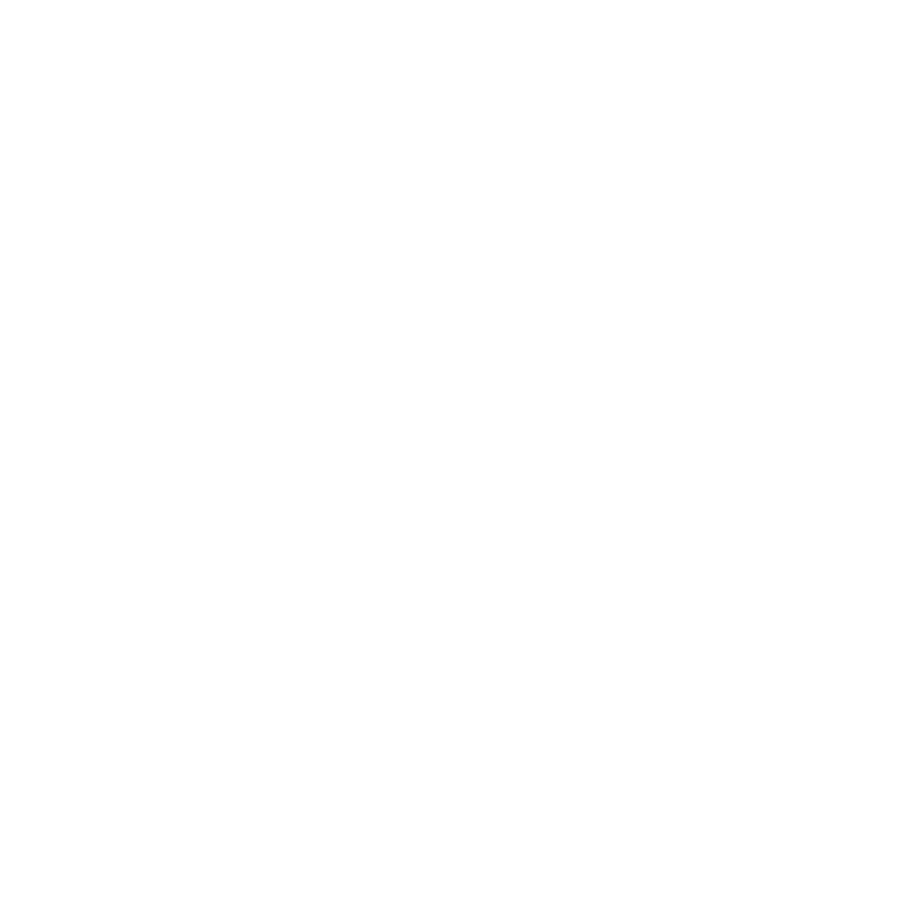

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9a
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9m
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_9p
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq g

<IPython.core.display.Javascript object>


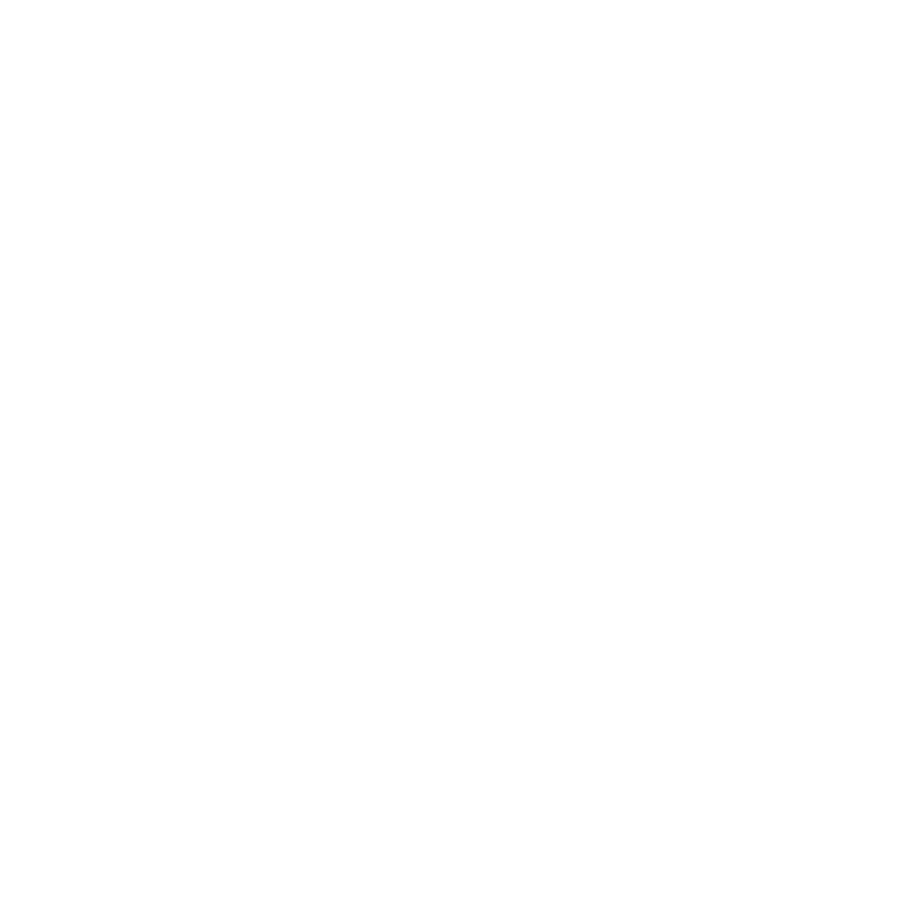

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_AVI
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 58
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 4.0231 -0.5661]
wRSq 0.16551037941397606
wCC prediction 0.4068296687976139


<IPython.core.display.Javascript object>


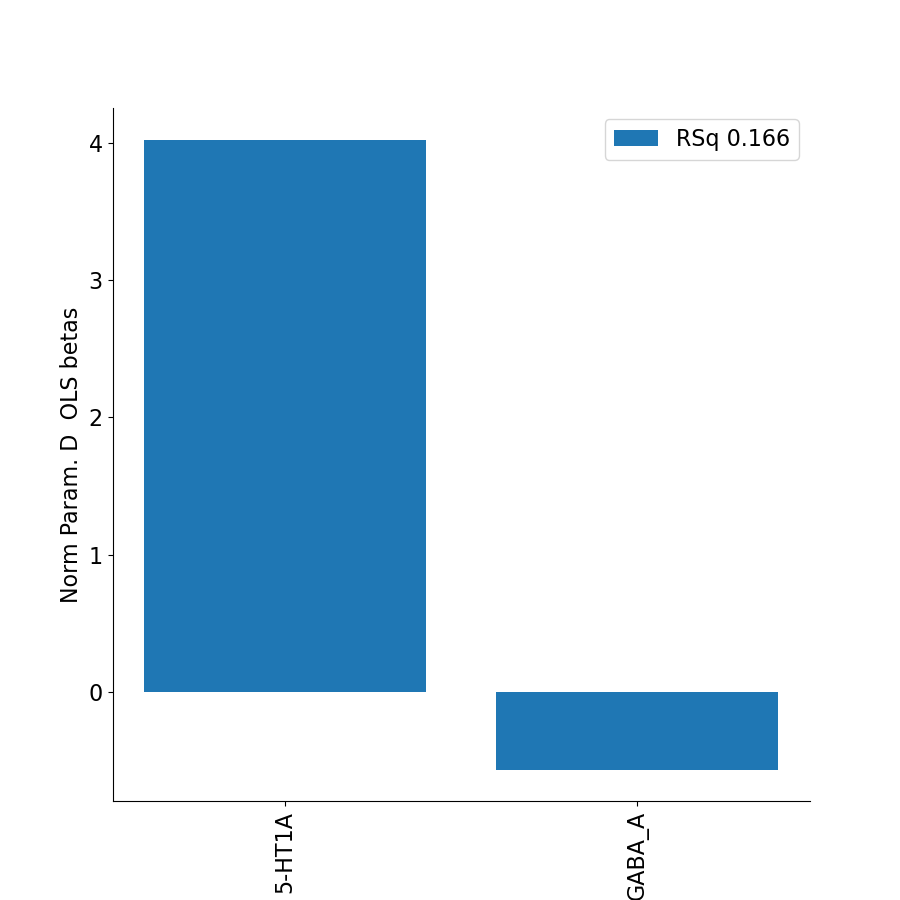

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d23ab
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_d32
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_DVT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 728
performing OLS (1D y)
Estimated OLS 

<IPython.core.display.Javascript object>


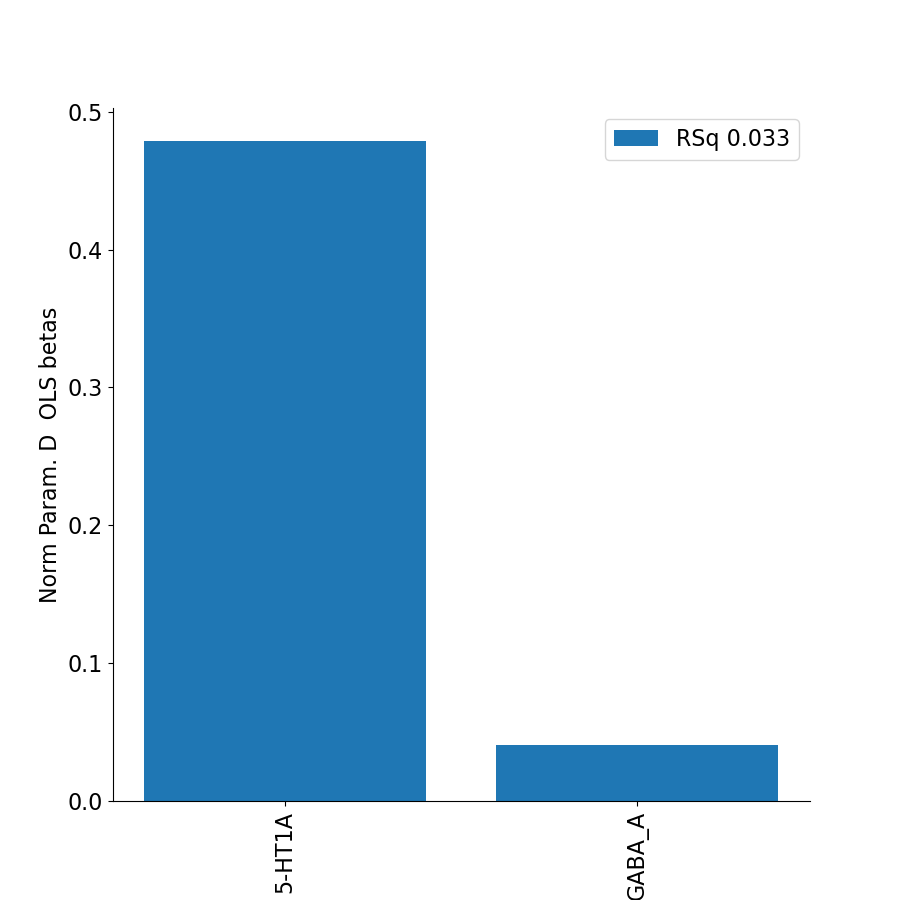

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_EC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FEF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1242
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.6159 -0.0056]
wRSq 0.038592231937579546
wCC prediction 0.1964490568508271


<IPython.core.display.Javascript object>


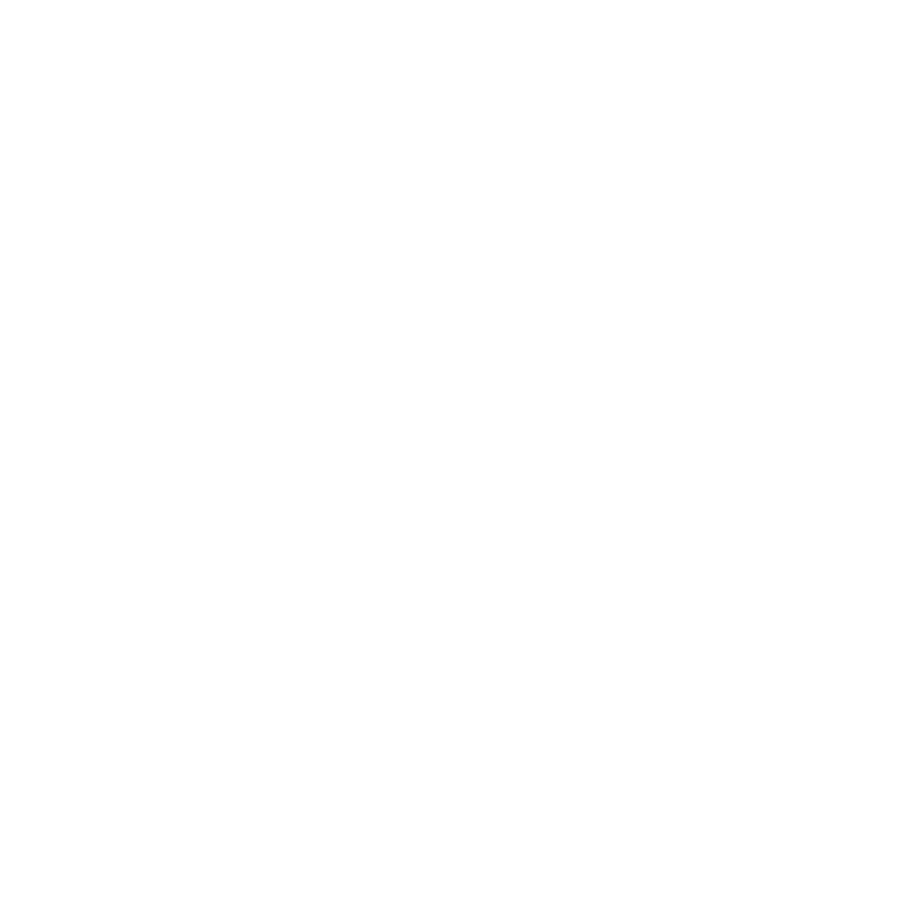

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FFC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1265
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.119  -0.0608]
wRSq 0.09114121383614504
wCC prediction 0.301896031501153


<IPython.core.display.Javascript object>


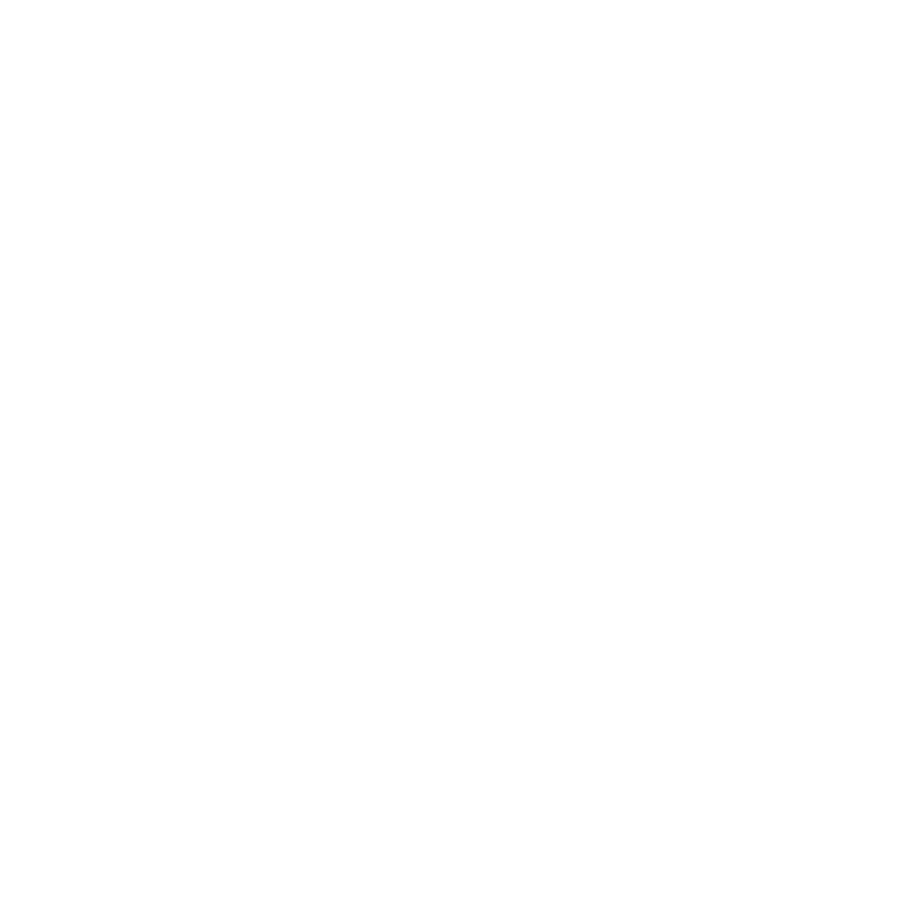

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_c

<IPython.core.display.Javascript object>


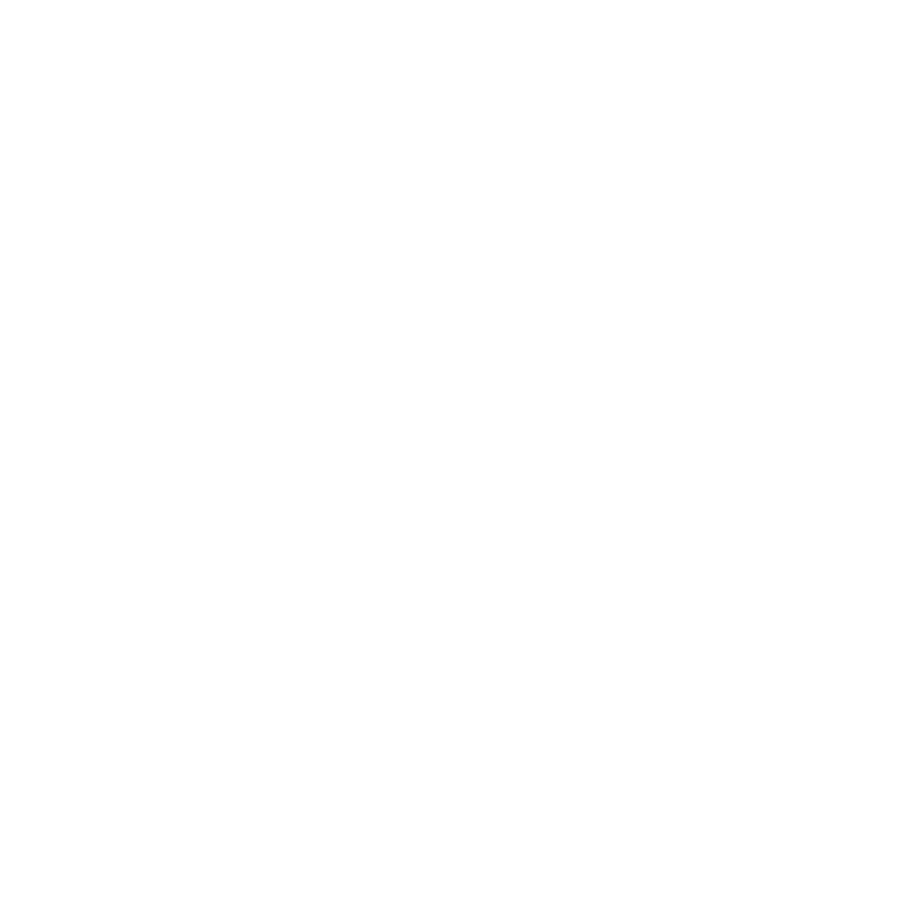

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FOP5
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 101
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 2.1171 -0.1097]
wRSq 0.06894879463791515
wCC prediction 0.26258102490072477


<IPython.core.display.Javascript object>


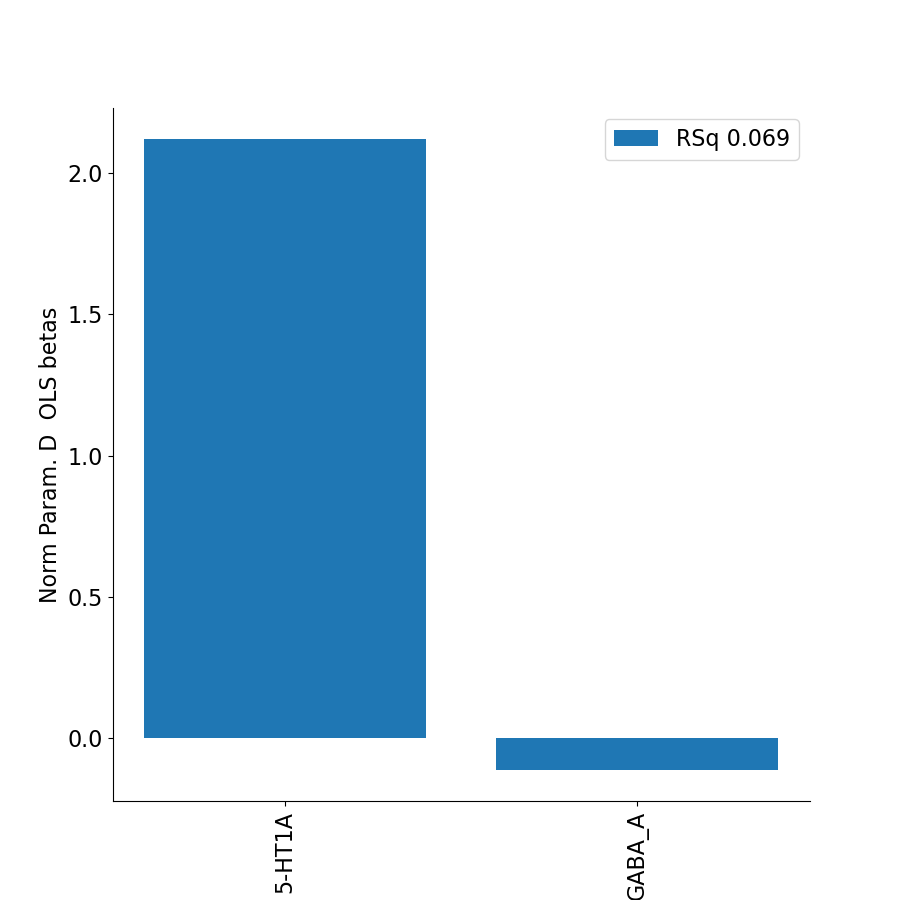

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_FST
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 781
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.0351 0.008 ]
wRSq 0.0023763090125289432
wCC prediction 0.048747400059168895


<IPython.core.display.Javascript object>


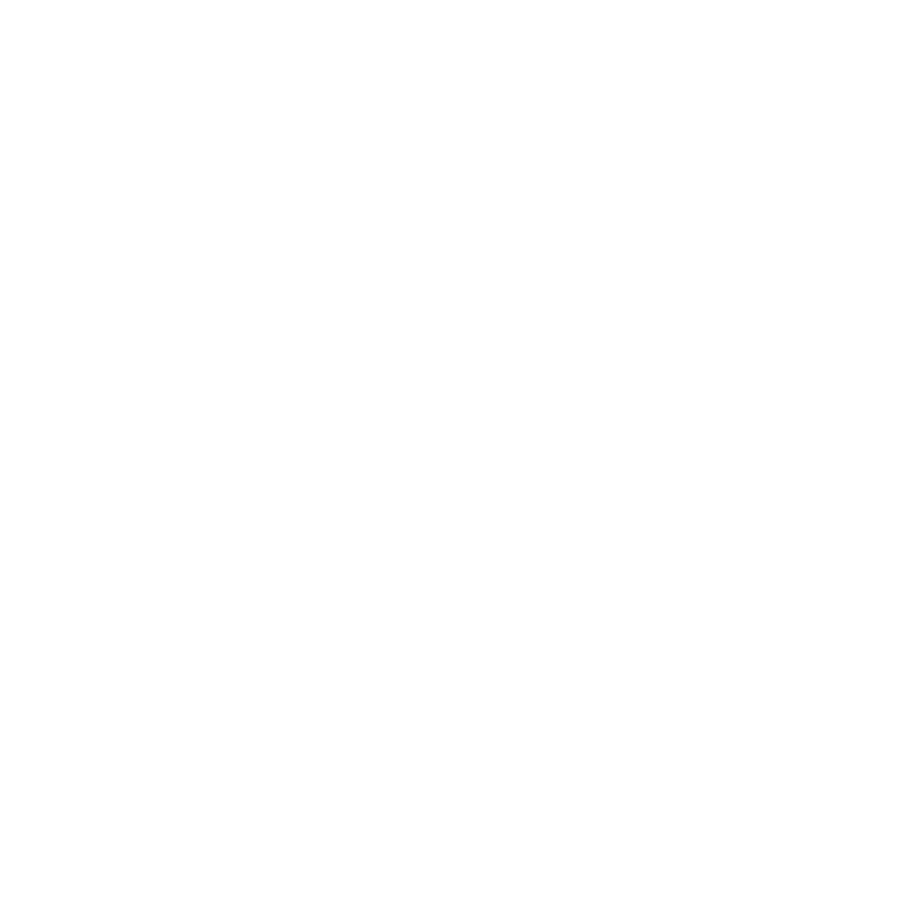

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_H
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_i6-8
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 29
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.86   0.1669]
wRSq 0.046057072585211634
wCC prediction 0.21460911580175632


<IPython.core.display.Javascript object>


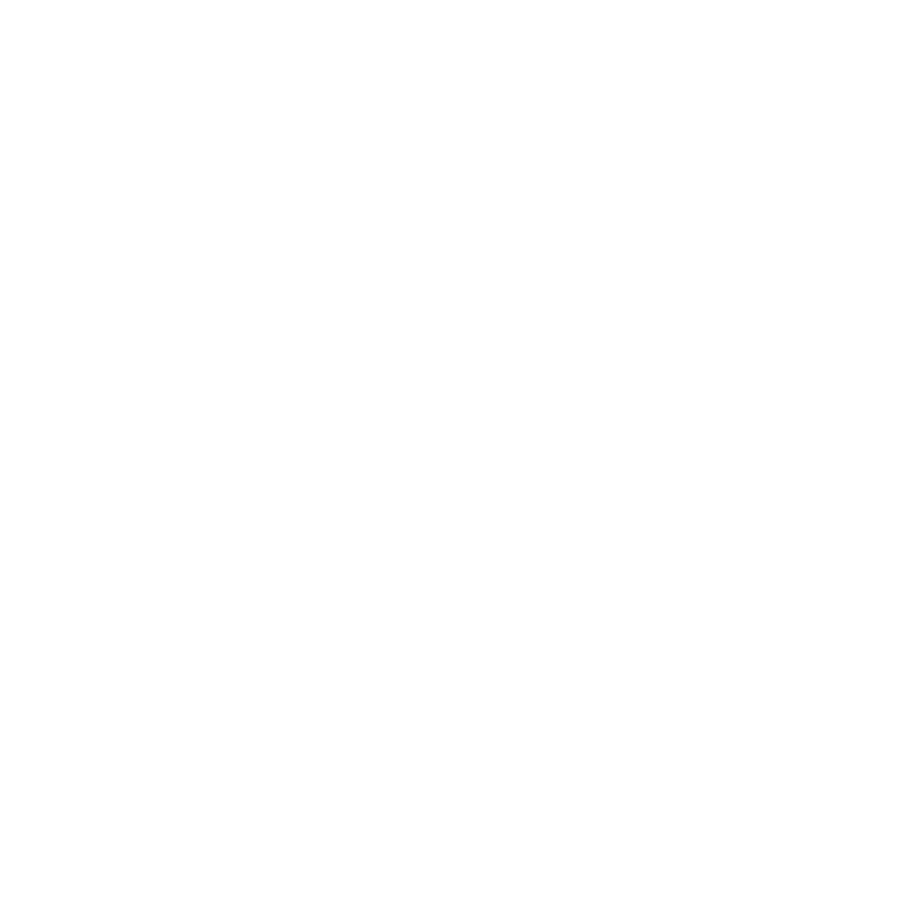

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFJa
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 37
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.178  0.0218]
wRSq 0.0041451969979372505
wCC prediction 0.06438320431554417


<IPython.core.display.Javascript object>


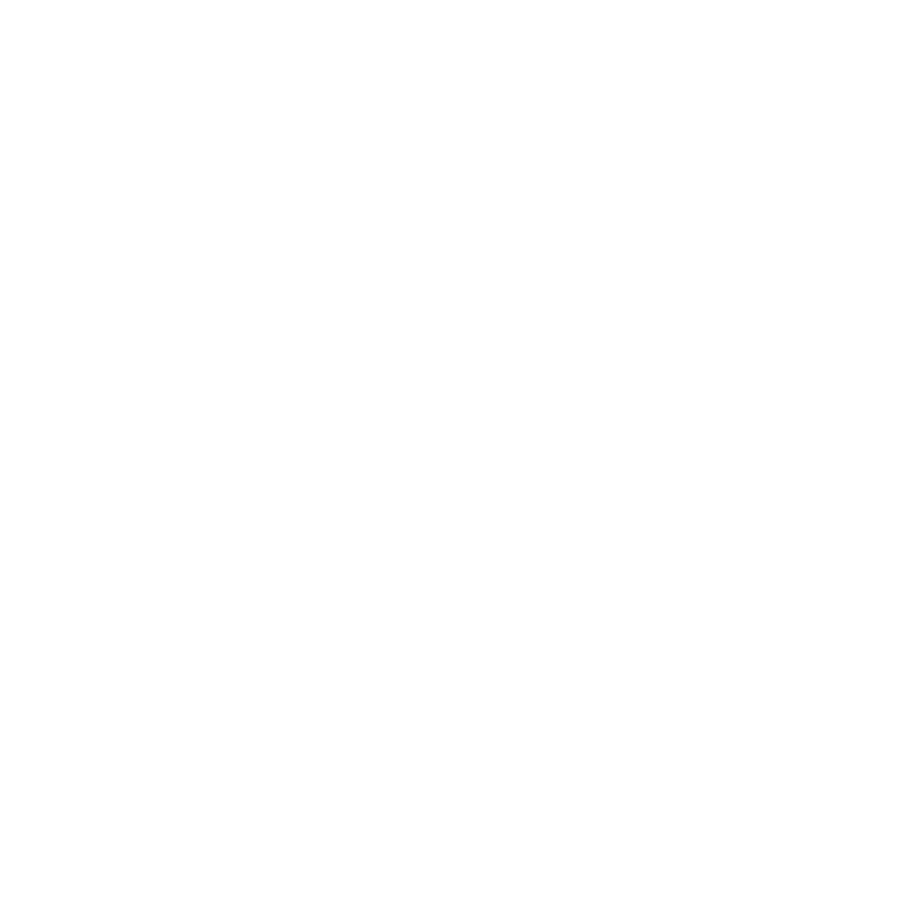

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFJp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 499
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.3281 -0.0124]
wRSq 0.016279330396184677
wCC prediction 0.12759047925368305


<IPython.core.display.Javascript object>


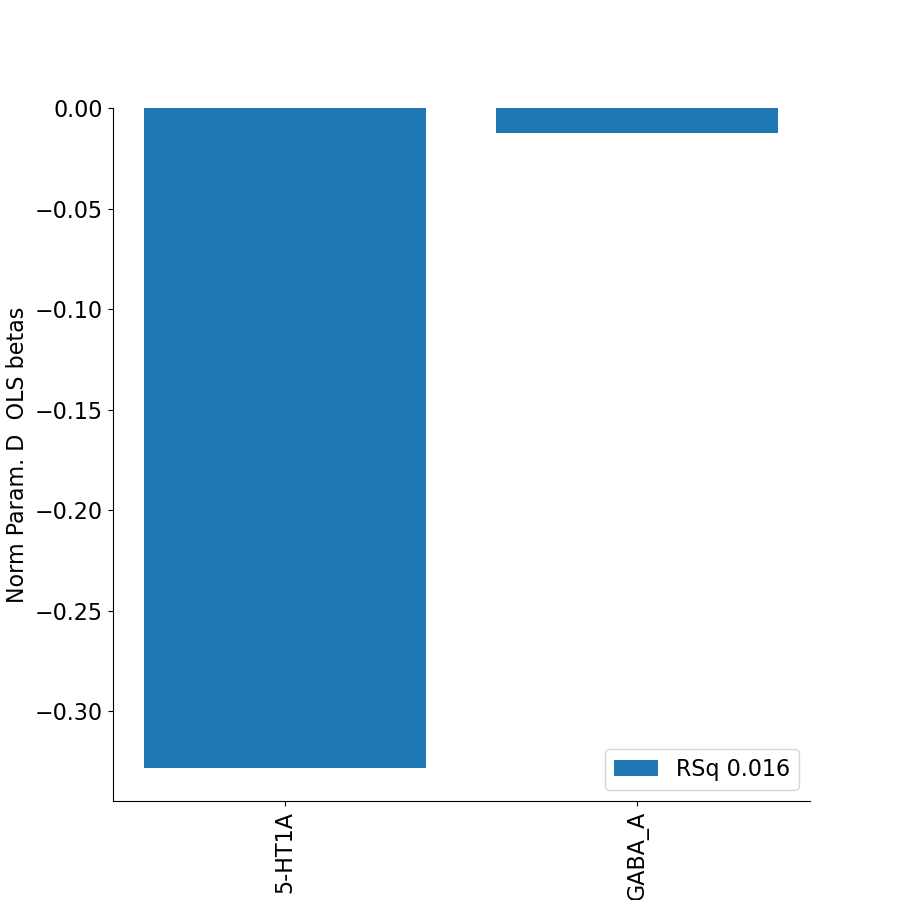

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFSa
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IFSp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 129
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 4.0993 -0.2312]
wRSq 0.1927303286258064
wCC prediction 0.4390106247299792


<IPython.core.display.Javascript object>


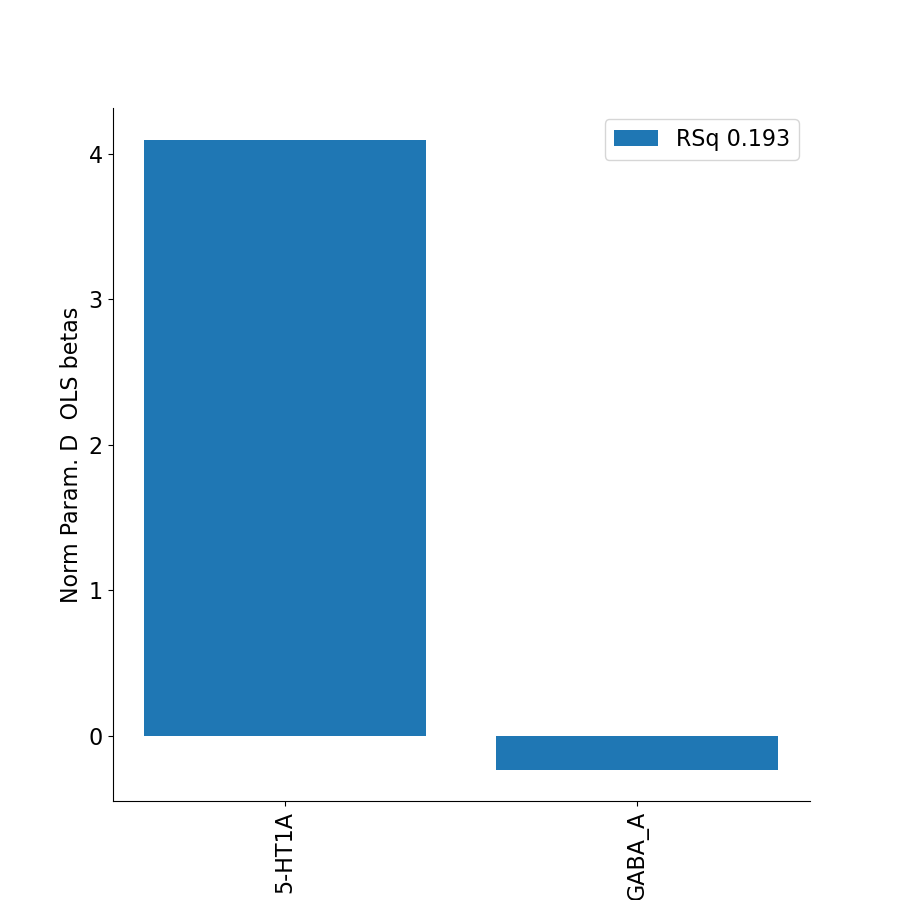

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_Ig
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP0
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 989
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.2287  0.0459]
wRSq 0.07981875441173047
wCC prediction 0.28252213083532157


<IPython.core.display.Javascript object>


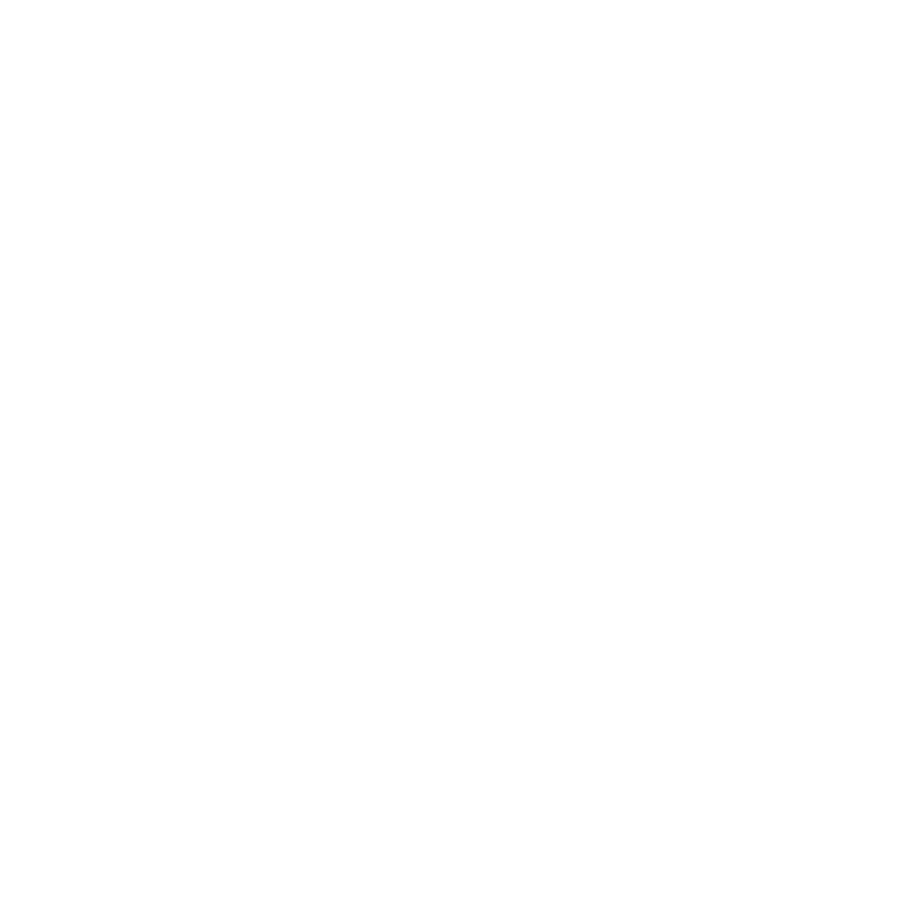

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 23
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 2.9167 -0.0199]
wRSq 0.07987771300325242
wCC prediction 0.28262645488922733


<IPython.core.display.Javascript object>


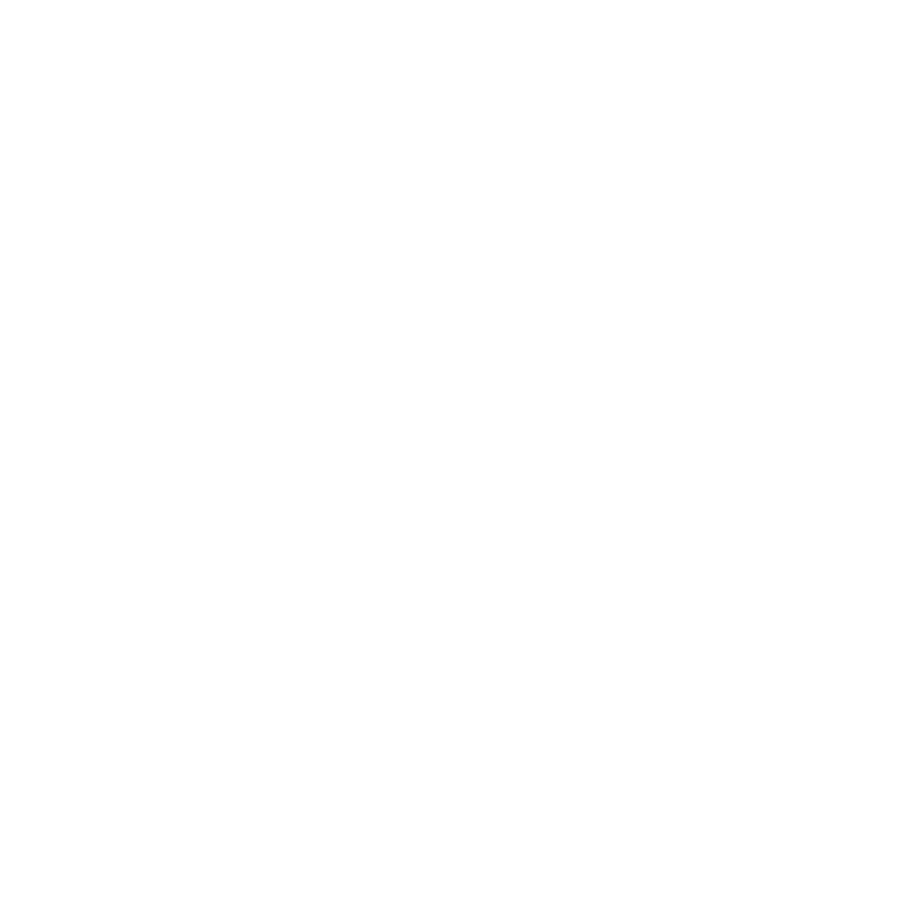

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IP2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 100
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.3089 -0.0086]
wRSq 0.0018501049105567047
wCC prediction 0.04301284587837291


<IPython.core.display.Javascript object>


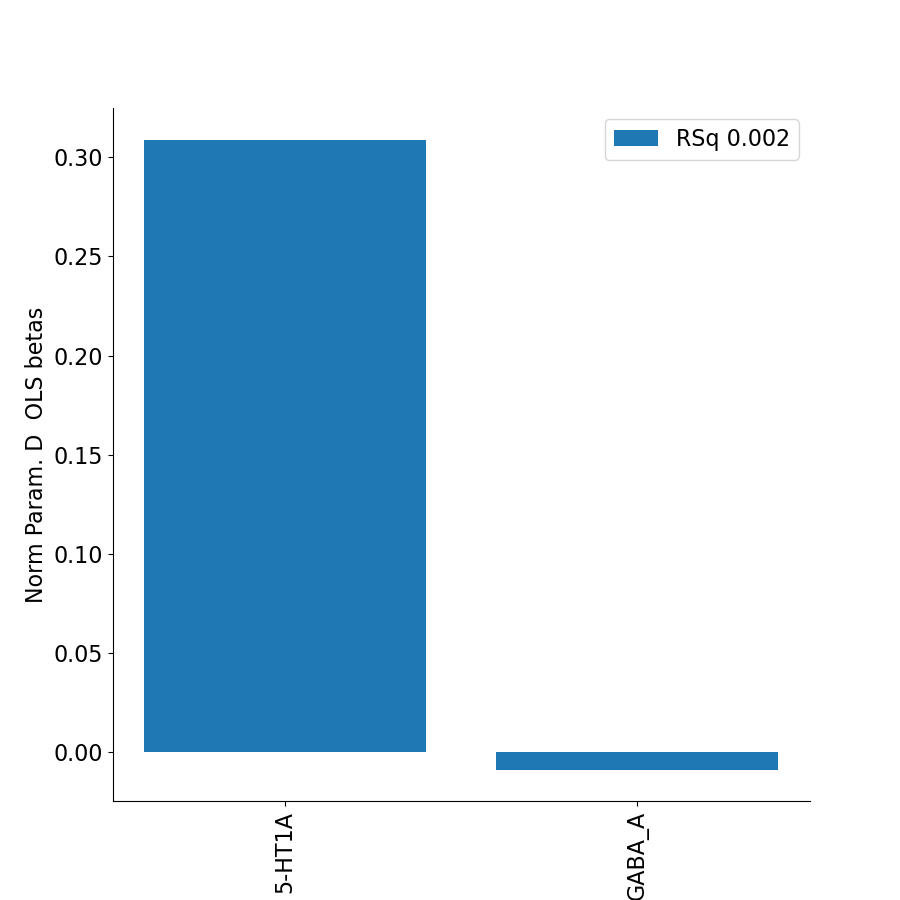

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_IPS1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1187
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.2793 -0.0248]
wRSq 0.03159315936630158
wCC prediction 0.1777446465193868


<IPython.core.display.Javascript object>


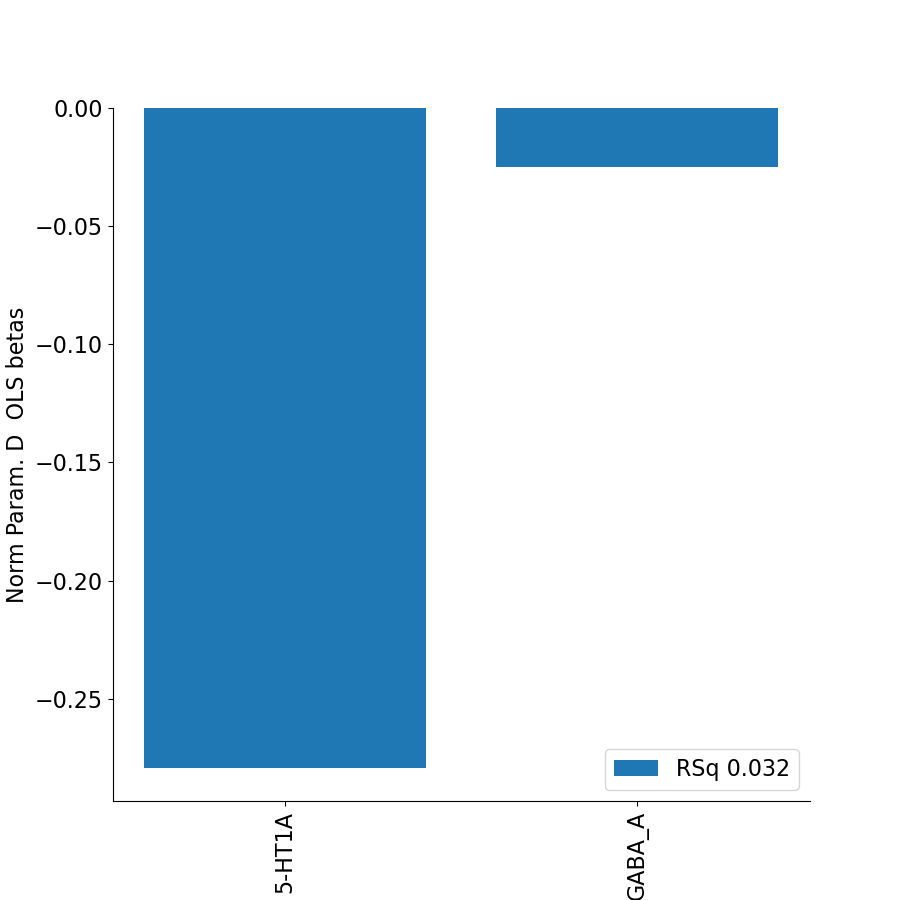

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LBelt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPd
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 660
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.2667 -0.0214]
wRSq 0.014272723437067425
wCC prediction 0.1194685039542538


<IPython.core.display.Javascript object>


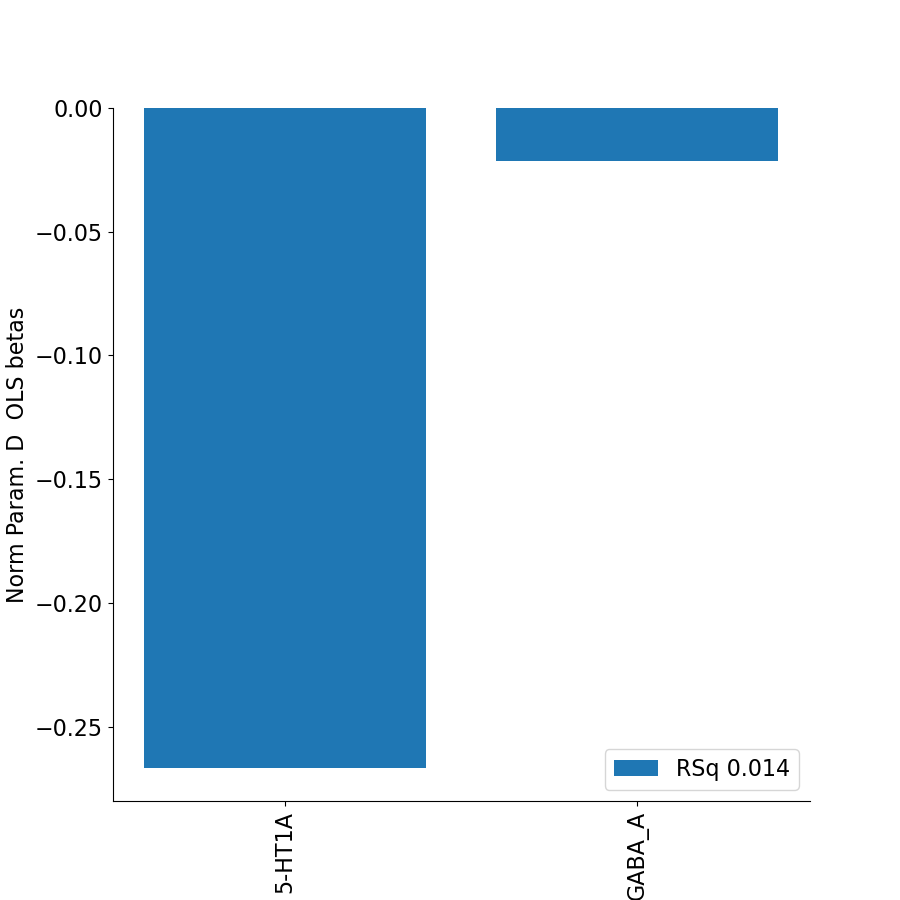

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LIPv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1426
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.0165 0.0314]
wRSq 0.05140184927804048
wCC prediction 0.22671975934629196


<IPython.core.display.Javascript object>


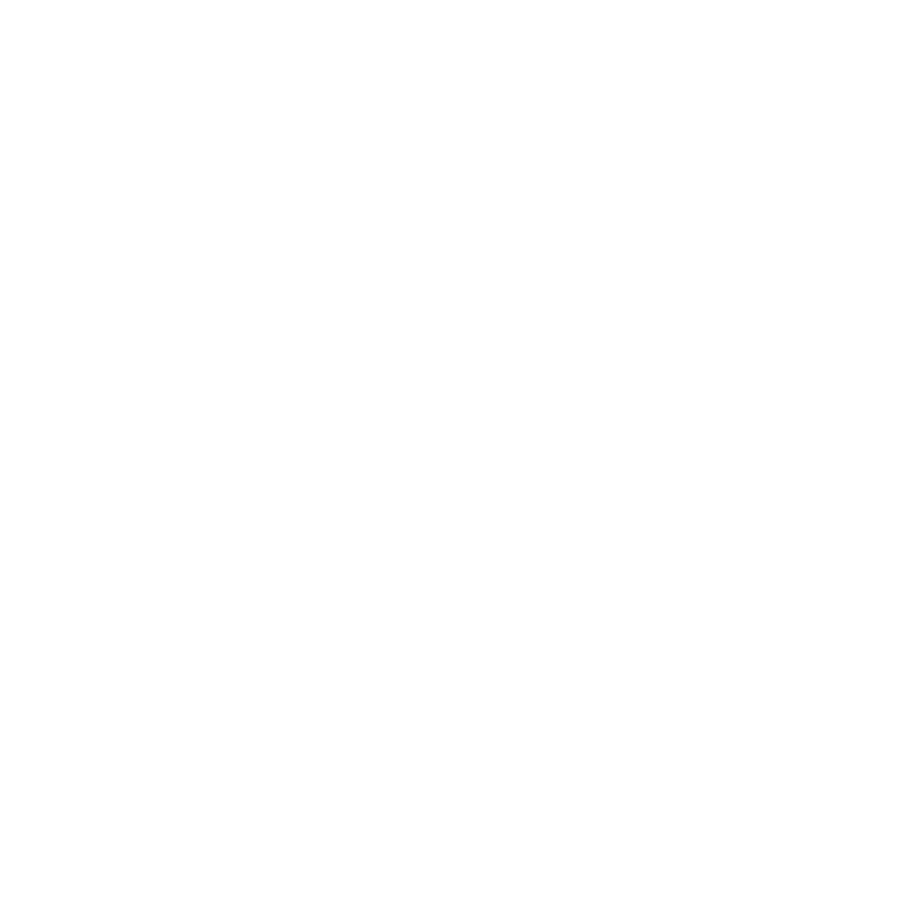

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 586
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.0811  0.0142]
wRSq 0.1435814892630103
wCC prediction 0.3789214816594729


<IPython.core.display.Javascript object>


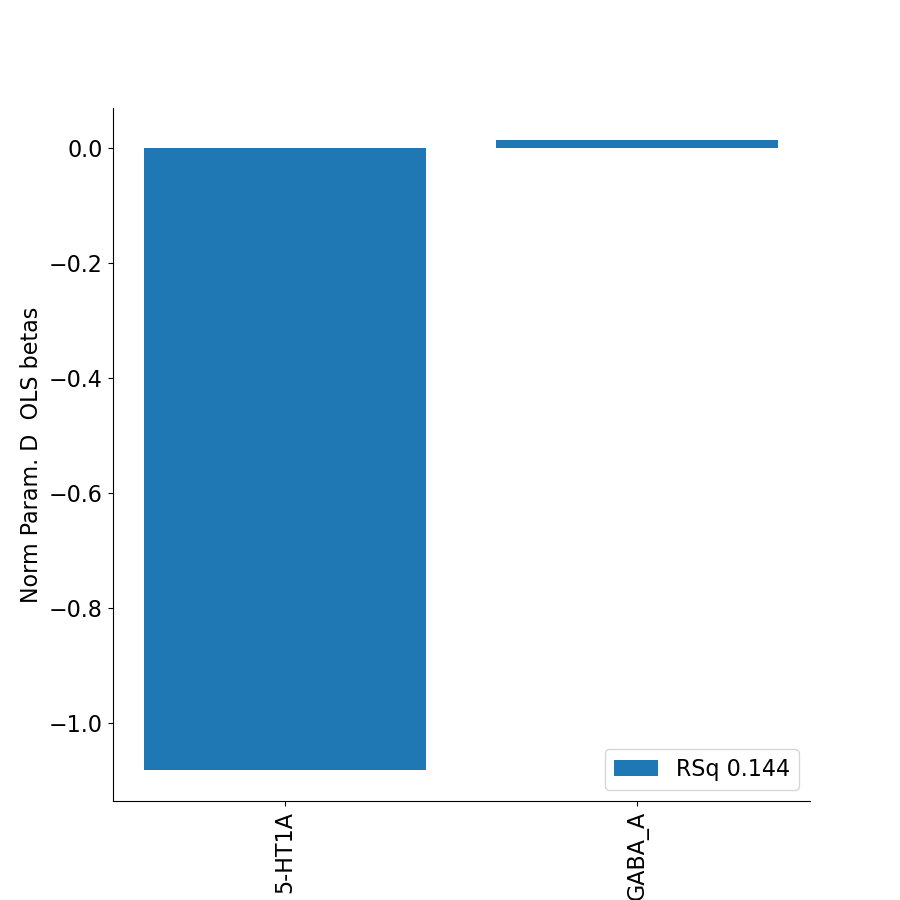

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 543
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.5343 -0.2518]
wRSq 0.28402486704260366
wCC prediction 0.5329398343552522


<IPython.core.display.Javascript object>


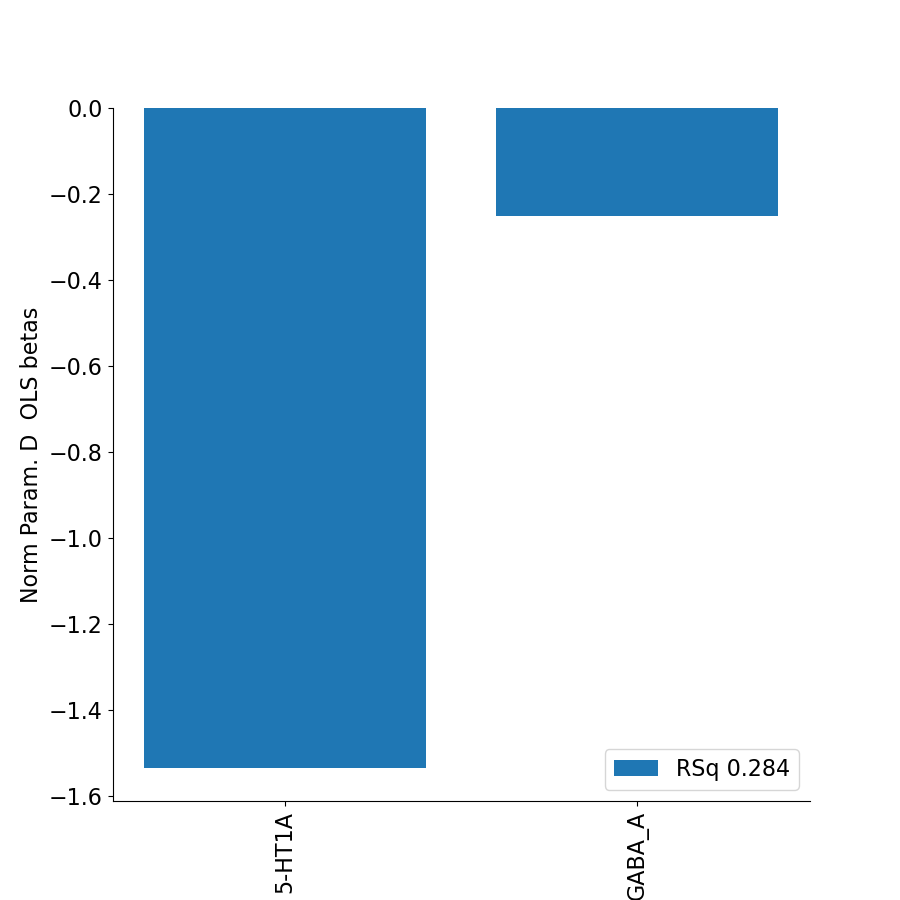

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_LO3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 672
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.034   0.0126]
wRSq 0.0017588209826612244
wCC prediction 0.041938299711136835


<IPython.core.display.Javascript object>


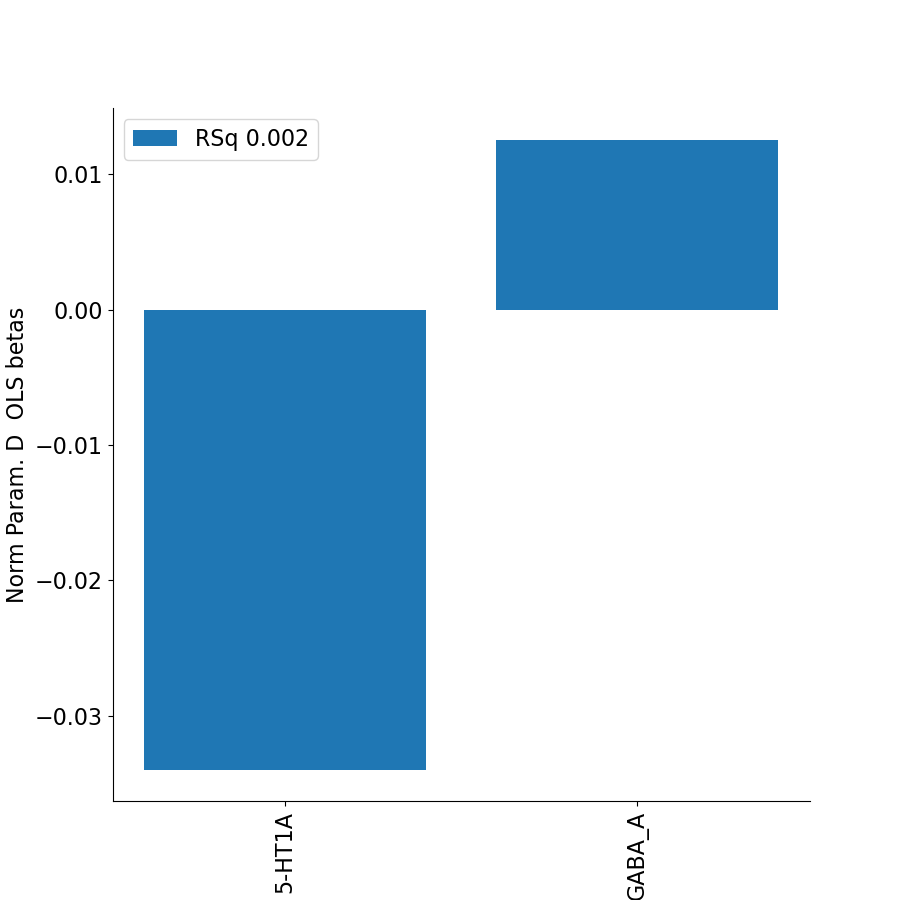

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MBelt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MI
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MIP
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1433
performing OLS (1D y)
Estimated OLS 

<IPython.core.display.Javascript object>


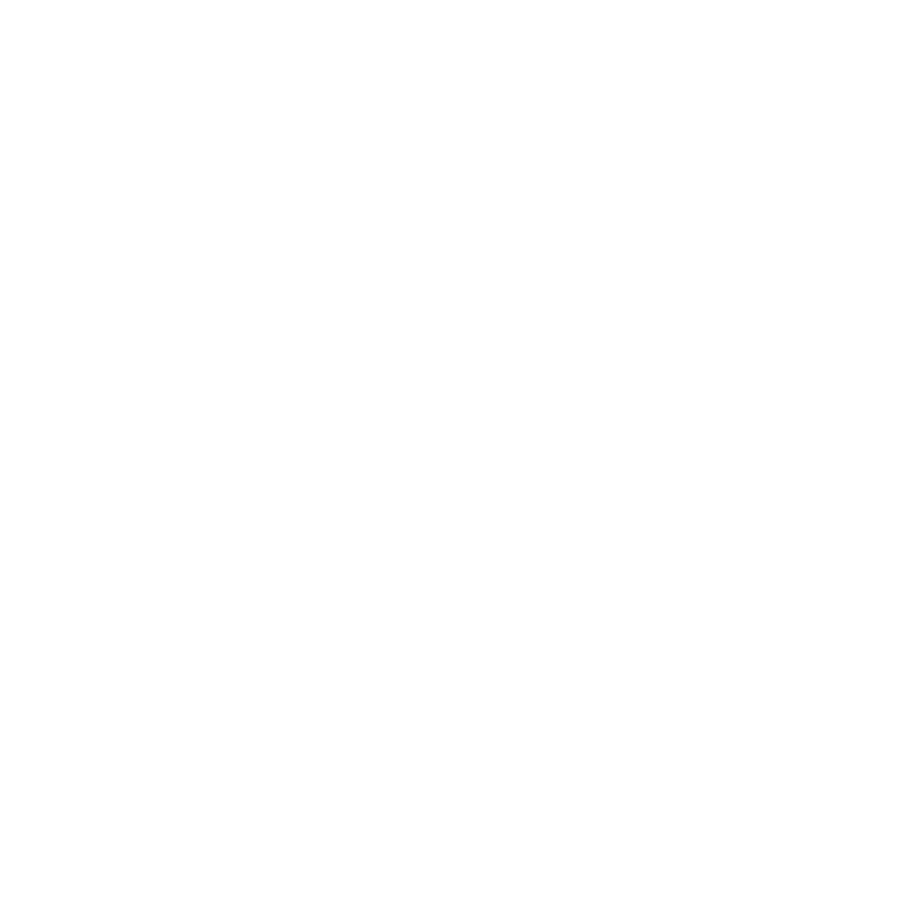

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MST
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 745
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.7342 -0.0252]
wRSq 0.1858005725132741
wCC prediction 0.4310459053433563


<IPython.core.display.Javascript object>


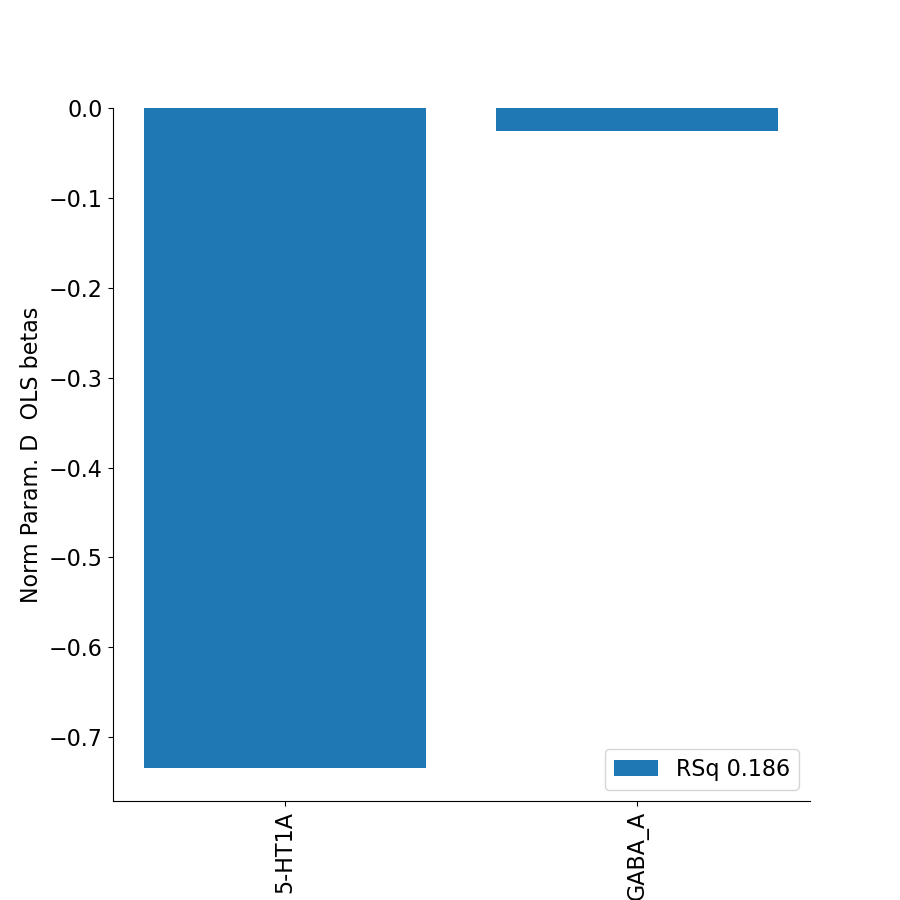

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_MT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 586
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.7993 -0.009 ]
wRSq 0.29882892502710323
wCC prediction 0.5466524718933439


<IPython.core.display.Javascript object>


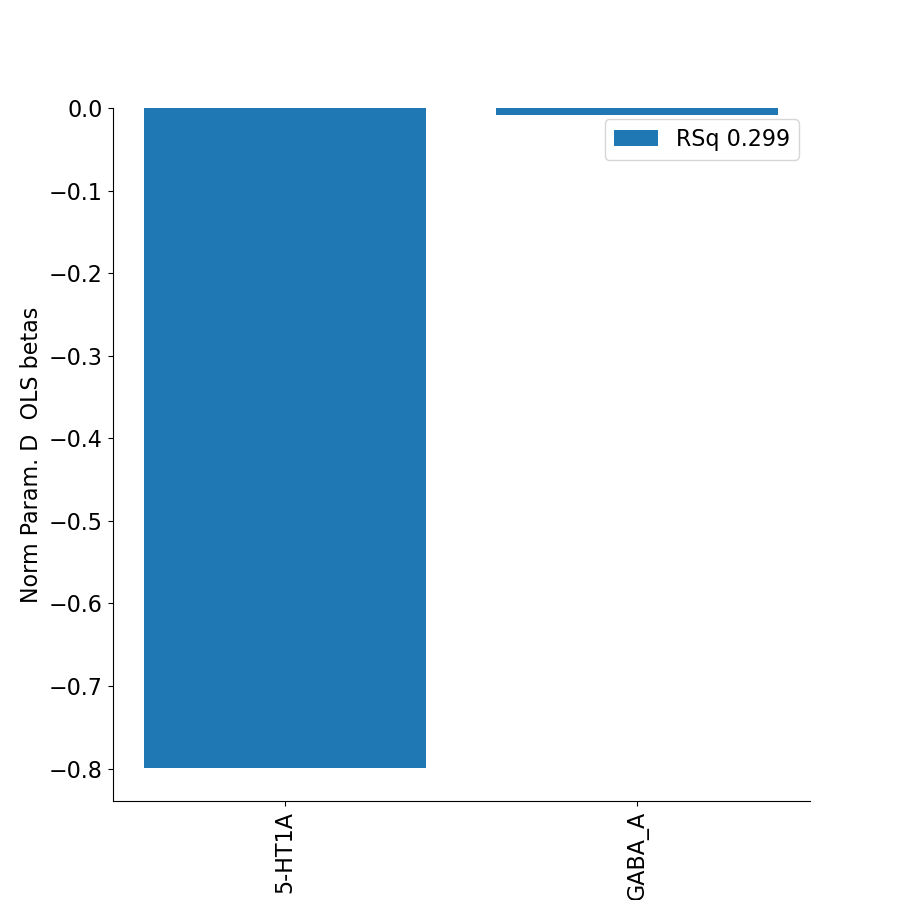

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OFC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_OP2-3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


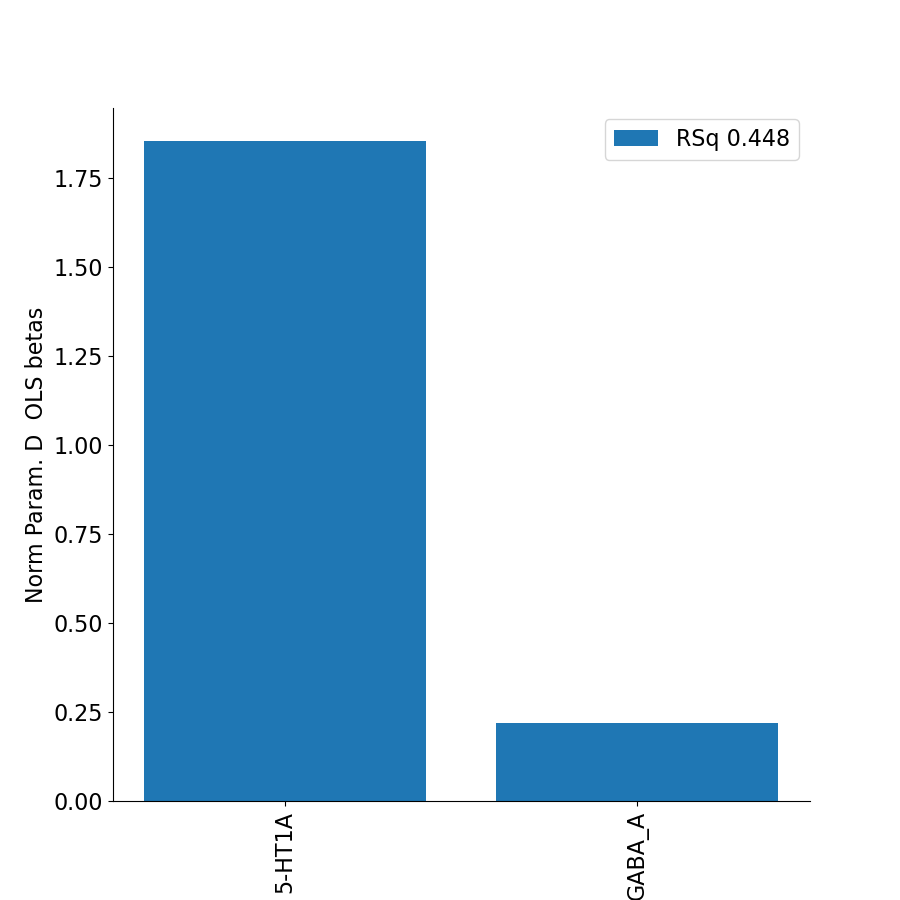

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p47r
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_p9-46v
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 93
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.1417  0.226 ]
wRSq 0.1254737330885327
wCC prediction 0.35422271678780387


<IPython.core.display.Javascript object>


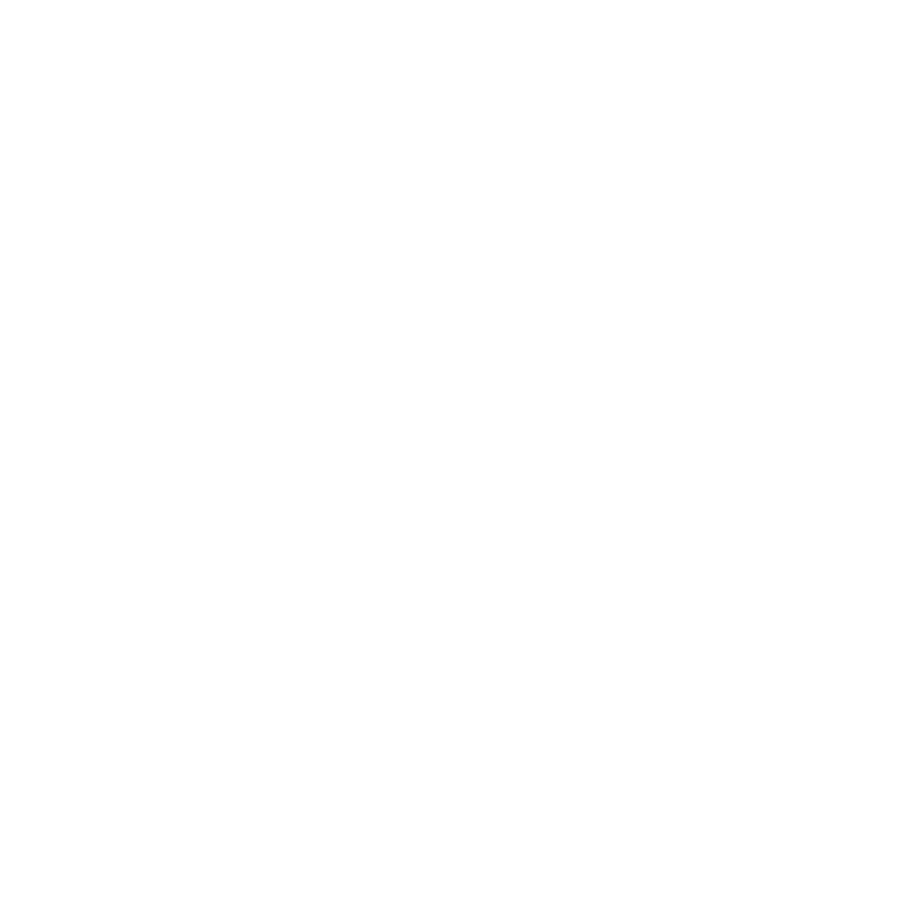

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PBelt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PCV
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 237
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.7676 -0.0277]
wRSq 0.012693490920580253
wCC prediction 0.11266539362457496


<IPython.core.display.Javascript object>


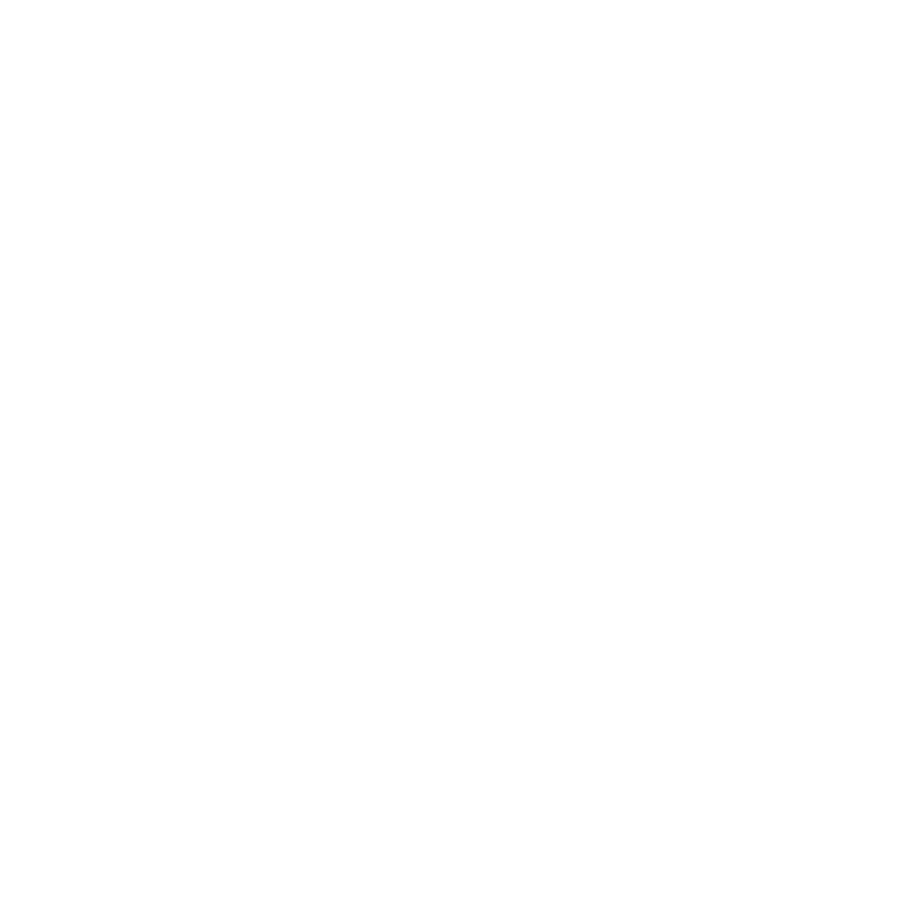

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PeEc
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PEF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 705
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.3796  0.0244]
wRSq 0.05388658664732848
wCC prediction 0.2321348458274378


<IPython.core.display.Javascript object>


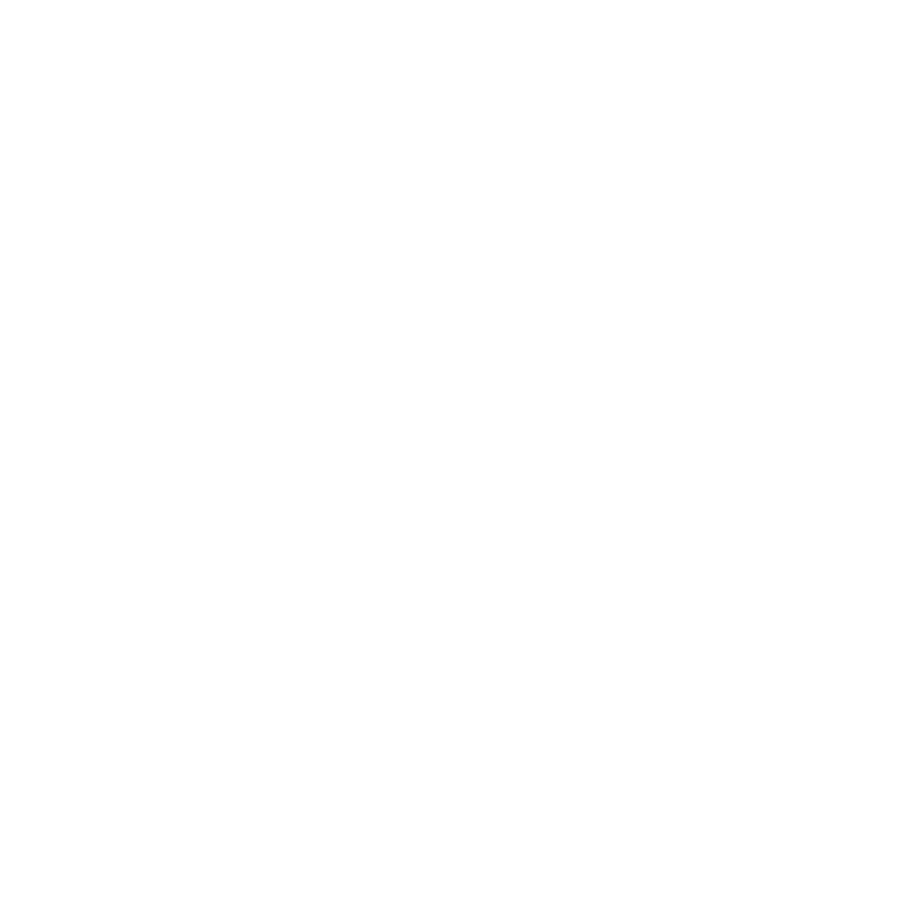

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 404
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.0617  0.0413]
wRSq 0.010584285028395923
wCC prediction 0.10287995445370256


<IPython.core.display.Javascript object>


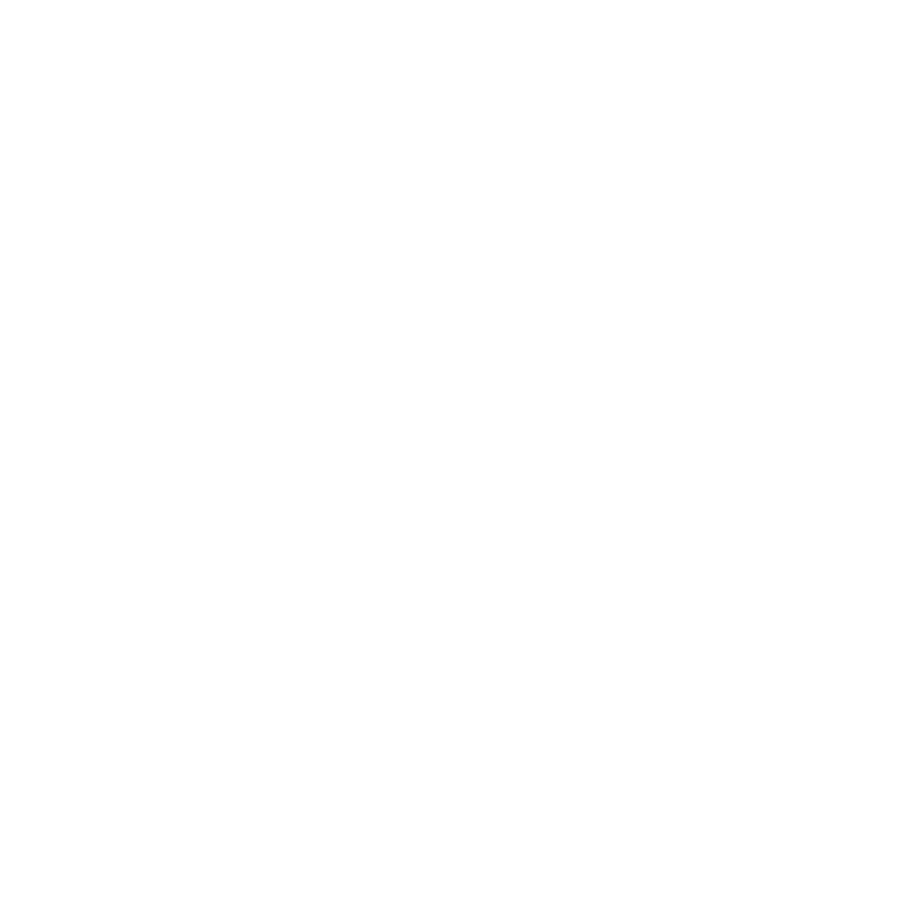

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFcm
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFm
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFop
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 412
performing OLS (1D y)
Estimated OLS 

<IPython.core.display.Javascript object>


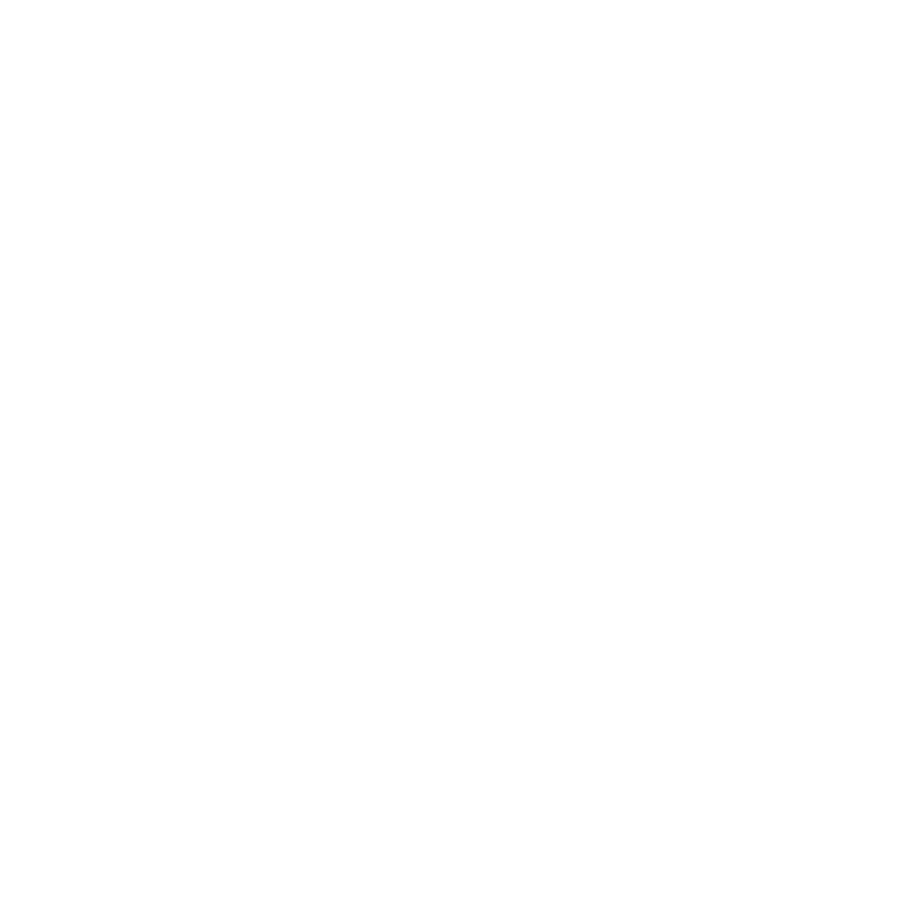

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PFt
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1721
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.7458 -0.068 ]
wRSq 0.031027421015355938
wCC prediction 0.1761460218550392


<IPython.core.display.Javascript object>


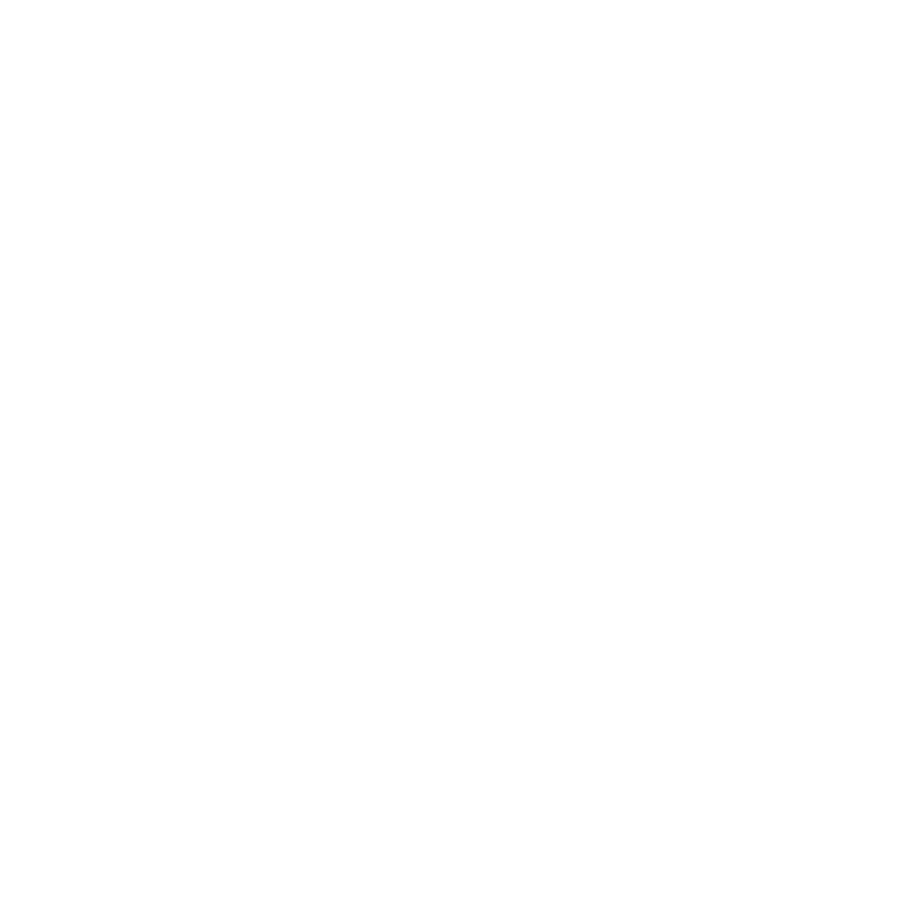

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGi
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGp
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1116
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.7153 0.0579]
wRSq 0.05299561907764616
wCC prediction 0.23020777371245818


<IPython.core.display.Javascript object>


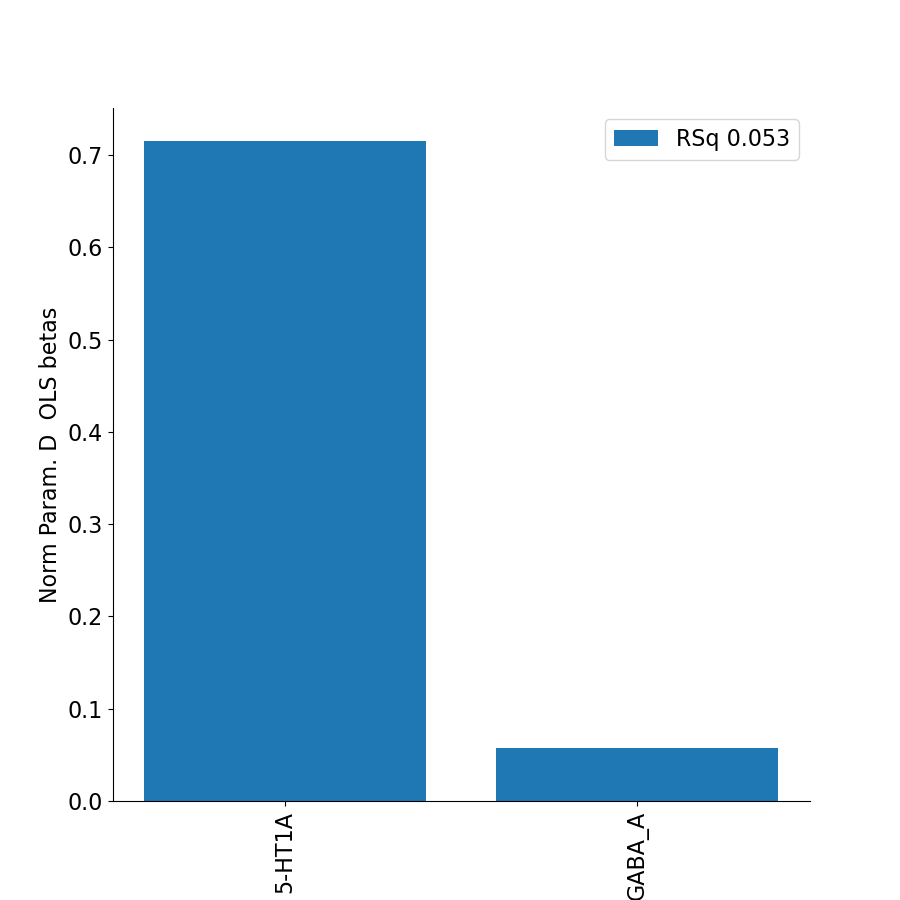

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PGs
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PH
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1312
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.3032 0.0113]
wRSq 0.01687214858044317
wCC prediction 0.12989283498501053


<IPython.core.display.Javascript object>


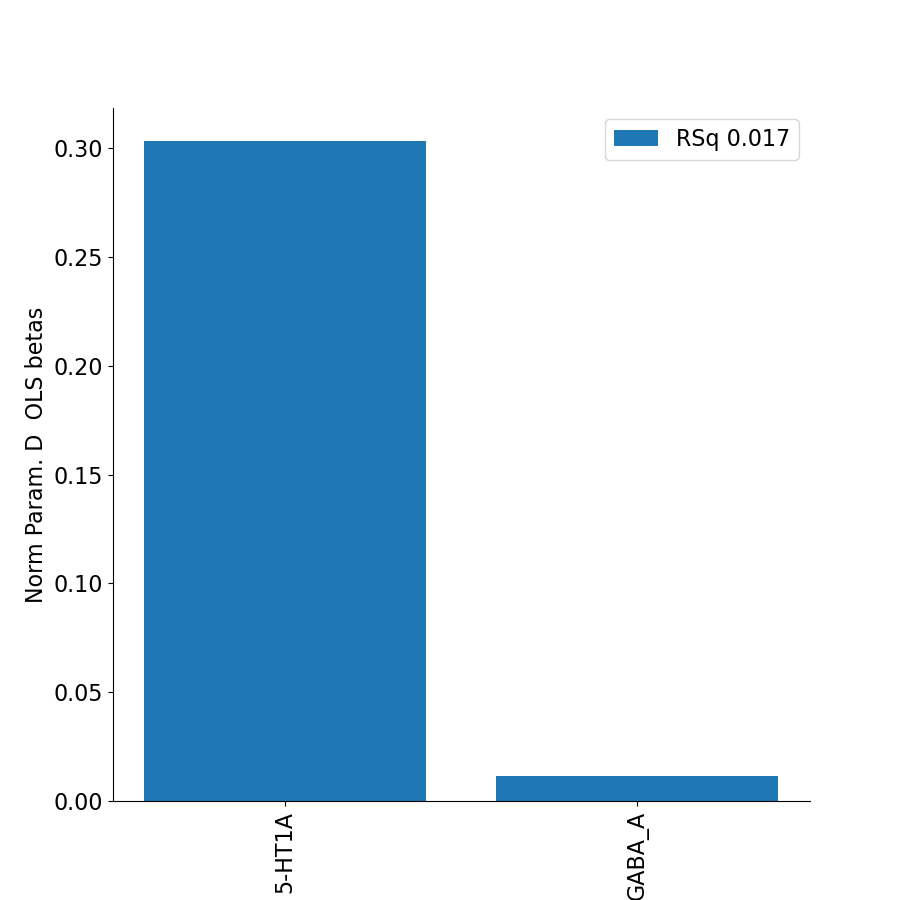

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHA3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 216
performing OLS (1D y)
Estimated OLS

<IPython.core.display.Javascript object>


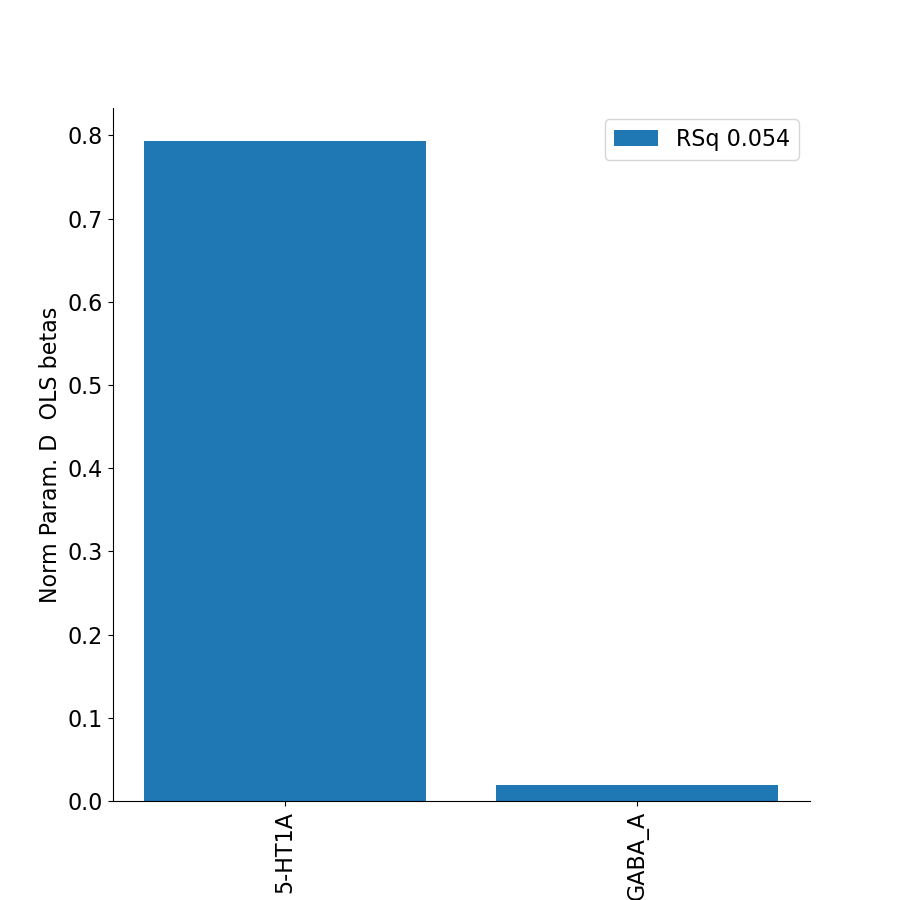

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PHT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 81
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.253  -0.0606]
wRSq 0.019821427012639004
wCC prediction 0.1407885897814132


<IPython.core.display.Javascript object>


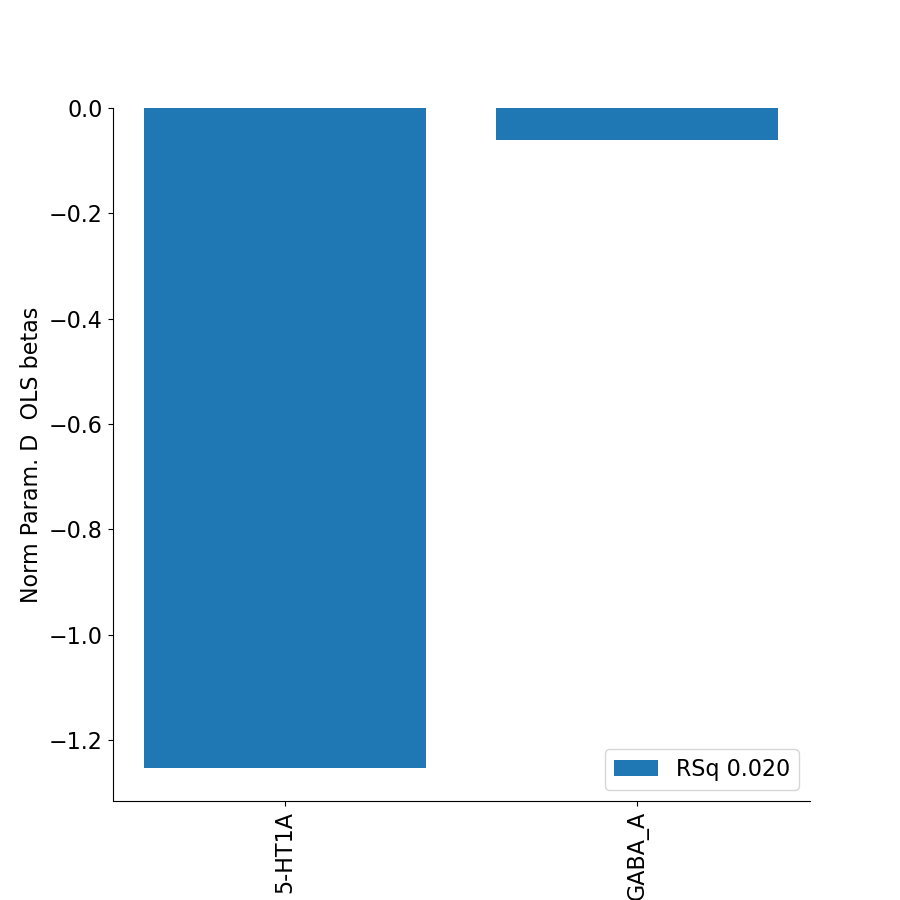

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PI
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_Pir
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PIT
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 678
performing OLS (1D y)
Estimated OLS bet

<IPython.core.display.Javascript object>


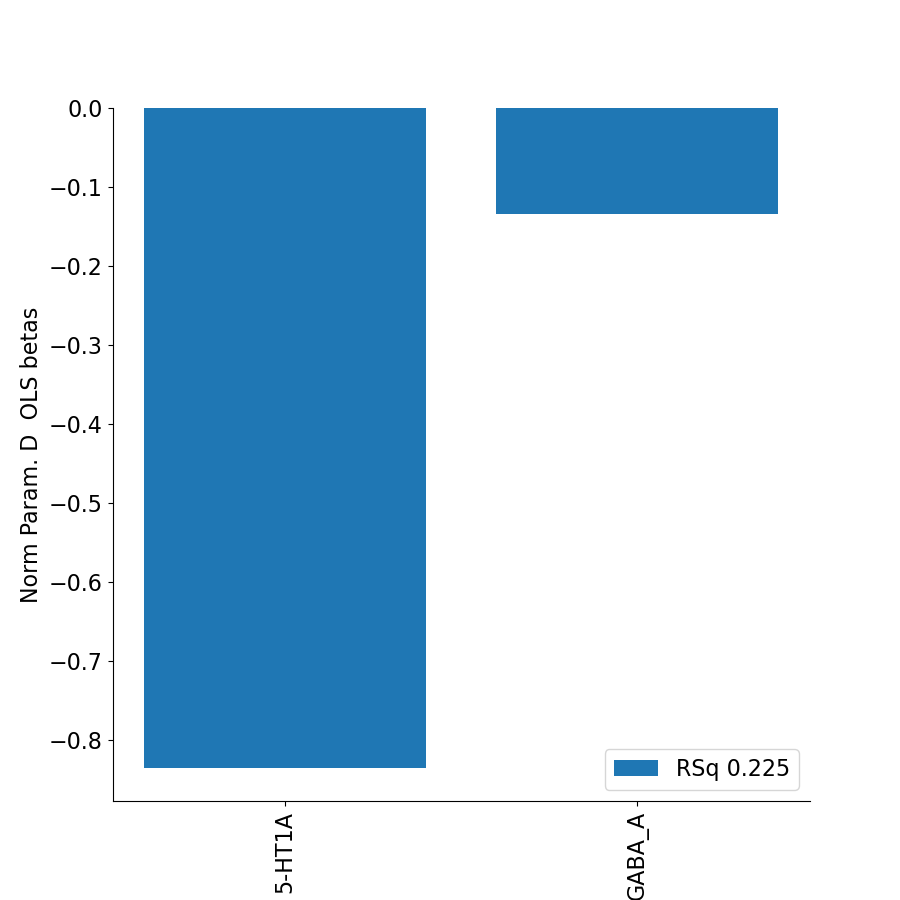

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_pOFC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PoI2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_c

<IPython.core.display.Javascript object>


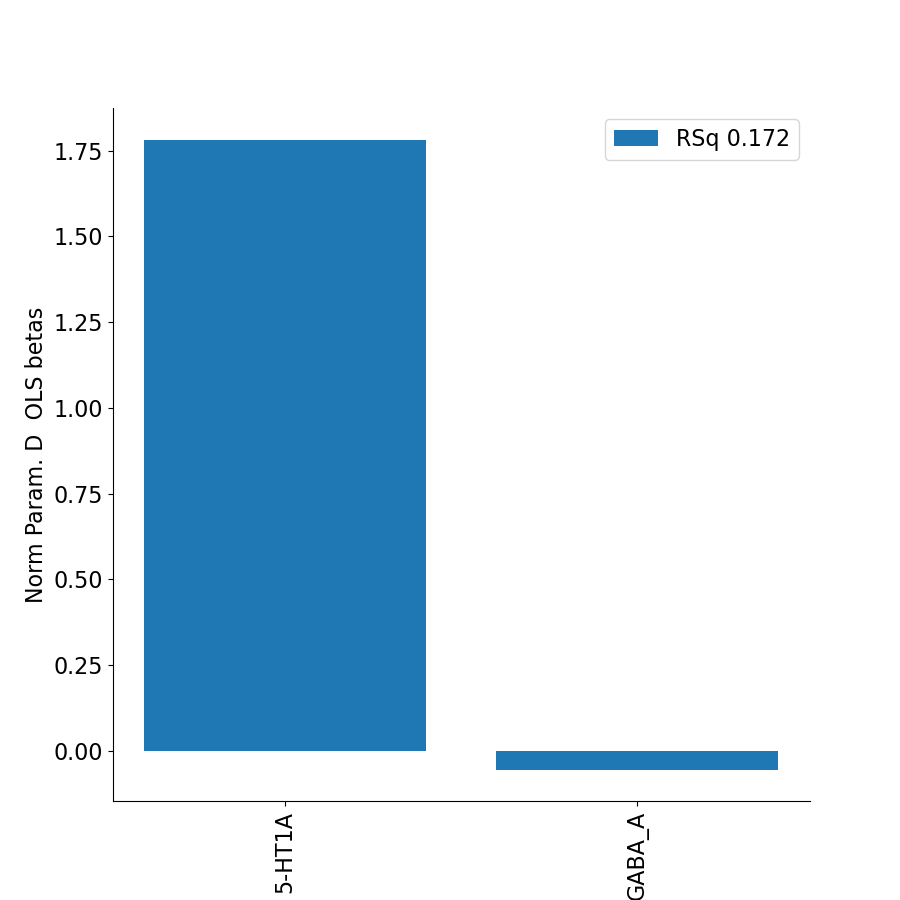

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PreS
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_ProS
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_PSL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


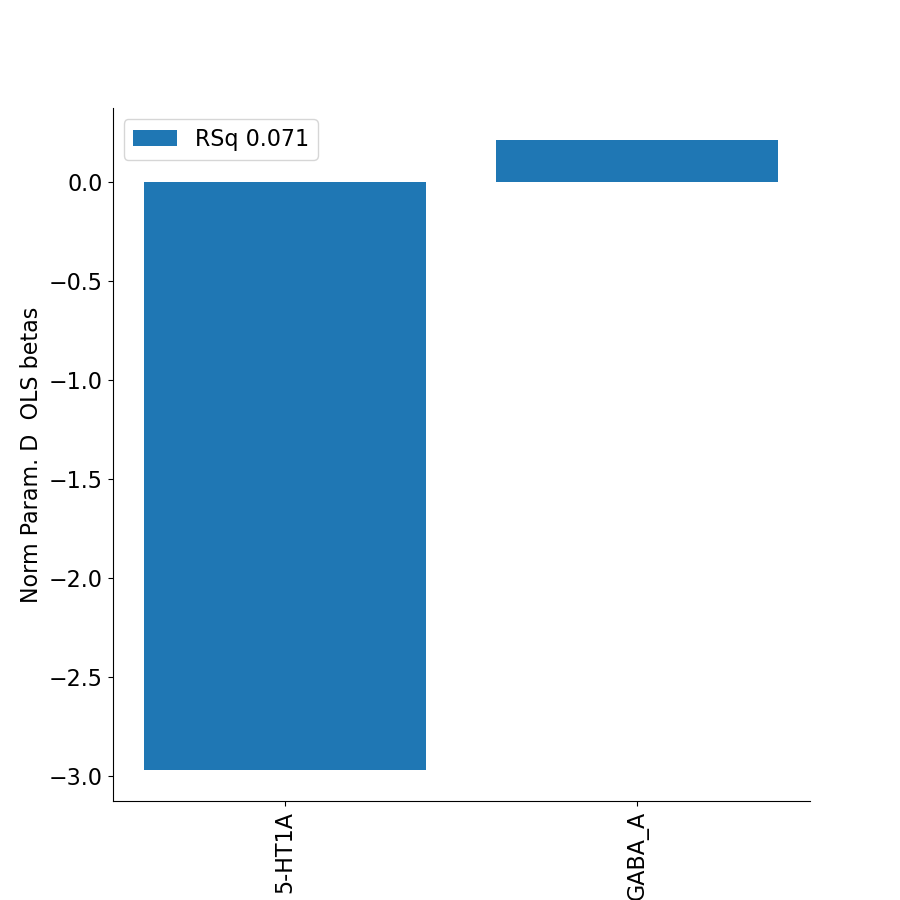

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_SFL
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STGa
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_STSda
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_c

<IPython.core.display.Javascript object>


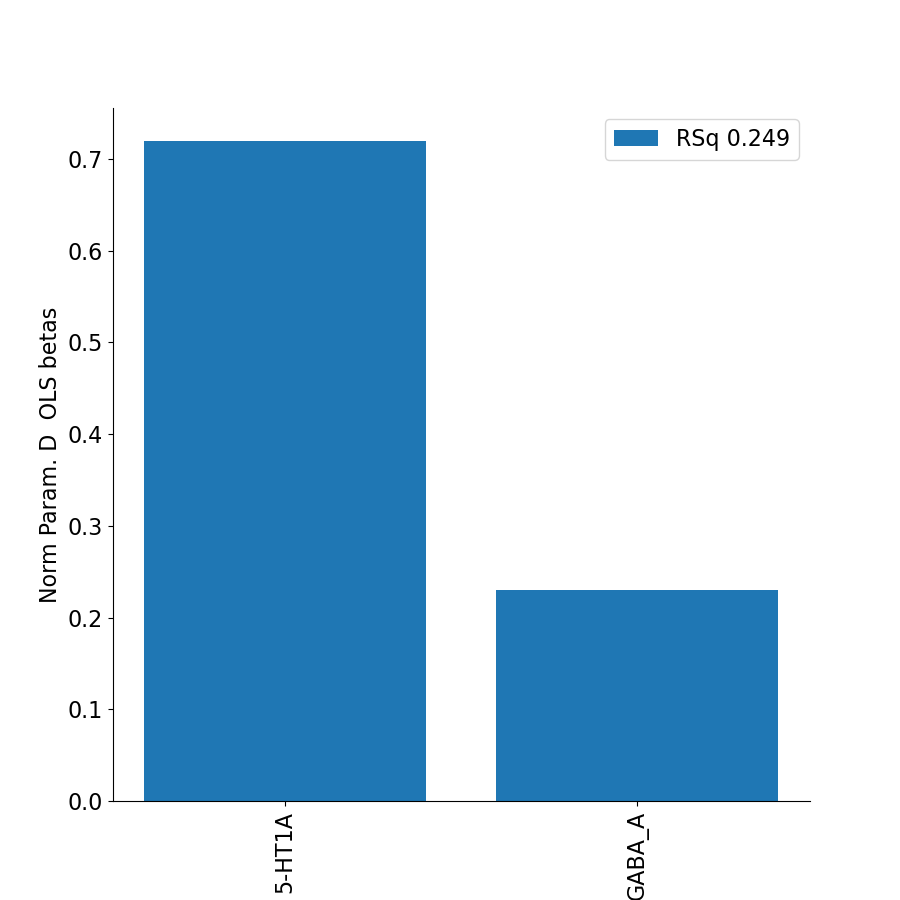

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TF
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 30
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.6925  0.0021]
wRSq 0.026993654708783343
wCC prediction 0.16429745801071785


<IPython.core.display.Javascript object>


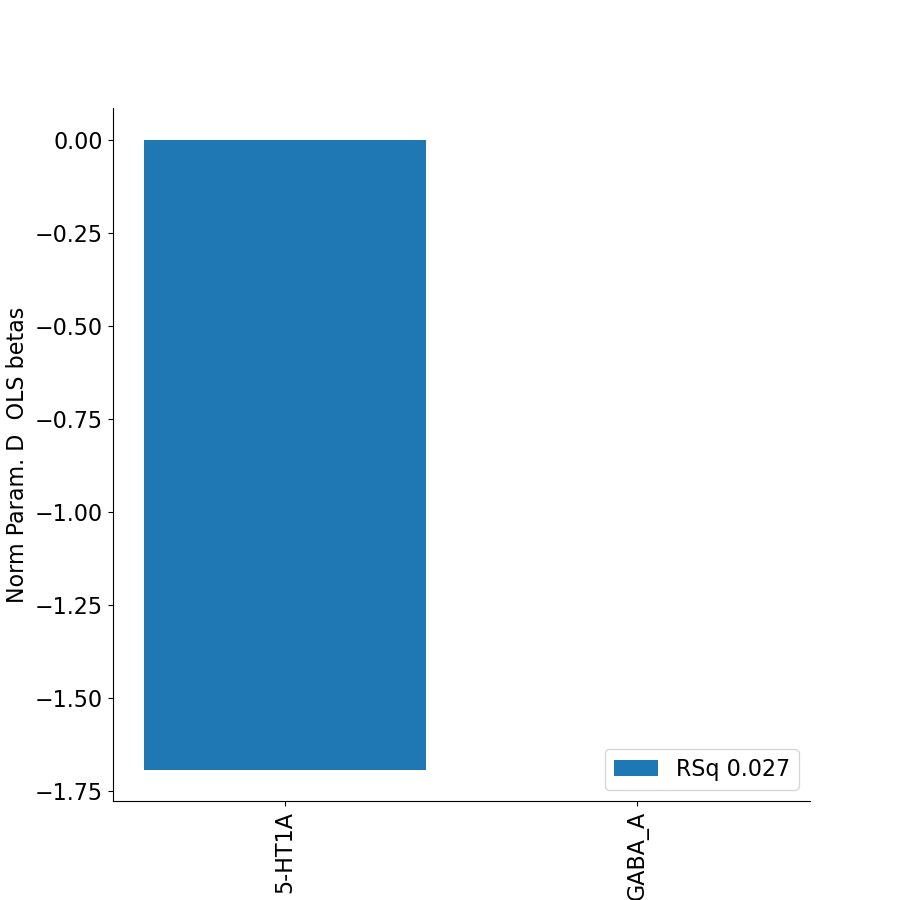

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TGd
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TGv
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TPOJ1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cv

<IPython.core.display.Javascript object>


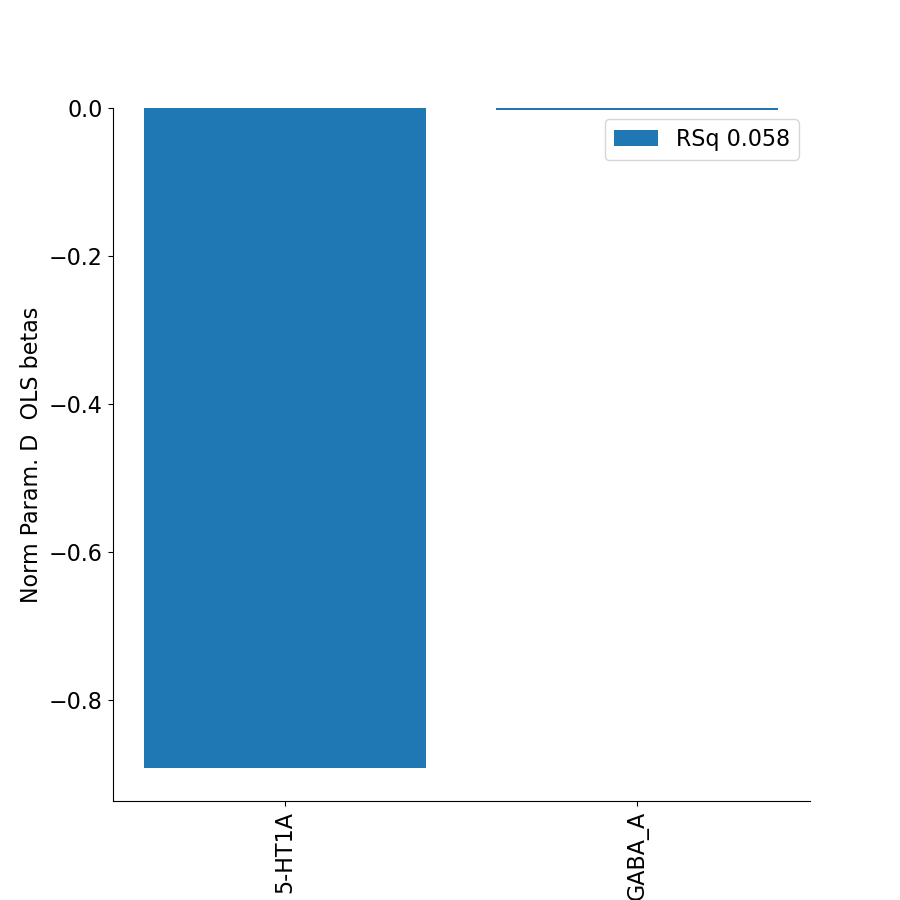

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_TPOJ3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 580
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.1997 -0.0144]
wRSq 0.020614900035333505
wCC prediction 0.14357889829405088


<IPython.core.display.Javascript object>


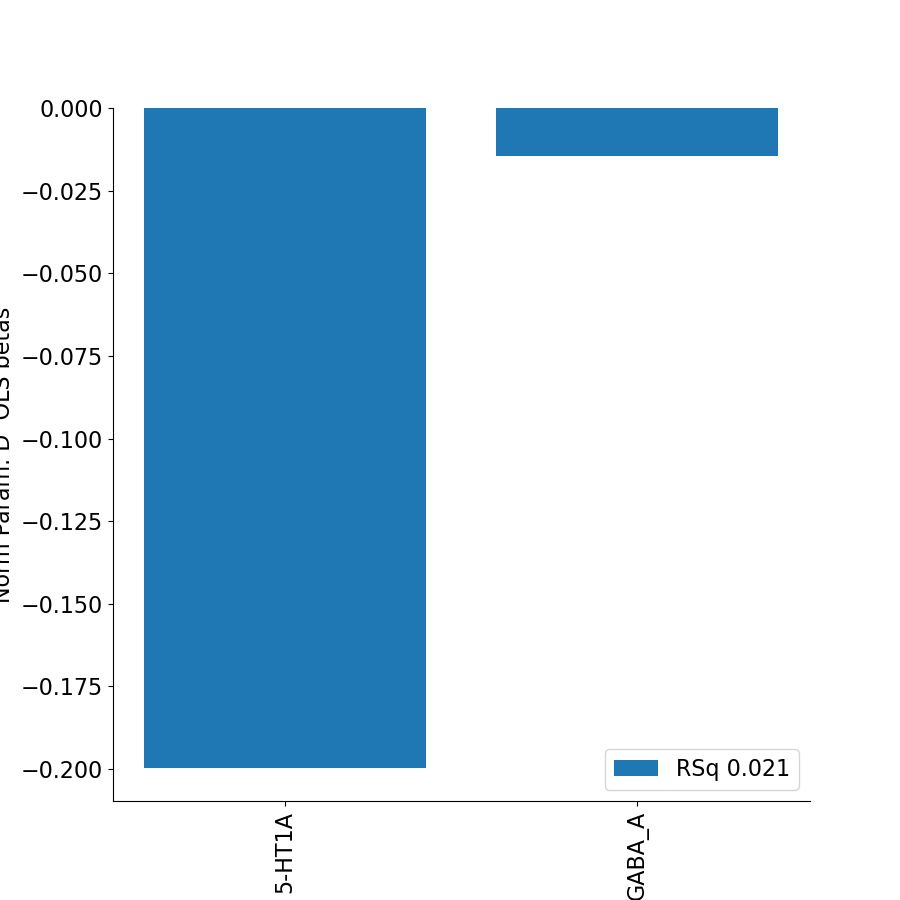

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 4593
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.1935  0.1315]
wRSq 0.3507769366102599
wCC prediction 0.5922642455950387


<IPython.core.display.Javascript object>


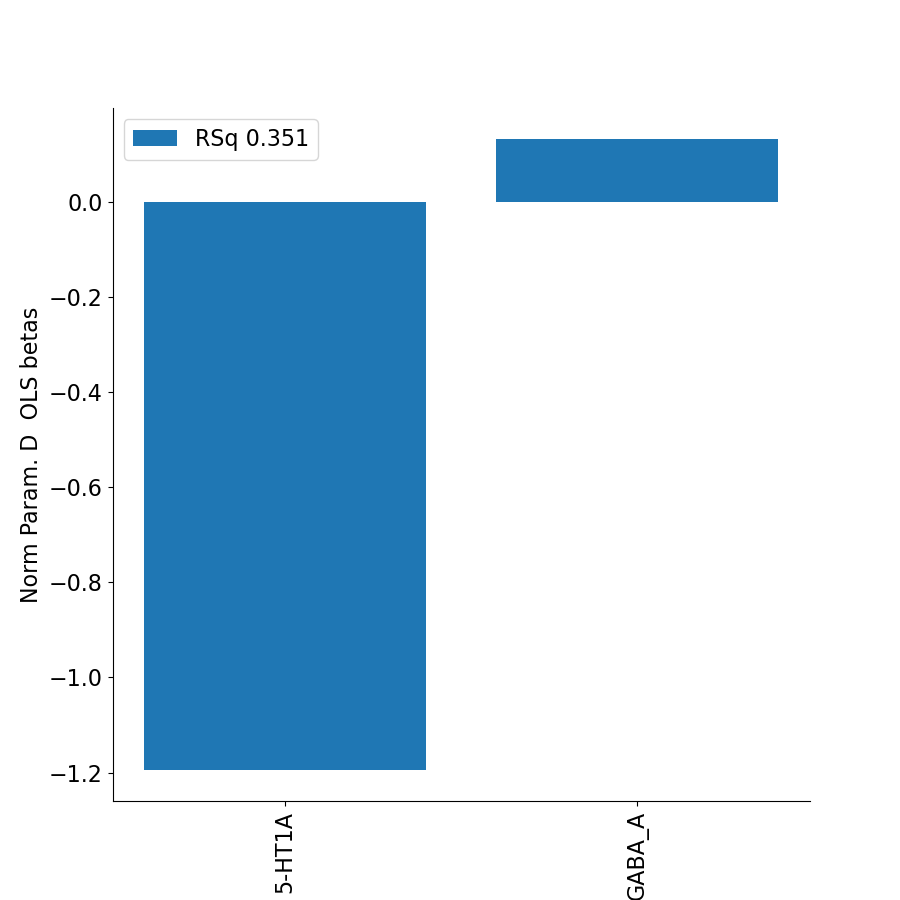

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 3472
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.4236  0.0585]
wRSq 0.17137248286517404
wCC prediction 0.41397159668892003


<IPython.core.display.Javascript object>


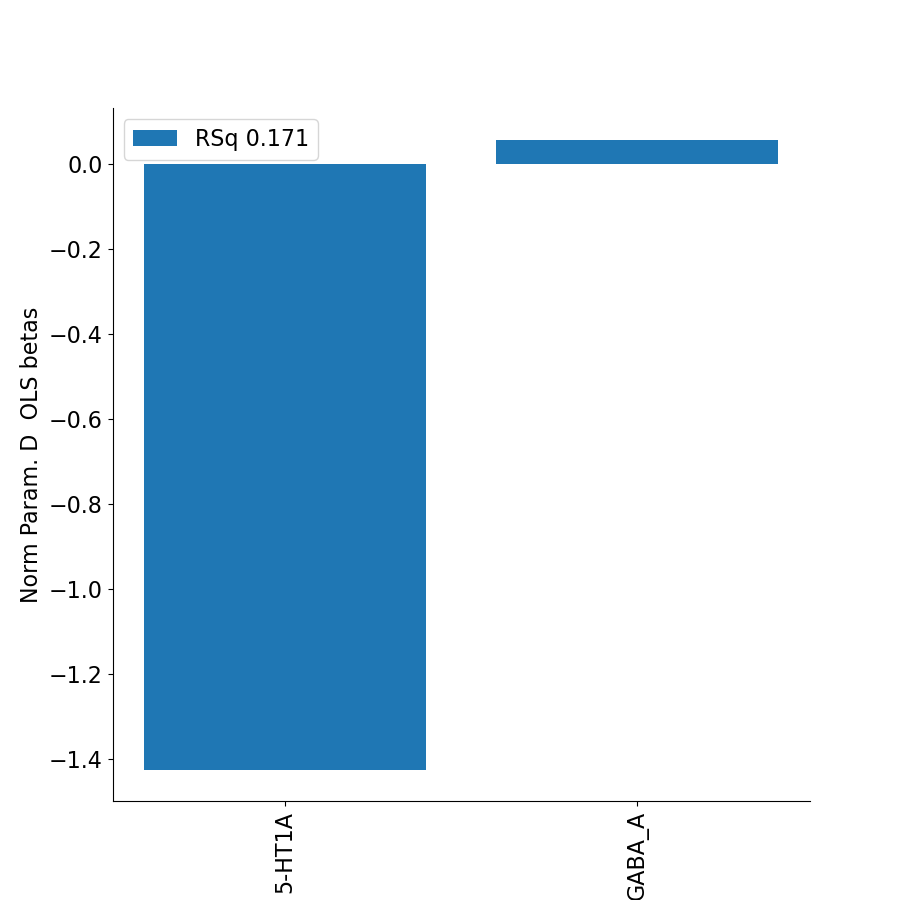

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_v23ab
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 0
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2929
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-2.3479  0.026 ]
wRSq 0.33281295509957387
wCC prediction 0.5768994323966473


<IPython.core.display.Javascript object>


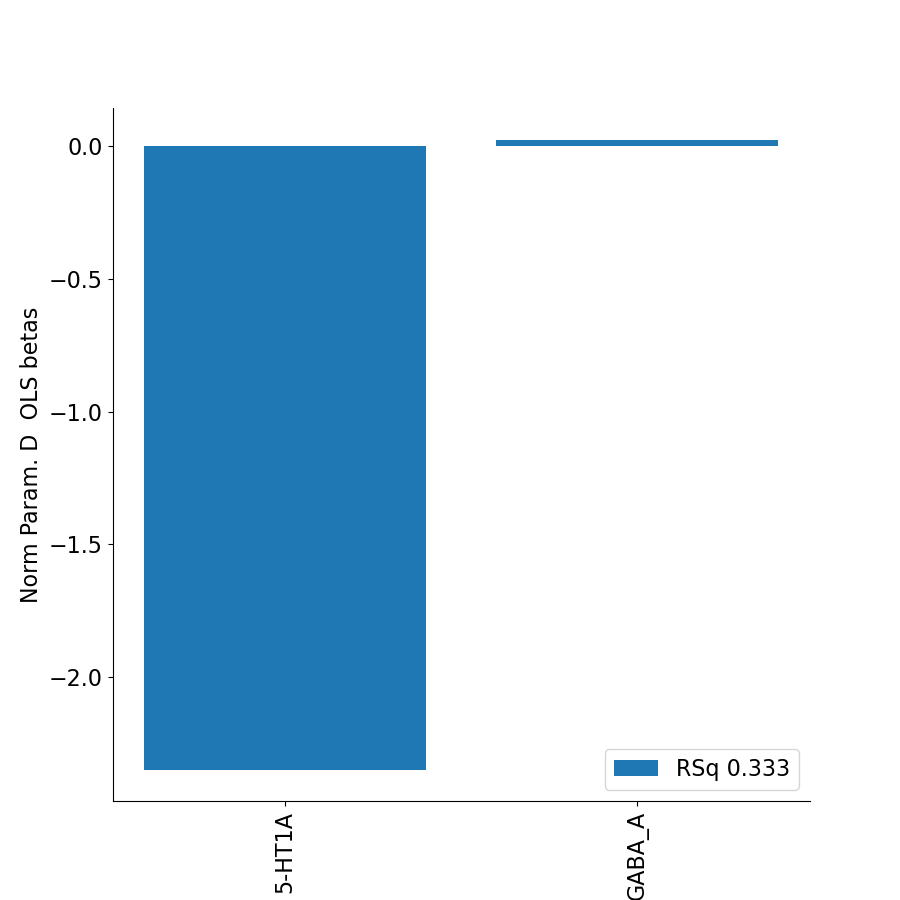

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3A
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1205
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [0.4704 0.3277]
wRSq 0.18237222118575913
wCC prediction 0.42705060728883076


<IPython.core.display.Javascript object>


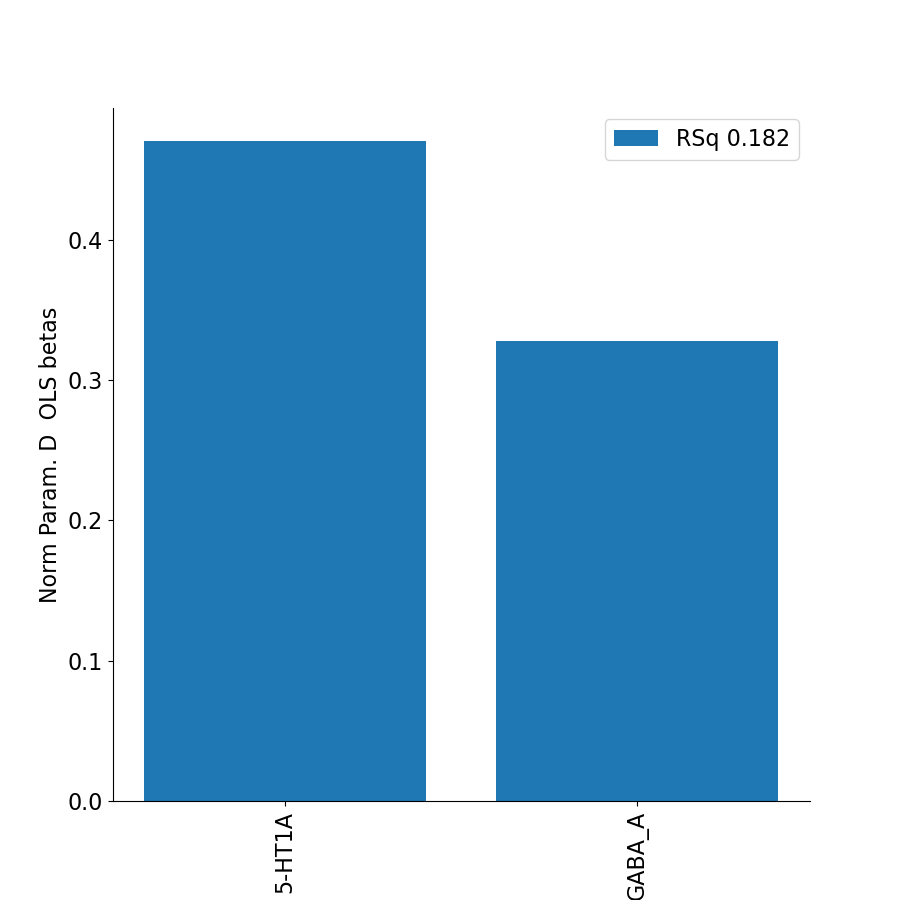

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3B
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 734
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.7853  0.0666]
wRSq 0.28454470289579215
wCC prediction 0.5334273173505388


<IPython.core.display.Javascript object>


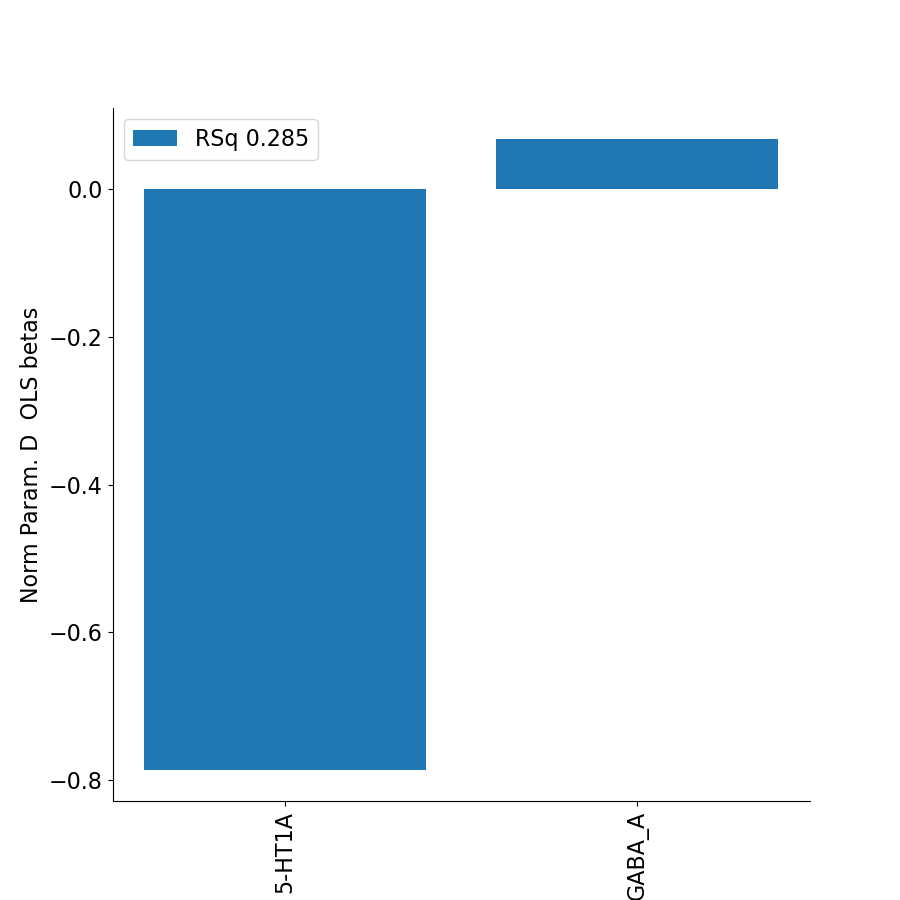

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3CD
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 768
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.9856 -0.0083]
wRSq 0.2876472957650483
wCC prediction 0.5363276011590756


<IPython.core.display.Javascript object>


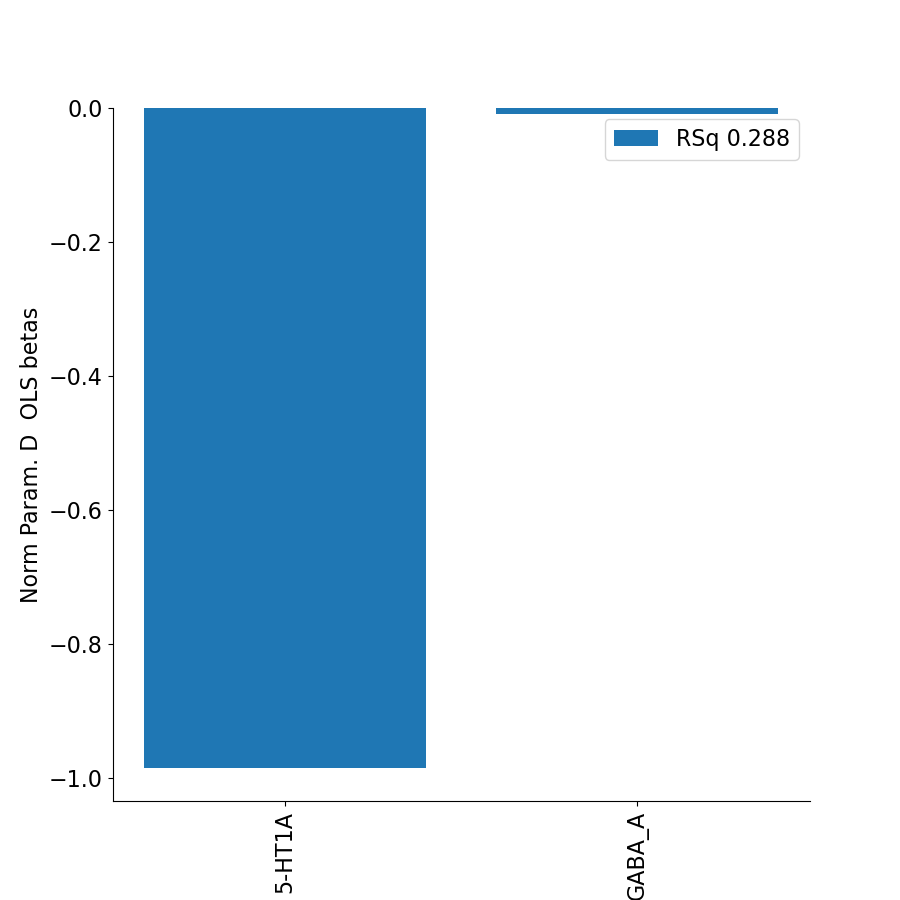

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 2858
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-1.9318 -0.0164]
wRSq 0.43393101911123033
wCC prediction 0.6587344071105066


<IPython.core.display.Javascript object>


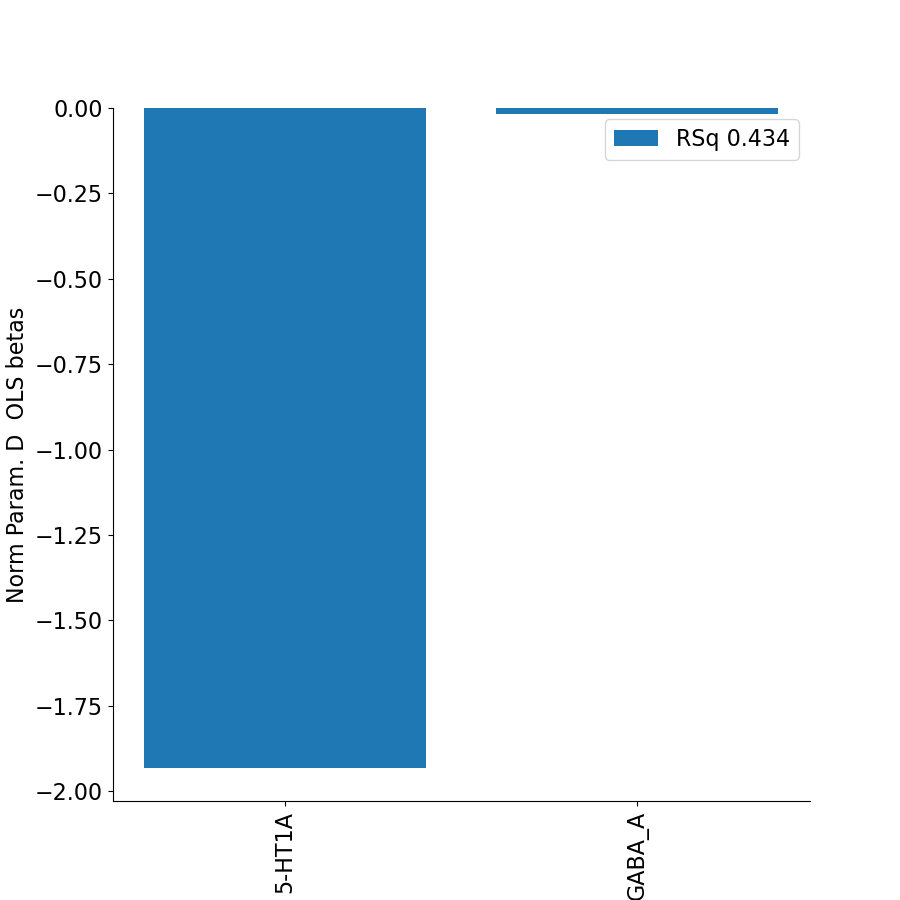

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4t
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 455
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.8017 -0.1969]
wRSq 0.15399881137796434
wCC prediction 0.39242682295934417


<IPython.core.display.Javascript object>


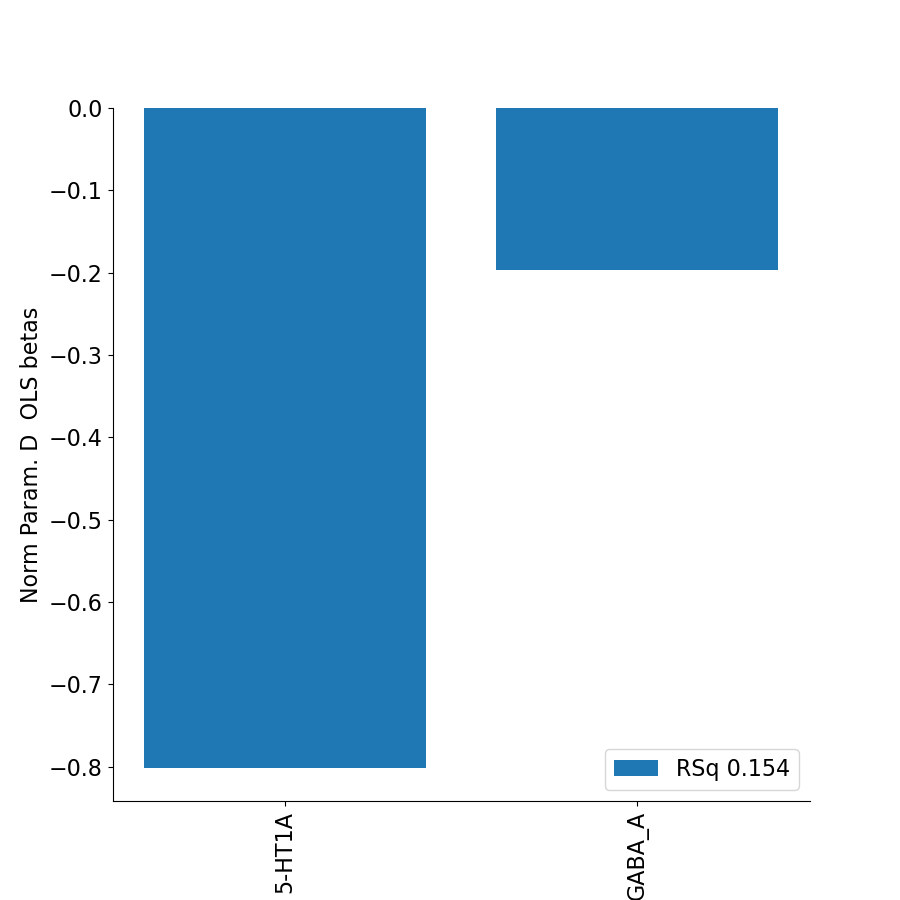

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 246
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.6659 -0.0728]
wRSq 0.013696089751843
wCC prediction 0.11703029416284864


<IPython.core.display.Javascript object>


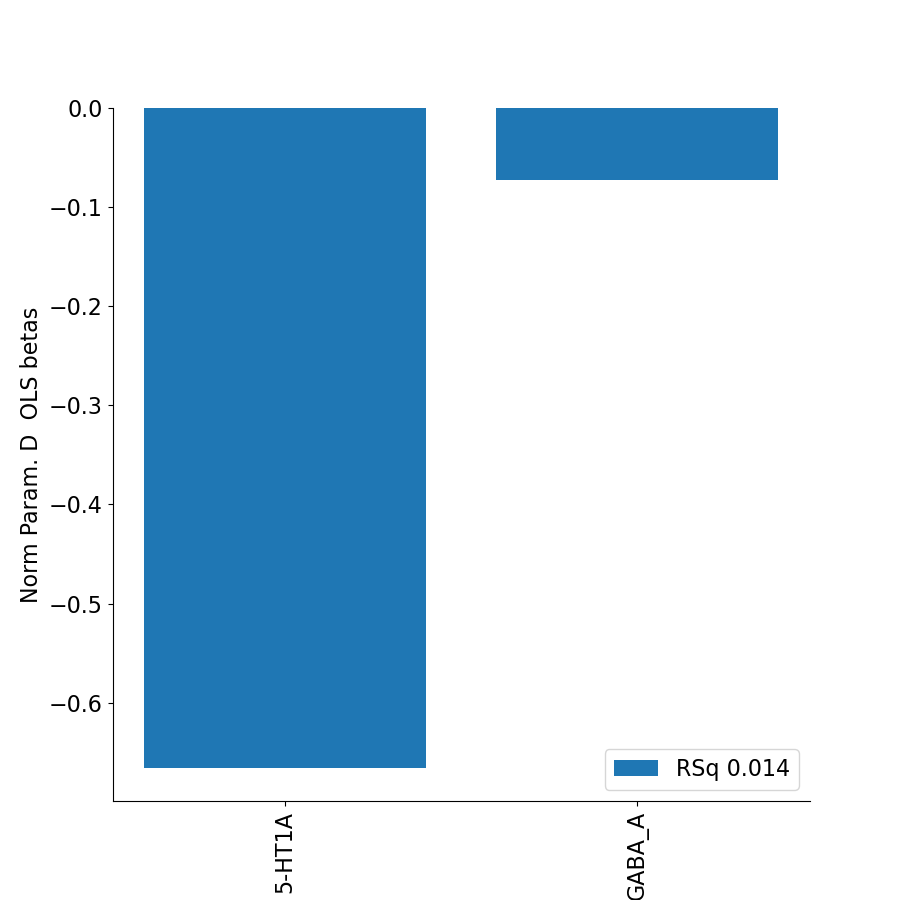

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V6A
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 493
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.1131  0.0467]
wRSq 0.00425989382058245
wCC prediction 0.06526786208067767


<IPython.core.display.Javascript object>


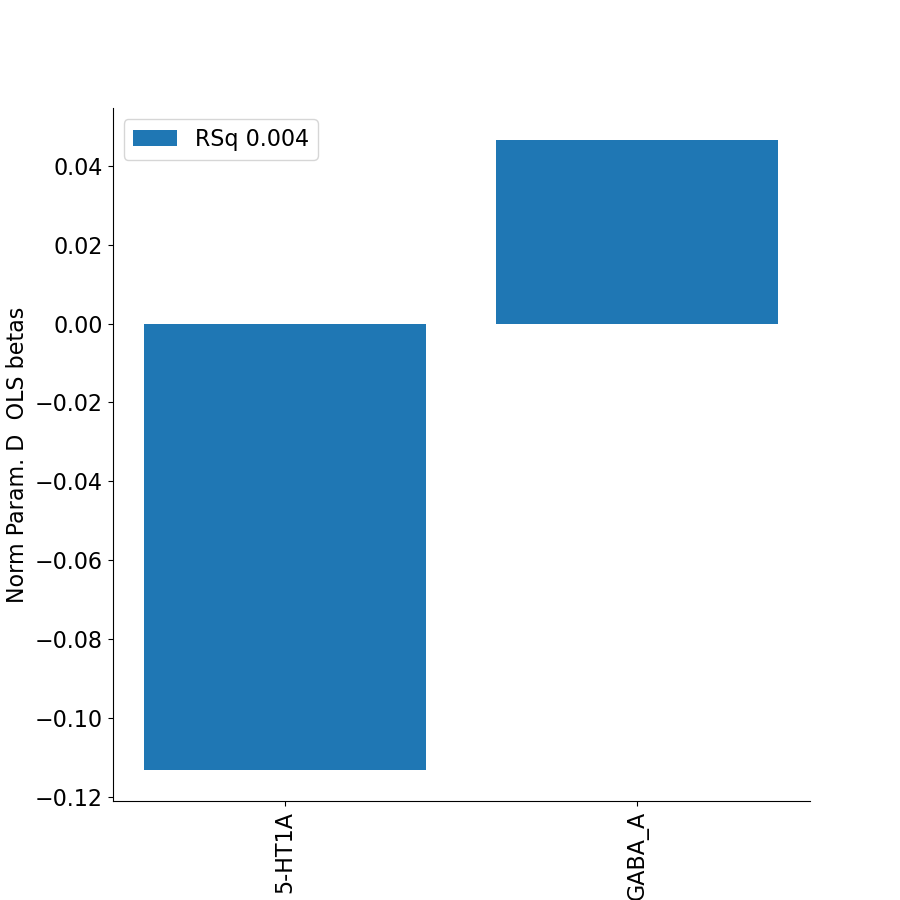

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V7
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 560
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.1562  0.0619]
wRSq 0.0405721677818206
wCC prediction 0.20142534046594196


<IPython.core.display.Javascript object>


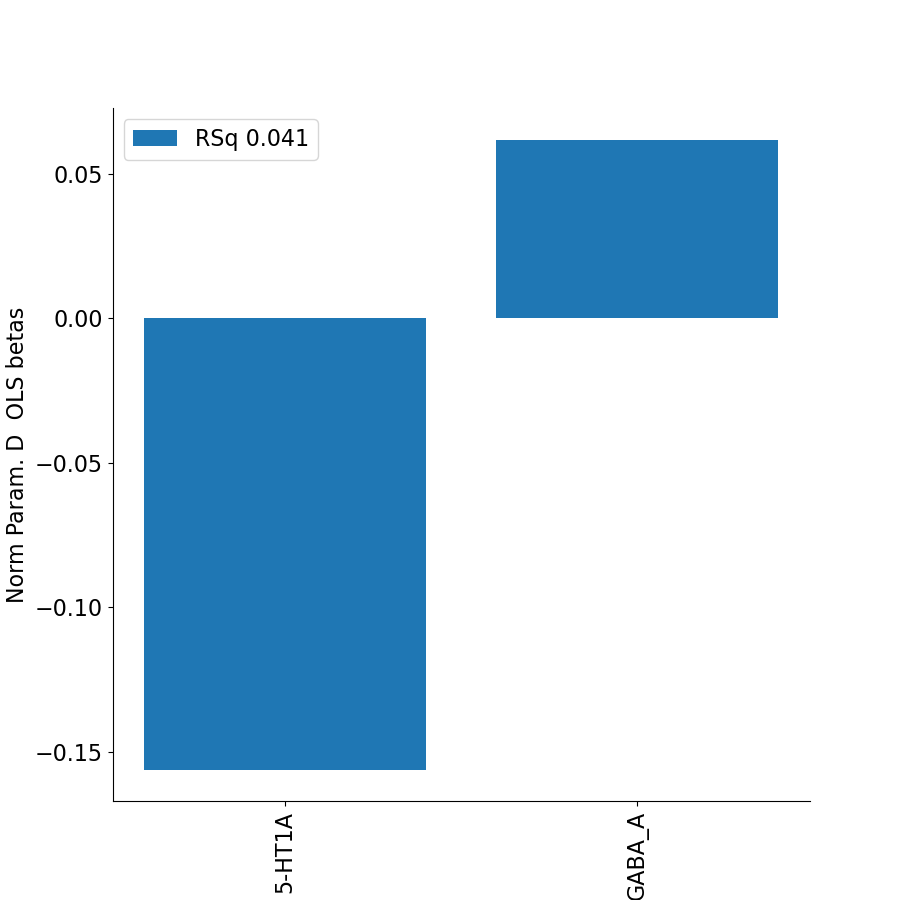

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V8
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 653
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.5241  0.0825]
wRSq 0.09668439732368883
wCC prediction 0.3109411476850384


<IPython.core.display.Javascript object>


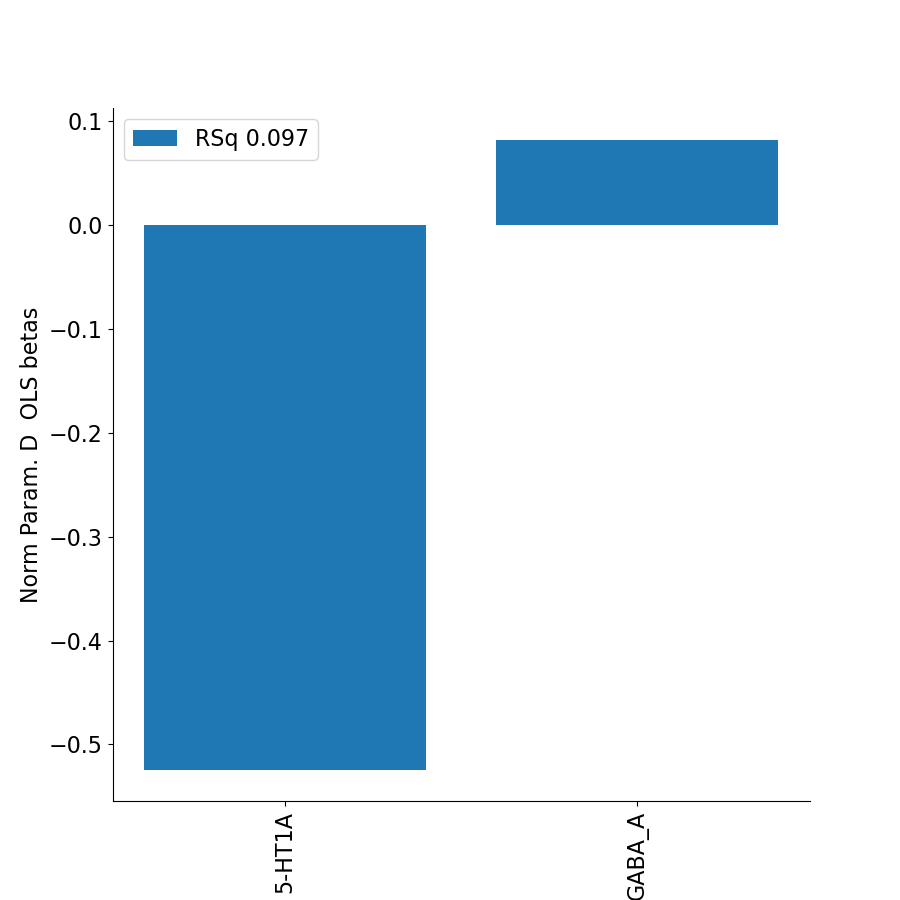

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VIP
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1224
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.3579 -0.0368]
wRSq 0.04668077189635855
wCC prediction 0.2160573347432544


<IPython.core.display.Javascript object>


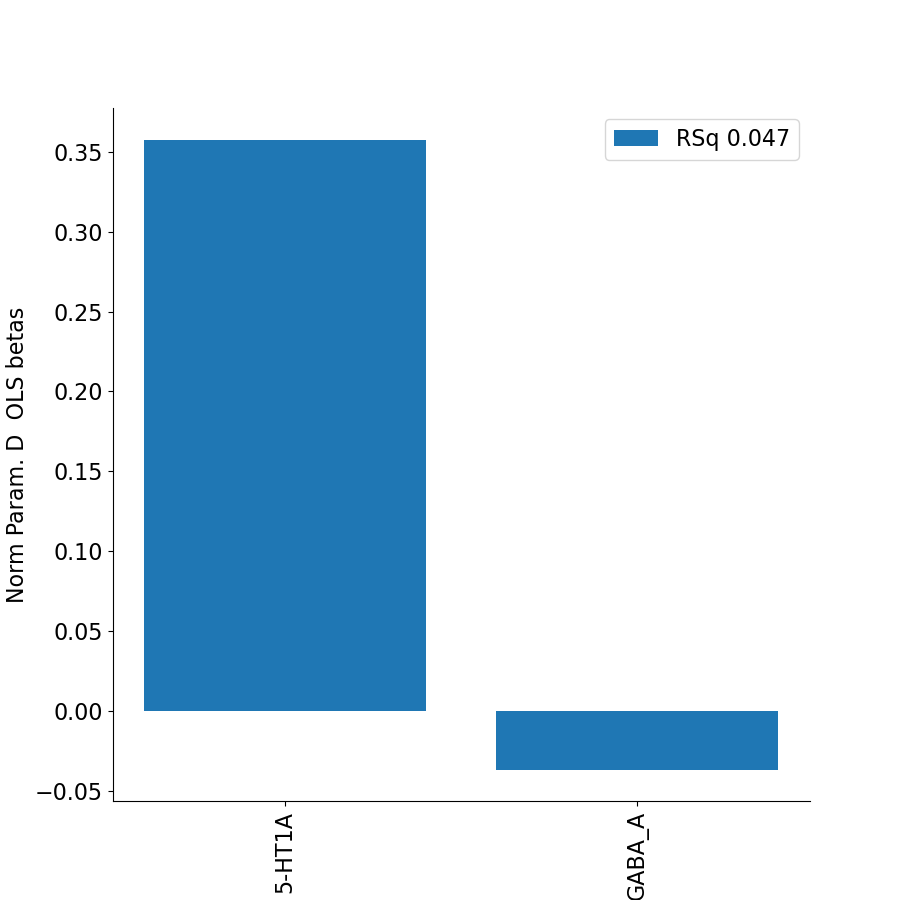

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV1
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 44
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.344  -0.2326]
wRSq 0.3247665306795895
wCC prediction 0.5698829096223096


<IPython.core.display.Javascript object>


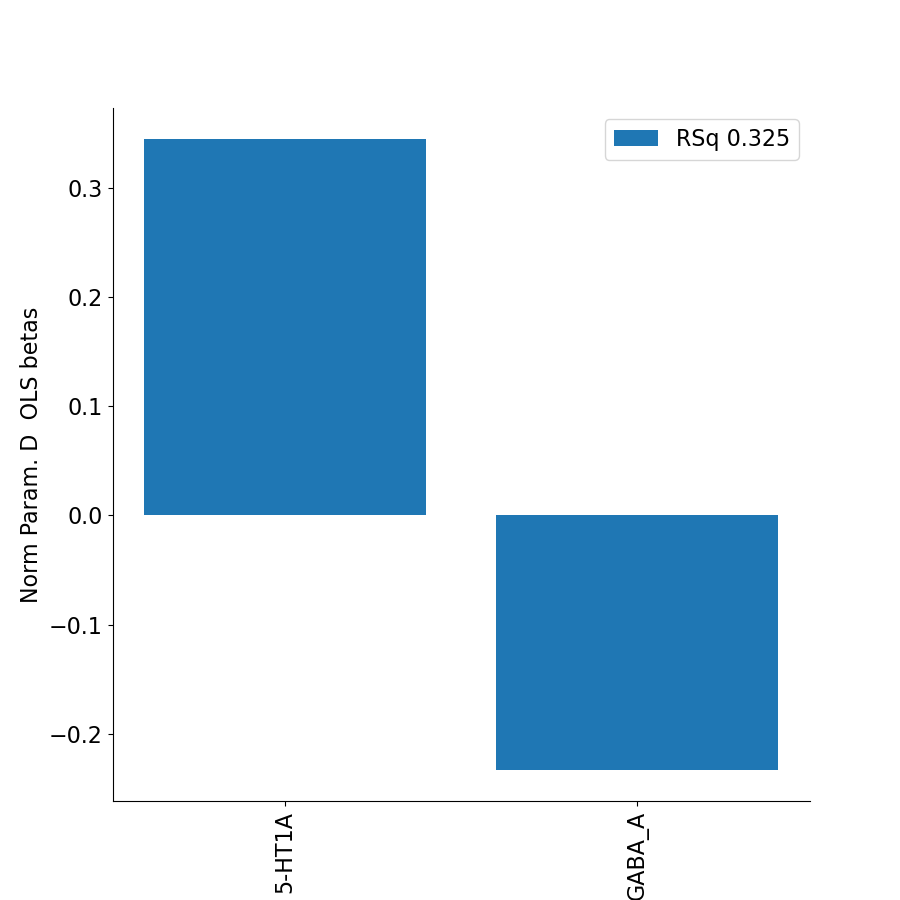

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV2
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 541
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [ 0.5384 -0.0357]
wRSq 0.18990798151269894
wCC prediction 0.4357843291270336


<IPython.core.display.Javascript object>


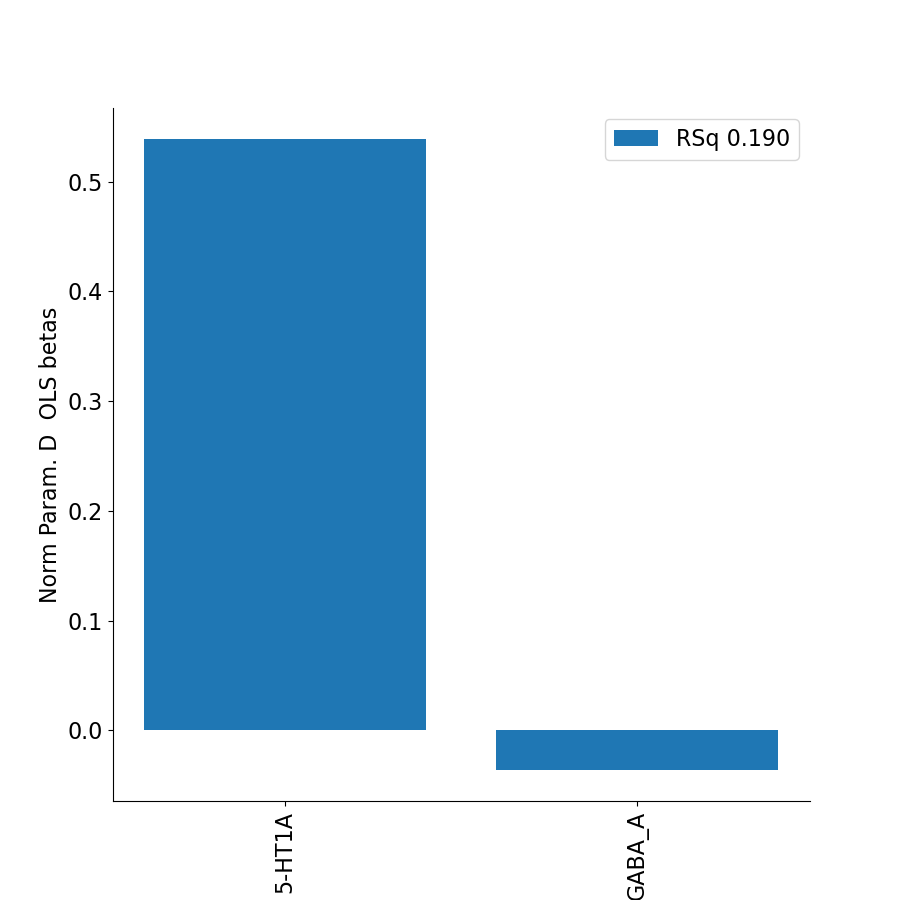

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VMV3
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 662
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.036   0.0084]
wRSq 0.00562543590623521
wCC prediction 0.0750029059852701


<IPython.core.display.Javascript object>


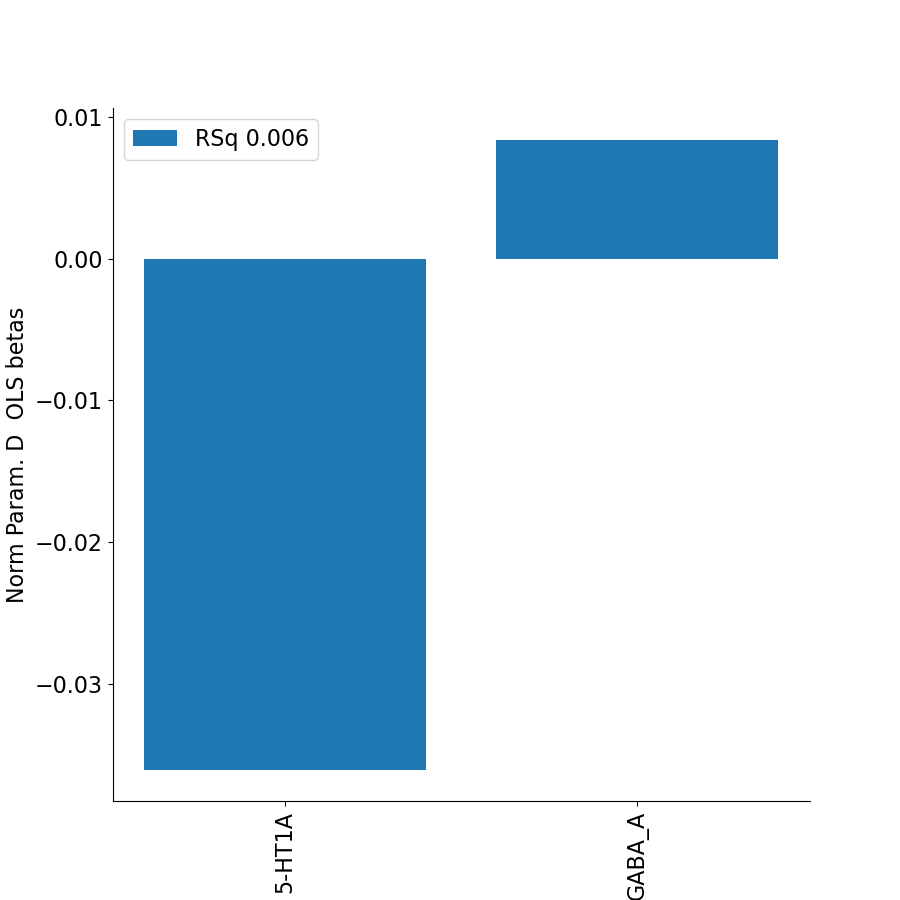

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_VVC
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 1002
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.3449 -0.1628]
wRSq 0.20915236187059438
wCC prediction 0.45733178532723295


<IPython.core.display.Javascript object>


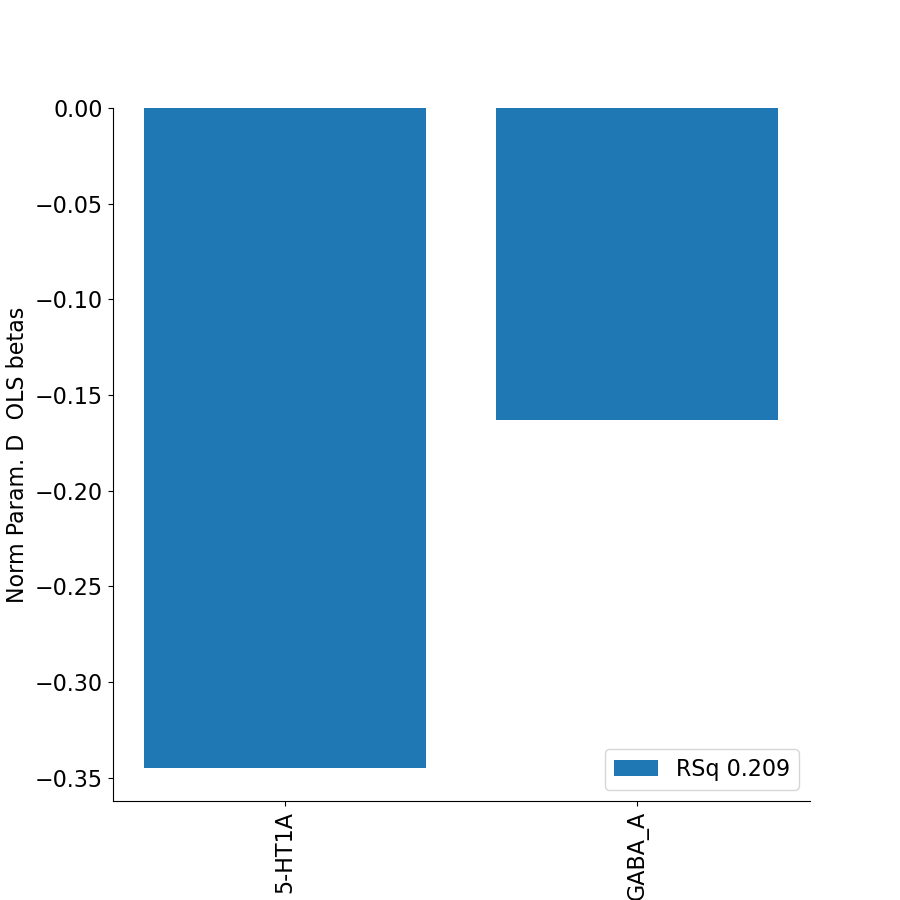

fit-task-BAR_fit-runs-all fsaverage_cvrsq combined
X-dims: ['5-HT1A', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd']
alldims ['5-HT1A', 'GABA_A', 'Norm Param. D Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd']
Sample size: 59942
performing OLS (1D y)
Estimated OLS betas Norm Param. D Norm_abcd [-0.8881  0.0637]
wRSq 0.6071672884828532
wCC prediction 0.7792093996371277


<IPython.core.display.Javascript object>


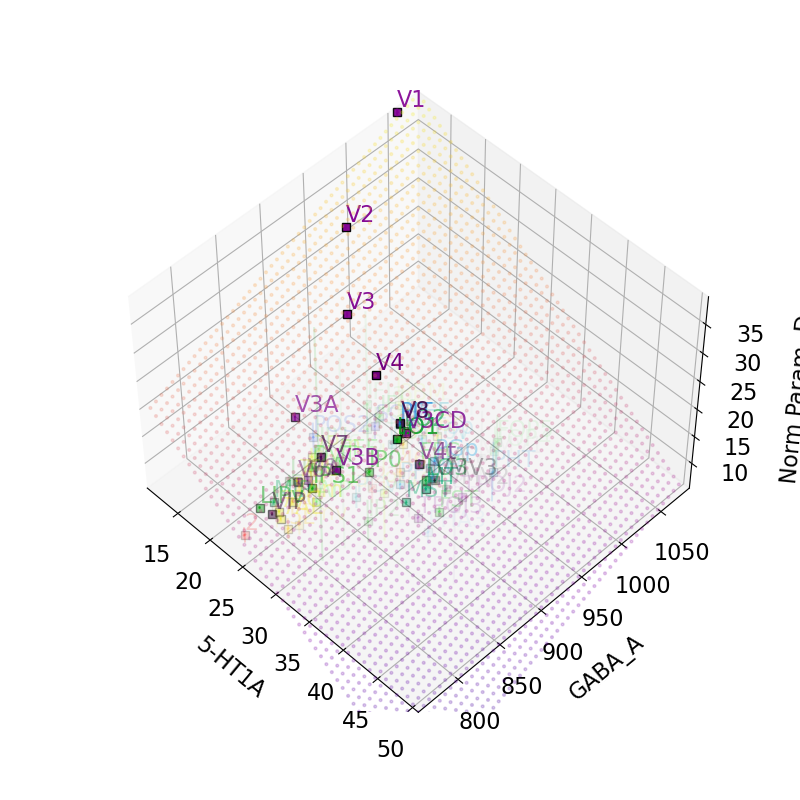

wR2 (fit on full data, eval on roi means), by sklearn: 0.446
wCC prediction (fit on full data, eval on roi means) 0.6954

wR2 (fit on roi means, eval on roi means), by sklearn: 0.5053
wCC prediction (fit on roi means, eval on roi means) 0.7109
Estimated OLS betas (fit on roi means) Norm Param. D Norm_abcd [-0.5767  0.0662]

wR2 (fit on full data, eval on full data), by sklearn: 0.6072
wCC prediction (fit on full data, eval on full data) 0.7792
Estimated OLS betas (fit on full data) Norm Param. D Norm_abcd [-0.8881  0.0637]


<IPython.core.display.Javascript object>


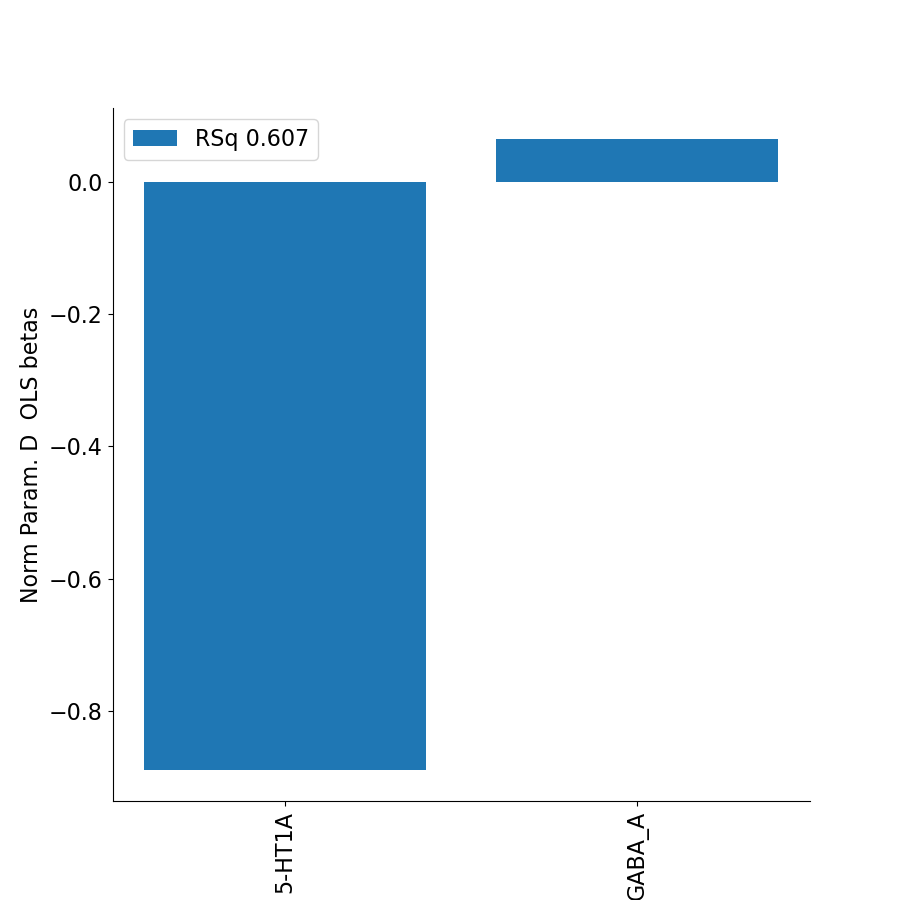

0

In [6]:
#%%capture
display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#fsnative vox vol for correction: 4.8270
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT','Norm Param. B', 'Norm Param. D','RSq']#, 'Eccentricity','Size (sigma_1)','Size (sigma_2)']#

x_dims_idx = [1,2]
y_dims_idx = [6]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','VO','IPS']#, 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'LO1', 'LO2', 'TO1', 'TO2', 'V3A', 'V3B', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'FEF']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
# rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
# 'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
# 'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_wang_ecc65rsq015/ols'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#-CVmedian

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

#for y_dims_idx in [[5],[6]]:
#    for x_dims_idx in [[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]:
#for x_dims_idx in [[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]:    

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = False, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = True, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = True, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## PCA

HCP fit-task-BAR_fit-runs-all 100610
HCP fit-task-BAR_fit-runs-all 102311
HCP fit-task-BAR_fit-runs-all 102816
HCP fit-task-BAR_fit-runs-all 104416
HCP fit-task-BAR_fit-runs-all 105923
HCP fit-task-BAR_fit-runs-all 108323
HCP fit-task-BAR_fit-runs-all 109123
HCP fit-task-BAR_fit-runs-all 111312
HCP fit-task-BAR_fit-runs-all 111514
HCP fit-task-BAR_fit-runs-all 114823
HCP fit-task-BAR_fit-runs-all 115017
HCP fit-task-BAR_fit-runs-all 115825
HCP fit-task-BAR_fit-runs-all 116726
HCP fit-task-BAR_fit-runs-all 118225
HCP fit-task-BAR_fit-runs-all 125525
HCP fit-task-BAR_fit-runs-all 126426
HCP fit-task-BAR_fit-runs-all 128935
HCP fit-task-BAR_fit-runs-all 130114
HCP fit-task-BAR_fit-runs-all 130518
HCP fit-task-BAR_fit-runs-all 131217
HCP fit-task-BAR_fit-runs-all 131722
HCP fit-task-BAR_fit-runs-all 132118
HCP fit-task-BAR_fit-runs-all 134627
HCP fit-task-BAR_fit-runs-all 134829
HCP fit-task-BAR_fit-runs-all 135124
HCP fit-task-BAR_fit-runs-all 137128
HCP fit-task-BAR_fit-runs-all 140117
H

fsaverage fit-task-BAR_fit-runs-all 171633
fsaverage fit-task-BAR_fit-runs-all 172130
fsaverage fit-task-BAR_fit-runs-all 173334
fsaverage fit-task-BAR_fit-runs-all 175237
fsaverage fit-task-BAR_fit-runs-all 176542
fsaverage fit-task-BAR_fit-runs-all 177140
fsaverage fit-task-BAR_fit-runs-all 177645
fsaverage fit-task-BAR_fit-runs-all 177746
fsaverage fit-task-BAR_fit-runs-all 178142
fsaverage fit-task-BAR_fit-runs-all 178243
fsaverage fit-task-BAR_fit-runs-all 178647
fsaverage fit-task-BAR_fit-runs-all 180533
fsaverage fit-task-BAR_fit-runs-all 181232
fsaverage fit-task-BAR_fit-runs-all 181636
fsaverage fit-task-BAR_fit-runs-all 182436
fsaverage fit-task-BAR_fit-runs-all 182739
fsaverage fit-task-BAR_fit-runs-all 185442
fsaverage fit-task-BAR_fit-runs-all 186949
fsaverage fit-task-BAR_fit-runs-all 187345
fsaverage fit-task-BAR_fit-runs-all 191033
fsaverage fit-task-BAR_fit-runs-all 191336
fsaverage fit-task-BAR_fit-runs-all 191841
fsaverage fit-task-BAR_fit-runs-all 192439
fsaverage f

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V3CD
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A', 'Norm Param. D Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'RSq Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Sample size: 768
performing PCA
fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_V4
X-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', 'GABA_A']
Y-dims: ['Norm Param. D Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd']
alldims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HTT', '

<IPython.core.display.Javascript object>


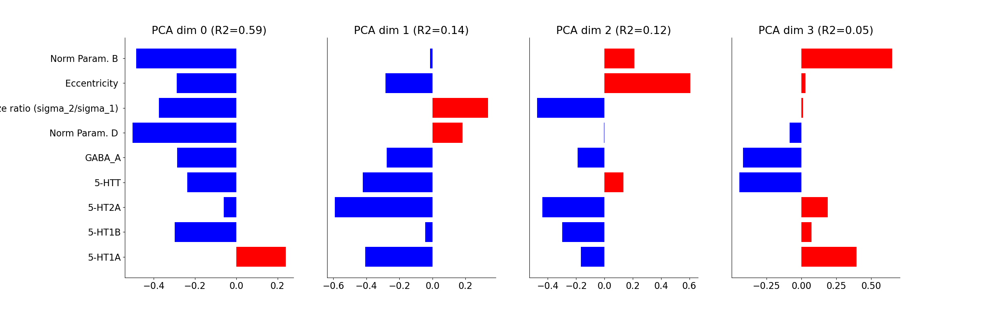

rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15
rsq thresh<0.15. setting pca pycortex vmax2=0.15


<IPython.core.display.Javascript object>


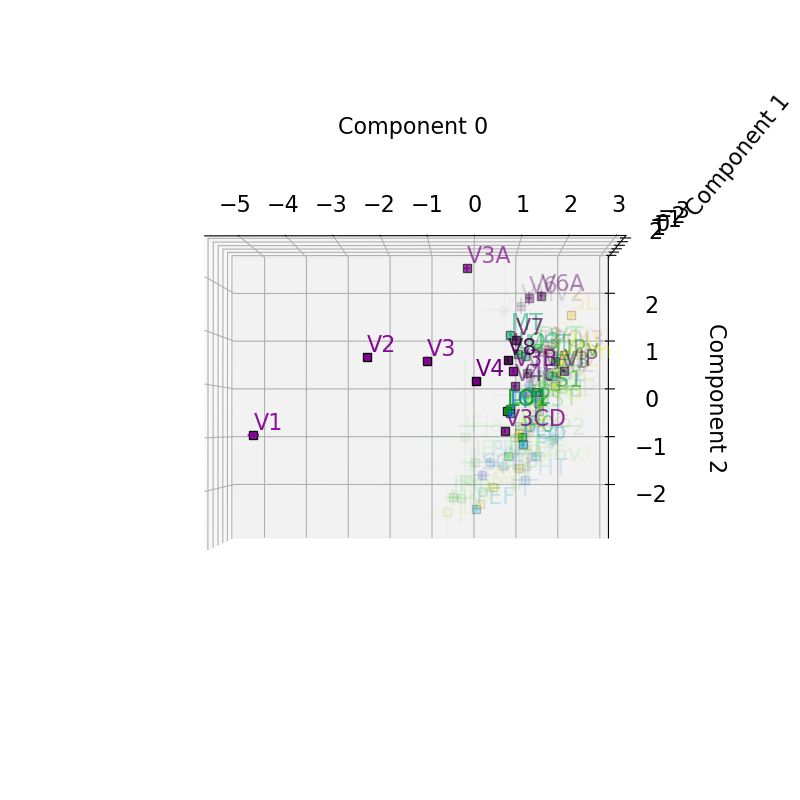

Started server on port 27002


0

In [10]:
#%%capture
display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT','Amplitude','Surround Amplitude', 'Eccentricity','Norm Param. B', 'Norm Param. D', 'Size ratio (sigma_2/sigma_1)','RSq']#

x_dims_idx = [0,1,2,3,4]
y_dims_idx = [7,8,9,10]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS', 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1']#, 'combined']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_glasser_ecc65rsq030/pca'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#''fit-task-BAR_fit-runs-CVmedian'# 'fit-task-BAR_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = True, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = True, vis_pca_pycortex = True, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1,2], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## PLS

In [ ]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

#parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Amplitude','Surround Amplitude', 'Polar Angle',
#              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,]#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

parameters = ['5-HT1A', '5-HT1B', '5-HT2A', 'GABA_A', '5-HTT', 'Eccentricity','Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)','RSq']#

x_dims_idx = [0,1,2,3,4]
y_dims_idx = [5,6,7,8,9]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.IPS','all_custom']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS', 'combined']#['Brain'] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1']#, 'combined']
#rois = ['all_custom']
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
rois.append('combined')
        
rsq_thresh = 0.0
save_figures= False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/attemptwnames_glasser_ecc65rsq030/pls'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#'fit-task-BAR_fit-runs-CVmedian'

subject_ids = ['fsaverage_cvrsq']#['fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data= False, zscore_data_across_rois = True, 
                          size_response_curves = False, plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                          #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = False, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = True, vis_pls_pycortex = False)

os.system(f"open {sound_file}")


## Size-response curves

In [ ]:
vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['analysis_info'] = vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all']['100610']['analysis_info']

In [ ]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Polar Angle',
              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,'Amplitude','Surround Amplitude']#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

x_dims_idx = [0,1,2,3,4,5]
y_dims_idx = [12,13]

third_dim_sr_curves = '5-HT1A'#'Norm Param. D Norm_abcd'

rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.VO','custom.IPS']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','VO','IPS']#,'combined']#[roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
#rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'combined']
#rois = ['all_custom']
        
rsq_thresh = 0.15
save_figures = False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/newfsarsqwmlowthr/size_response_glasser'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data = False, zscore_data_across_rois = False, 
                          size_response_curves = True, third_dim_sr_curves = third_dim_sr_curves,
                          plot_corr_matrix = False, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                            #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = False, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")

In [ ]:
[[3, 4], [2, 4], [2, 3], [1, 4], [1, 3], [1, 2], [0, 4], [0, 3], [0, 2], [0, 1]]

In [ ]:
import itertools

N = 4
numbers = list(range(N+1))

combinations = []
for i in range(1, N+2):
    combinations.extend(itertools.combinations(numbers, i))

print(combinations[::-1])

## Correlation matrix

fsaverage fit-task-BAR_fit-runs-all fsaverage_cvrsq
thresholding at 27.290789658414187 subjects
fsaverage fit-task-BAR_fit-runs-all fsaverage_cvrsq
Make sure bold_voxel_volume is specified in mm^3
Upsampling correction factor: [2.1213]
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordere

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_

Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
Ordered dimensions: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm_abcd', 'Ratio (B/D) Norm_

<IPython.core.display.Javascript object>


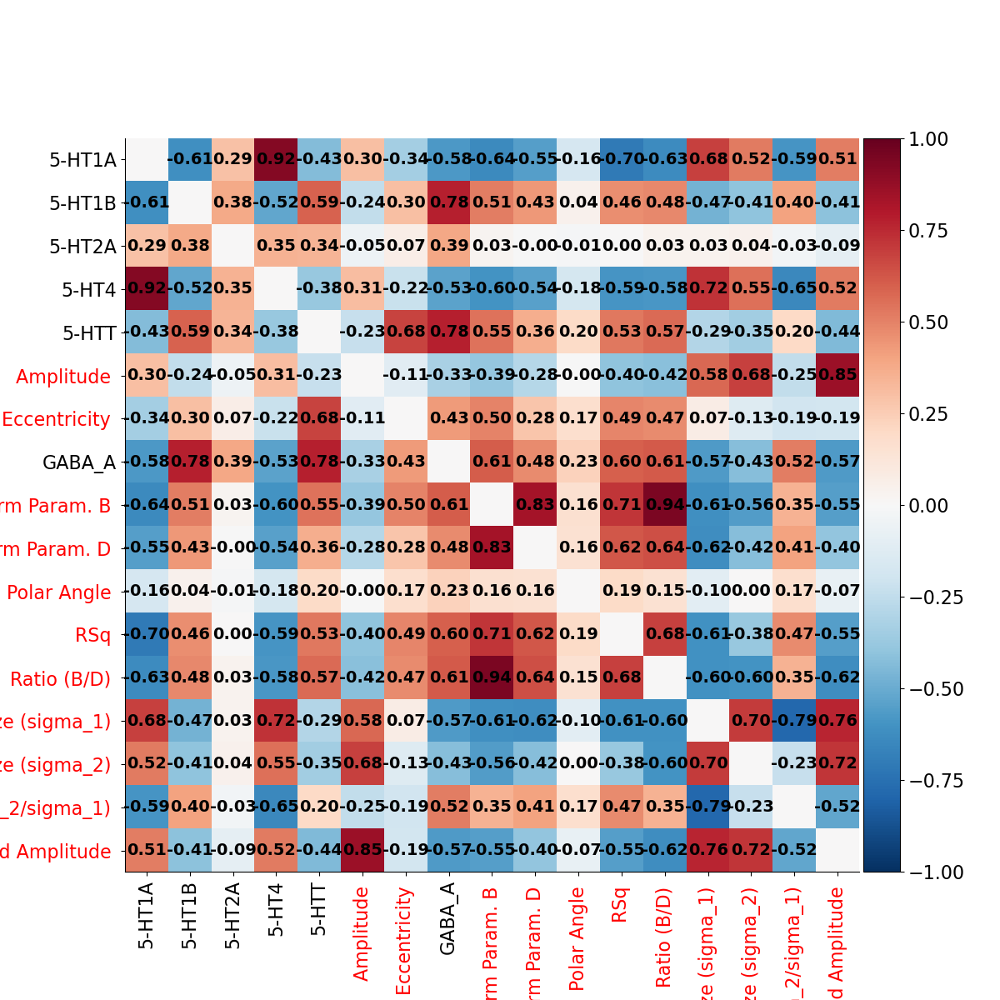

fit-task-BAR_fit-runs-all fsaverage_cvrsq glasser_1
X-dims: ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd']
Y-dims: ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'GABA_A', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
alldims ['Eccentricity Norm_abcd', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'Size (sigma_1) Norm_abcd', 'Size (sigma_2) Norm_abcd', '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'GABA_A', 'RSq Norm_abcd', 'Ratio (B/D) Norm_abcd', 'Size ratio (sigma_2/sigma_1) Norm_abcd', 'Surround Amplitude Norm_abcd']
ord dims ['5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'Amplitude Norm_abcd', 'Eccentricity Norm_abcd', 'GABA_A', 'Norm Param. B Norm_abcd', 'Norm Param. D Norm_abcd', 'Polar Angle Norm_abcd', 'RSq Norm

0

In [6]:
#%%capture
#display(HTML("<style>div.output_scroll { height: 150em; }</style>"))
pl.close('all')
#generalized quantitative parameter plots
#'Eccentricity'#'Suppression Index (full)'#'Suppression Index#'Size (fwhmax)'#'Surround Size (fwatmin)'
#'Norm Param. B'#''Ratio (B/D)'#'Norm Param. D'#'RSq'#'CCrsq_task-1R'#'CSS Exponent'#'Amplitude'
#'Surround Amplitude'#'Size (sigma_1)'##'Size (sigma_2)'
#'Size ratio (sigma_2/sigma_1)'#C/A#'B/A'#'D/C'#'D/A'#'B/C'#'Surround volume (full)'#'Centre volume (full)'
#'(A+B)/(C+D)'#'(A*B)/(C*D)'#'(A*D)/(C*B)'#'(A+D)/(C+B)'#'Point-stim derivative'#'(C(A+B))/(A(C+D))'
#'Min/Max Response Ratio'#'Max/Min Response Ratio'#'A(C+D)/C(A+B)'##Min/Max Response Ratio (with BD)'
#'A/C'
####DoG
#'Surround volume (full)'
#'Surround/Centre Amplitude' 
#'Surround-Centre Amplitude'
#'Surround-Centre Volume'

parameters = ['Eccentricity', 'Norm Param. B', 'Norm Param. D', 'Size (sigma_1)','Size (sigma_2)', 'Polar Angle', 'Size ratio (sigma_2/sigma_1)', 'Ratio (B/D)',
              '5-HT1A', '5-HT1B', '5-HT2A', '5-HT4', '5-HTT', 'GABA_A','Amplitude','Surround Amplitude', 'RSq']#,'Amplitude','Surround Amplitude']#'Size ratio (sigma_2/sigma_1)']# 'Size (sigma_1)', 'Size (sigma_2)', 'Amplitude','Surround Amplitude']

x_dims_idx = [0,1,2,3,4,5]
y_dims_idx = [6,7,8,9,10,11,12,13,14,15,16]

#rois = ['custom.V1', 'custom.V2', 'custom.V3','custom.V3AB','custom.hV4','custom.LO','custom.TO','custom.VO','custom.IPS']
#rois = ['V1', 'V2', 'V3','V3AB','hV4','LO','TO','VO','IPS']#,'combined']#[roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi] #'V1', 'V2', 'V3','V3AB','hV4','LO','TO','IPS','combined', 
rois = [roi for roi in vis_res.idx_rois['fsaverage'] if 'glasser' in roi]
#rois = ['glasser_V1','glasser_V2','glasser_V3','glasser_V4','glasser_V3A','glasser_V7','glasser_V3B','glasser_V3CD',
#'glasser_LO1','glasser_LO2','glasser_PIT','glasser_V8','glasser_VMV3',
#'glasser_IPS1','glasser_IP0','glasser_PGp','glasser_LO3','glasser_MT','glasser_V4t','glasser_FFC']
#rois = [ 'V1', 'V2', 'V3', 'hV4', 'VO1', 'VO2', 'PHC1', 'PHC2', 'TO2', 'TO1', 'LO2', 'LO1', 'V3B', 'V3A', 'IPS0', 'IPS1', 'IPS2', 'IPS3', 'IPS4', 'IPS5', 'SPL1', 'combined']
#rois = ['all_custom']
rois.append('combined') 
    
rsq_thresh = 0.0
save_figures = False
figure_path = '/Volumes/Crucial X8/PRFMapping/Figures/newfsarsqwmlowthr/correlation_matrix'

space_names = 'fsaverage'
#set to 'all' to plot all analyses
analysis_names = 'fit-task-BAR_fit-runs-all'#'Mean analysis'#

subject_ids = ['fsaverage_cvrsq']#'fsaverage_hcp1sthalf', 'fsaverage_hcp2ndhalf']

threshold_li = filters.threshold_li(vis_res.main_dict[space_names][analysis_names][subject_ids[0]]['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd'])

vis_res.set_alpha(only_models=['Norm_abcd'], ecc_min=0.0, ecc_max=8.0, min_number_sjs=threshold_li)

vis_res.multidim_analysis(parameters, rois, rsq_thresh, save_figures, figure_path, space_names = space_names, parameter_toplevel='Receptor Maps', rsq_weights= True,
                    analysis_names = analysis_names, subject_ids = subject_ids, x_dims_idx=x_dims_idx, y_dims_idx=y_dims_idx,
                          zscore_data = False, zscore_data_across_rois = False, 
                          size_response_curves = False, third_dim_sr_curves = None,
                          plot_corr_matrix = True, perform_ols = False, polar_plots = False,
                             cv_regression = False, bold_voxel_volume=4.096, zconfint_err_alpha=None, quantile_exclusion=0.999,
                            #vis_pca_comps_rois: fr which rois to make pca comp beta plots; 
                          #vis_pca_comps_axes: which comps to use in 2d plot of mean pca comp per roi
                        perform_pca = False, vis_pca_pycortex = False, vis_pca_comps_rois = ['combined'], vis_pca_comps_axes = [0,1], rsq_alpha_pca_plot = True,
                          perform_pls = False, vis_pls_pycortex = False)

os.system(f"open {sound_file}")

# HCP Crossvalidation

## Simple viz

In [ ]:
full_rsq = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))
full_rsq_gauss = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Gauss'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))

In [ ]:
nc = np.concatenate(tuple([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['Noise Ceiling']['Noise Ceiling (RSq)'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()]))


In [ ]:
thresh = -10
#mask_rsq = ((nc>thresh) + (full_rsq>thresh) + (full_rsq_gauss>thresh)) * (full_rsq_gauss!=0) * (full_rsq!=0) * ((nc>-5) * (full_rsq>-5) * (full_rsq_gauss>-5))
mask_rsq = (nc>thresh) * (full_rsq>thresh) * (full_rsq_gauss>thresh) #* (full_rsq_gauss!=0) * (full_rsq!=0) 

In [ ]:
np.nanquantile(nc[mask_rsq],0.1)

In [ ]:
pl.figure(figsize=(16,8))
pl.hist(full_rsq_gauss[mask_rsq],bins=np.linspace(thresh,1,1000), label='gauss cvr2', alpha=0.8)
pl.hist(full_rsq[mask_rsq],bins=np.linspace(thresh,1,1000), label='DN cvr2', alpha=0.8)
pl.hist(nc[mask_rsq],bins=np.linspace(thresh,1,1000), label='noise ceiling', alpha=0.8)
pl.axvline(np.mean(full_rsq[mask_rsq]), color='r', linestyle='dashed', linewidth=1, label=f'DN cvr2 mean ({np.mean(full_rsq[mask_rsq]):.2f})')
pl.axvline(np.mean(full_rsq_gauss[mask_rsq]), color='k', linestyle='dashed', linewidth=1, label=f'gauss cvr2 mean ({np.mean(full_rsq_gauss[mask_rsq]):.2f})')
pl.axvline(np.mean(nc[mask_rsq]), color='b', linestyle='dashed', linewidth=1, label=f'noise ceiling mean ({np.mean(nc[mask_rsq]):.2f})')
pl.axvline(np.median(full_rsq[mask_rsq]), color='r', linewidth=1, label=f'DN cvr2 median ({np.median(full_rsq[mask_rsq]):.2f}) ')
pl.axvline(np.median(full_rsq_gauss[mask_rsq]), color='k', linewidth=1, label=f'gauss cvr2 median ({np.median(full_rsq_gauss[mask_rsq]):.2f})')
pl.axvline(np.median(nc[mask_rsq]), color='b', linewidth=1, label=f'noise ceiling median ({np.median(nc[mask_rsq]):.2f})')
pl.legend()

pl.title(f'crossvalidated r2 distribution and noise ceiling (threshold: {thresh:.2f}. vertices: {np.sum(mask_rsq)})')

In [ ]:
pl.figure(figsize=(16,8))
diff = full_rsq[mask_rsq]-full_rsq_gauss[mask_rsq]
pl.hist(diff,bins=1000, label='diff', alpha=0.8)
pl.axvline(np.mean(diff), color='k', linestyle='dashed', linewidth=1, label='diff cvr2 mean')
pl.axvline(np.median(diff), color='k', linewidth=1, label='diff cvr2 median')
pl.legend()
pl.xlim((-1,1))

## Combining no-cv results with CV-rsq and # of subjects map

In [7]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
with open('/Volumes/Crucial X8/maindict_HCP_cv.pickle', 'rb') as handle:
    dict_cv=dill.load(handle)

In [6]:
dict_cv = vis_res.main_dict

In [7]:
l = [sj for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-all'].keys()]
l.sort()

In [ ]:
m = [sj for sj in dict_cv['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys() if sj in l]
m.sort()

In [10]:
hcp_group_average = dict()
ds_pyc = dict()

#only works on fsaverage because 'HCP' is not treated as a common space so it has one fewer layer in depth
#create the HCP_cvrsq subject manually if you want to do it in HCP space
space = 'fsaverage'  
if space == 'fsaverage':
    pyc_sj = 'fsaverage'
else:
    pyc_sj = '999999'

weights = np.nan_to_num(np.array([dict_cv[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))
weights[weights<=0] = 0

sj_number_map = np.sum(weights>0, axis=0)
threshold_li = filters.threshold_li(sj_number_map)
print(threshold_li)

for param in ['RSq', 'x_pos', 'y_pos','Norm Param. B','Norm Param. D','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)','Size (sigma_1)','Size (sigma_2)', 'hrf_1', 'hrf_2']:
    if param == 'x_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.cos(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'y_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.sin(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    
    elif param == 'RSq':
        data = np.copy(weights)
    else:
        data = np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][sj]['Processed Results'][param]['Norm_abcd'] for sj in m]))

    if param == 'RSq':
        hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
    else:
        hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)


# with open('/Volumes/Crucial X8/maindict_HCP_cv.pickle', 'rb') as handle:
#     dict_cv_no_hrf_fit=dill.load(handle)
# hcp_group_average['Rsqdiff_hrf_fit'] = np.nanmean(np.nan_to_num(np.array([vis_res.main_dict[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd']-\
#                                                                           dict_cv_no_hrf_fit[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m])), axis=0)

    
hcp_group_average['Polar Angle'] = np.arctan2(hcp_group_average['y_pos'], hcp_group_average['x_pos'])
hcp_group_average['Eccentricity'] = np.sqrt(hcp_group_average['y_pos']**2 + hcp_group_average['x_pos']**2) 
hcp_group_average['#Subjects with CVRSq>0'] = np.copy(sj_number_map)



27.290789658414187


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_69070/4176190186.py:31: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_69070/4176190186.py:33: RuntimeWarning: invalid value encountered in true_divide
  hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)


In [11]:
for param in hcp_group_average:
    vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results'][param]['Norm_abcd'] = np.copy(hcp_group_average[param])


vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd']=np.nan_to_num(vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd'])
vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']


/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_69070/3676781436.py:6: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
/var/folders/vb/gdqfj5px0gb7r_bgl5hpf8n00000gn/T/ipykernel_69070/3676781436.py:7: RuntimeWarning: invalid value encountered in true_divide
  vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space]['fit-task-BAR_fit-runs-all'][f'{space}_cvrsq']['Processed Resul

In [22]:
#HCP_hrffit #HCP_99hrffit #hrffit_onlyfsavcvrsq
with open('/Volumes/Crucial X8/maindict_hrffit_onlyfsavcvrsq.pickle', 'rb') as handle:
    dict_hrffit=dill.load(handle)

pyc_sj = 'fsaverage'
sj_number_map = dict_hrffit['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['#Subjects with CVRSq>0']['Norm_abcd']
hcp_group_average = dict()
ds_pyc = dict()
hcp_group_average['Rsqdiff_hrf_fit'] = dict_hrffit['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['RSq']['Norm_abcd']-vis_res.main_dict['fsaverage']['fit-task-BAR_fit-runs-all']['fsaverage_cvrsq']['Processed Results']['RSq']['Norm_abcd']

In [23]:
for param in hcp_group_average:
    if param == 'Polar Angle':
        pyc_cmap = 'hsvx2'
        vmin1 = -3.1415
        vmax1 = 3.1415
    elif param in ['x_pos', 'y_pos']:
        pyc_cmap = 'nipy_spectral'
        vmin1 = -4
        vmax1 = 4
    elif param == 'RSq':
        pyc_cmap = 'inferno'
        vmin1 = 0
        vmax1 = 0.3  
    elif param == 'Rsqdiff_hrf_fit':
        pyc_cmap = 'RdBu_r'
        vmin1 = -0.1
        vmax1 = 0.1
    elif param == 'Norm Param. B':
        pyc_cmap = 'viridis_r'
        vmin1 = 0#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = 100#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)      
    elif param == 'Norm Param. D':
        pyc_cmap = 'inferno_r'
        vmin1 = 1#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = 100#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)     
    else:
        pyc_cmap = 'nipy_spectral'
        vmin1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)
        
    ds_pyc[f"{param}"] = Vertex2D_fix(hcp_group_average[param], sj_number_map, subject=pyc_sj, 
                                                        vmin=vmin1, 
                                                        vmax=vmax1, 
                                                        vmin2=threshold_li, vmax2=threshold_li+1, cmap=pyc_cmap)

# select path for static viewer on disk
viewer_path = '/Users/marcoaqil/Downloads'

# create viewer
#cortex.webgl.make_static(outpath=viewer_path, data=ds_pyc, recache=True)
cortex.webgl.show(ds_pyc)

Started server on port 38583


<JS: window.viewer>

<IPython.core.display.Javascript object>


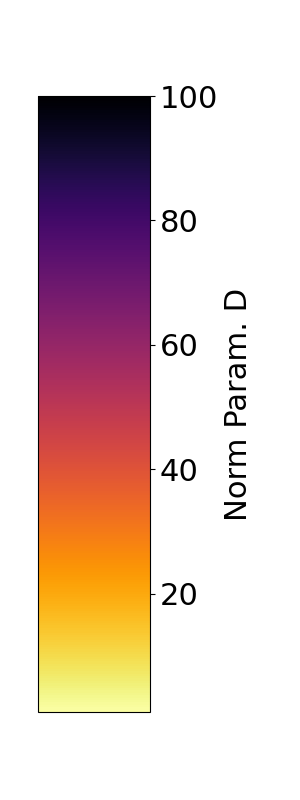

In [94]:
pl.close('all')
# for param in ['x_pos', 'y_pos']:
#     fig = simple_colorbar(vmin=-4,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.05),
#                 vmax=4,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.95),
#                 cmap_name=pyc_cmap, ori='horizontal', param_name=param)
for param in ['Norm Param. D']:
    fig = simple_colorbar(vmin=1,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.05),
                vmax=100,#np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.95),
                cmap_name='inferno_r', ori='vertical', param_name=param)


## CVR2 maps tests (neg values not set to zero, median)

In [ ]:
cvrsq_raw_mean = np.mean([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)
cvrsq_raw_median = np.median([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)

cvrsq_raw_number_sj = np.sum([vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd']>0 for sj in vis_res.main_dict['HCP']['fit-task-BAR_fit-runs-CVmedian'].keys()], axis=0)


In [ ]:
(cvrsq_raw_mean>0).sum()/len(cvrsq_raw_mean)

In [ ]:
rsq_thresh = 0.0
rsq_max_opacity = 0.15
ds_rsq=dict()
ds_rsq[f"cvrsq_raw_mean"] = cortex.Vertex(cvrsq_raw_mean, subject='999999', 
                                vmin=np.nanquantile(cvrsq_raw_mean,0.1), 
                                vmax=np.nanquantile(cvrsq_raw_mean,0.9), cmap='nipy_spectral')
ds_rsq[f"cvrsq_raw_median"] = cortex.Vertex(cvrsq_raw_median, subject='999999', 
                                vmin=np.nanquantile(cvrsq_raw_median,0.1), 
                                vmax=np.nanquantile(cvrsq_raw_median,0.9), cmap='nipy_spectral')
ds_rsq[f"cvrsq_raw_number_sj"] = cortex.Vertex(cvrsq_raw_number_sj, subject='999999', 
                                vmin=8, 
                                vmax=150, cmap='nipy_spectral')
cortex.webgl.show(ds_rsq)

In [ ]:
from skimage import filters
threshold_yen = filters.threshold_yen(cvrsq_raw_number_sj) #yen=43, otsu=56, isodata=56, li=22, mean=16.54, minimum=89, triangle=8
threshold_otsu = filters.threshold_otsu(cvrsq_raw_number_sj)
threshold_isodata = filters.threshold_isodata(cvrsq_raw_number_sj)
threshold_li = filters.threshold_li(cvrsq_raw_number_sj)
threshold_mean = filters.threshold_mean(cvrsq_raw_number_sj)
threshold_minimum = filters.threshold_minimum(cvrsq_raw_number_sj)
threshold_triangle = filters.threshold_triangle(cvrsq_raw_number_sj)

In [ ]:
thresh

In [ ]:
np.sum(cvrsq_raw_number_sj>thresh)/len(cvrsq_raw_number_sj)

In [ ]:
pl.figure()
pl.hist(cvrsq_raw_number_sj,bins=175)
pl.axvline(threshold_yen, linestyle='--', color='k', label = f"Yen ({threshold_yen:.1f})")
pl.axvline(threshold_otsu, linestyle='--', color='r', label = f"Otsu ({threshold_otsu:.1f})")
pl.axvline(threshold_isodata, linestyle='--', color='g', label = f"Iso ({threshold_isodata:.1f})")
pl.axvline(threshold_li, linestyle='--', color='b', label = f"Li ({threshold_li:.1f})")
pl.axvline(threshold_mean, linestyle='--', color='orange', label = f"Mean ({threshold_mean:.1f})")
pl.axvline(threshold_minimum, linestyle='--', color='pink', label = f"Minimum ({threshold_minimum:.1f})")
pl.axvline(threshold_triangle, linestyle='--', color='yellow', label = f"Triangle ({threshold_triangle:.1f})")
pl.xlabel('# subjects with cvR2>0')
pl.ylabel('# vertices')
pl.yscale('log')
pl.legend()

# Something wrong with subj 115017. investigate

In [ ]:
vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj].keys()

In [ ]:
for sj in vis_res.main_dict['HCP']['fit-task-all_fit-runs-all']:
    print(sj)
    print(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj]['mask'].sum())
    print(vis_res.main_dict['HCP']['fit-task-all_fit-runs-all'][sj]['Results']['Gauss'].shape)

In [ ]:
#rsqwm have rsq-weighted means over subjects on fsaverage
#maindict_ #allall, allruns_sepcond_rsqwm, 5050CV, allruns_sepcond_zsc, HCP_181subjects_rsqwm, HCP_999999, 99mean181, 99split20, HCP_cv (tcfit), HCP_tc_nocv
with open('/Volumes/Crucial X8/maindict_HCP_cv.pickle', 'rb') as handle:
    dict_cv=dill.load(handle)

In [ ]:
vis_res.main_dict[space][an_name].keys()

In [ ]:
hcp_group_average = dict()
ds_pyc = dict()
an_name = 'fit-task-all_fit-runs-all'
space = 'fsaverage'  #'HCP'#fsaverage

m = [sj for sj in vis_res.main_dict[space][an_name].keys()]
m.sort()

if space == 'fsaverage':
    pyc_sj = 'fsaverage'
else:
    pyc_sj = '999999'

#cvrsq
weights = np.nan_to_num(np.array([dict_cv[space]['fit-task-BAR_fit-runs-CVmedian'][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))
#noncvrsq
#weights = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['RSq']['Norm_abcd'] for sj in m]))

weights[weights<=0] = 0

sj_number_map = np.sum(weights>0, axis=0)
threshold_li = filters.threshold_li(sj_number_map)
print(threshold_li)

for param in ['RSq', 'x_pos', 'y_pos','Norm Param. B','Norm Param. D','Amplitude', 'Surround Amplitude','Size (fwhmax)','Surround Size (fwatmin)','Size (sigma_1)','Size (sigma_2)']:
    if param == 'x_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.cos(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'y_pos':
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Eccentricity']['Norm_abcd'] for sj in m])*np.sin(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results']['Polar Angle']['Norm_abcd'] for sj in m])))
    elif param == 'RSq':
        data = np.copy(weights)
    else:
        data = np.nan_to_num(np.array([vis_res.main_dict[space][an_name][sj]['Processed Results'][param]['Norm_abcd'] for sj in m]))

    if param == 'RSq':
        hcp_group_average[param] = (data*(weights>0)).sum(0)/(weights>0).sum(0)
    else:
        hcp_group_average[param] = (data*weights).sum(0)/weights.sum(0)
    
hcp_group_average['Polar Angle'] = np.arctan2(hcp_group_average['y_pos'], hcp_group_average['x_pos'])
hcp_group_average['Eccentricity'] = np.sqrt(hcp_group_average['y_pos']**2 + hcp_group_average['x_pos']**2) 
hcp_group_average['#Subjects with CVRSq>0'] = np.copy(sj_number_map)


In [ ]:
if space == 'HCP':
    vis_res.main_dict[space][an_name][f'{space}_cvrsq'] = dd(lambda:dd(dict))

for param in hcp_group_average:
    
    vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results'][param]['Norm_abcd'] = np.copy(hcp_group_average[param])
    

vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd']=np.nan_to_num(vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['RSq']['Norm_abcd'])
vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size ratio (sigma_2/sigma_1)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_2)']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Size (sigma_1)']['Norm_abcd']
vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Ratio (B/D)']['Norm_abcd']=vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. B']['Norm_abcd']/vis_res.main_dict[space][an_name][f'{space}_cvrsq']['Processed Results']['Norm Param. D']['Norm_abcd']


In [64]:
for param in hcp_group_average:
    if param == 'Polar Angle':
        pyc_cmap = 'hsvx2'
        vmin1 = -3.1415
        vmax1 = 3.1415
    else:
        pyc_cmap = 'nipy_spectral'
        vmin1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.1)
        vmax1 = np.nanquantile(hcp_group_average[param][sj_number_map>threshold_li],0.9)
        
    ds_pyc[f"{param}"] = Vertex2D_fix(hcp_group_average[param], sj_number_map, subject=pyc_sj, 
                                                        vmin=vmin1, 
                                                        vmax=vmax1, 
                                                        vmin2=threshold_li, vmax2=threshold_li+1, cmap=pyc_cmap)

# select path for static viewer on disk
viewer_path = '/Users/marcoaqil/Downloads'

# create viewer
#cortex.webgl.make_static(outpath=viewer_path, data=ds_pyc, recache=True)
cortex.webgl.show(ds_pyc)

/Users/marcoaqil/pycortex/cortex/dataset/views.py:207: UserWarning: Trying to register the cmap 'hsvx2' which already exists.
  cm.register_cmap(self.cmap,cmap)


Started server on port 49808


<JS: window.viewer>

In [11]:
for space, space_res in vis_res.main_dict.items(): 
    print(space)
    if space == 'fsnative' or space == 'HCP':
        for analysis, analysis_res in space_res.items():
            print(analysis)
            for subj, subj_res in analysis_res.items():
                print(subj)

marcus_dict = deepcopy(vis_res.main_dict['fsnative']['fit-task-2R_fit-runs-all']['sub-006'])
marcus_dict['idx_rois'] = deepcopy(vis_res.idx_rois['sub-006'])
with open('/Volumes/Crucial X8/marcus_dict.pickle', 'wb') as handle:
     dill.dump(marcus_dict, handle)

fsnative
fit-task-1R_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-1S_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-2R_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-4F_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fit-task-4R_fit-runs-all
sub-001
sub-002
sub-003
sub-004
sub-005
sub-006
sub-007
fsaverage
T1w


In [6]:
for space, space_res in vis_res.main_dict.items(): 
    print(space)
    if space == 'fsnative' or space == 'HCP':
        for analysis, analysis_res in space_res.items():
            print(analysis)
            for subj, subj_res in analysis_res.items():
                print(subj)
                for model in ['Gauss', 'Norm_abcd']:
                    subj_res['Processed Results']['hrf_1'][model] = subj_res['Results'][model][:,-3]
                    subj_res['Processed Results']['hrf_2'][model] = subj_res['Results'][model][:,-2]

HCP
fit-task-BAR_fit-runs-CVmedian
115017
109123
105923
111514
100610
115825
102816
116726
118225
126426
108323
104416
114823
125525
102311
128935
fit-task-BAR_fit-runs-all
100610
102311
102816
104416
105923
108323
109123
111514
114823
115017
115825
116726
118225
125525
126426
128935
130114
130518
131217
131722
132118
134627
134829
135124
137128
140117
144226
145834
146129
146735
146937
148133
fit-task-BAR_fit-runs-0
100610
102311
102816
104416
105923
108323
109123
111514
114823
115017
115825
116726
118225
125525
126426
128935
fit-task-BAR_fit-runs-1
100610
102311
102816
104416
105923
108323
109123
111514
114823
115017
115825
116726
118225
125525
126426
128935
fsaverage
